# Business Problem Understanding

## Context
Olist adalah sebuah perusahaan yang mengintegrasikan pasar e-commerce di Brasil. Olist menyediakan platform yang memungkinkan penjualan langsung di berbagai situs e-commerce di negara Brasil. Dengan platform ini, pengusaha dapat terhubung dengan pengecer besar serta memudahkan pemilik toko untuk beriklan dan menjual produk mereka. Hal ini membantu perusahaan ritel menjangkau pasar yang lebih luas, meningkatkan pengalaman belanja, dan mengubah perilaku pembelian. Olist menghubungkan bisnis kecil dari seluruh Brasil dengan saluran penjualan yang efisien, memungkinkan pedagang untuk menjual produk melalui Olist dan mengirimkannya langsung kepada pelanggan menggunakan mitra logistik Olist.




## Problem Statement

Perusahaan bermaksud melakukan analisis untuk memahami perilaku pelanggan pada platform e-commerce mereka. Dalam upaya meningkatkan kinerja bisnis, Olist Store ingin menganalisis data yang telah terkumpul secara mendalam. Tujuan utama Olist Store adalah untuk melihat *customer behavior* berdasarkan data, yang nantinya diharapkan dapat meningkatkan pengalaman pelanggan. Selain itu perusahaan juga ingin menganalisis churn pelanggan, agar nantinya secara keseluruhan meningkatkan kinerja bisnis.

Perusahaan ingin mengetahui pelanggan mana saja yang berpotensi akan *churn*, yaitu pelanggan yang kemungkinan besar akan berhenti menggunakan/bertransaksi di Olist. Hal ini penting untuk diketahui karena *churn rate* yang tinggi tidak baik bagi perusahaan. Mempertahankan pelanggan yang sudah ada lebih menguntungkan dibandingkan perlu menambah pelanggan baru (cr: [HBR](https://hbr.org/2014/10/the-value-of-keeping-the-right-customers)).

Perusahaan akan menerapkan sebuah metode promosi khusus bagi pelanggan yang berpotensi akan churn. Agar budget yang tersedia dapat digunakan lebih efektif, maka sebaiknya pelanggan yang diberikan metode promosi ini hanya pelanggan yang berpotensi churn saja. Meskipun jika pelanggan yang tidak berpotensi churn pun diberikan promosi dapat memberikan dampak positif berupa satisfaction/loyalty yang meningkat (cr: [NSU Dissertation](https://core.ac.uk/reader/51097630)), tetapi *concern* utama perusahaan adalah pelanggan-pelanggan yang berpotensi tinggi untuk *churn*.

## Goals

1. Memahami pola perilaku pelanggan: Menganalisis interaksi pelanggan, preferensi, dan perilaku pembelian di platform e-commerce Olist. Diharapkan dengan lebih memahami pola perilaku pelanggan, perusahaan dapat meningkatkan pengalaman pelanggan secara keseluruhan dengan mengidentifikasi area-area untuk peningkatan kepuasan pelanggan, dan menyesuaikan layanan untuk memenuhi kebutuhan dan preferensi pelanggan.
2. Menganalisis churn pelanggan: Meneliti faktor-faktor yang menyebabkan churn pelanggan, seperti ketidakpuasan, harga, atau kualitas layanan, dan mengembangkan strategi untuk mengurangi tingkat churn.

Dengan memanfaatkan wawasan yang diperoleh dari analisis data untuk mengoptimalkan strategi pemasaran, penawaran produk, dan proses operasional untuk meningkatkan pertumbuhan pendapatan dan profitabilitas bagi Olist Store dapat meningkatkan kinerja bisnis secara keseluruhan.


## Analytic Approach

Analisis Data: Menggunakan analisis statistik, algoritma pembelajaran mesin, dan teknik visualisasi data untuk mengeksplorasi pola, tren, dan korelasi dalam data agar dapat memperoleh *insight* mengenai pola perilaku pelanggan.

Prediksi Churn: Mengembangkan model prediktif untuk mengidentifikasi pelanggan yang berisiko churn dan menerapkan strategi retensi yang sesuai terhadap target.


<img src="matrix.png.png"/>

Type 1 error: False Positive\
Konsekuensi: Promosi diberikan pada pelanggan yang salah, berpotensi membuang resources

Type 2 error: False Negative\
Konsekuensi: Pelanggan yang berpeluang tinggi akan churn tidak diberikan promosi yang sesuai sehingga tetap churn

Kembali pada tujuan awal dibuatnya model, yaitu untuk mengetahui pelanggan mana yang akan churn, maka yang akan dilakukan adalah memastikan model dapat mengetahui pelanggan mana saja yang berpeluang churn agar perusahaan dapat memberikan promosi yang tepat. Maka sebisa mungkin hindari terjadinya type 2 error. Namun bukan berarti type 1 error dapat diabaikan begitu saja, karena jika terlalu banyak type 1 error pun dapat merugikan perusahaan. Resources yang seharusnya digunakan untuk pelanggan yang akan churn malah diarahkan ke pelanggan yang salah. Maka dari itu, metric utama yang dapat digunakan adalah F1-Score. Selain itu F1-Score juga baik digunakan jika data yang digunakan imbalanced.

# Data Understanding

Sumber dataset: https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce?select=product_category_name_translation.csv

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
mpl.rc('font', family='Calibri')
mpl.rc('axes', unicode_minus=False)

import random
from PIL import Image
from datetime import datetime
import unicodedata
from nltk.corpus import stopwords
import nltk
warnings.filterwarnings('ignore')
from wordcloud import WordCloud, STOPWORDS

COLOR_5S = '#0571b0'
COLOR_1S = '#ca0020'
REVIEWS_PALETTE = sns.color_palette((COLOR_1S, '#d57b6f', '#c6c6c6', '#7f9abc', COLOR_5S))

from lifetimes.utils import *
from lifetimes import BetaGeoFitter,GammaGammaFitter
from lifetimes.plotting import plot_probability_alive_matrix, plot_frequency_recency_matrix, plot_period_transactions, plot_cumulative_transactions,plot_incremental_transactions
from lifetimes.generate_data import beta_geometric_nbd_model
from lifetimes.plotting import plot_calibration_purchases_vs_holdout_purchases, plot_period_transactions,plot_history_alive

from scipy import stats
import scipy.stats as stats

import folium
from folium.plugins import HeatMap

from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer

from sklearn.model_selection import train_test_split

import statsmodels
import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, cohen_kappa_score, confusion_matrix, roc_auc_score, roc_curve, accuracy_score, precision_score, recall_score, f1_score

from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn import tree

from sklearn.feature_selection import RFE


In [2]:
# plot functions
def format_spines(ax, right_border=True):
    """
    this function sets up borders from an axis and personalize colors
    """    
    # Setting up colors
    ax.spines['bottom'].set_color('#CCCCCC')
    ax.spines['left'].set_color('#CCCCCC')
    ax.spines['top'].set_visible(False)
    if right_border:
        ax.spines['right'].set_color('#CCCCCC')
    else:
        ax.spines['right'].set_color('#FFFFFF')
    ax.patch.set_facecolor('#FFFFFF')
    
def count_plot(feature, df, colors='Blues_d', hue=False, ax=None, title=''):
    """
    this function plots data setting up frequency and percentage in a count plot;
    this also sets up borders and personalization
    """    
    # Preparing variables
    ncount = len(df)
    if hue != False:
        ax = sns.countplot(x=feature, data=df, palette=colors, hue=hue, ax=ax)
    else:
        ax = sns.countplot(x=feature, data=df, palette=colors, ax=ax)

    # Make twin axis
    ax2=ax.twinx()

    # Switch so count axis is on right, frequency on left
    ax2.yaxis.tick_left()
    ax.yaxis.tick_right()

    # Also switch the labels over
    ax.yaxis.set_label_position('right')
    ax2.yaxis.set_label_position('left')
    ax2.set_ylabel('Frequency [%]')

    # Setting up borders
    format_spines(ax)
    format_spines(ax2)

    # Setting percentage
    for p in ax.patches:
        x=p.get_bbox().get_points()[:,0]
        y=p.get_bbox().get_points()[1,1]
        ax.annotate('{:.1f}%'.format(100.*y/ncount), (x.mean(), y), 
                ha='center', va='bottom') # set the alignment of the text
    
    # Final configuration
    if not hue:
        ax.set_title(df[feature].describe().name + ' Analysis', size=13, pad=15)
    else:
        ax.set_title(df[feature].describe().name + ' Analysis by ' + hue, size=13, pad=15)  
    if title != '':
        ax.set_title(title)       
    plt.tight_layout()

def bar_plot(x, y, df, colors='Blues_d', hue=False, ax=None, value=False, title=''):
    """
    this function plots data setting up frequency and percentage in a bar plot; 
    this algo sets up borders and personalization
    """
    
    # Preparing variables
    try:
        ncount = sum(df[y])
    except:
        ncount = sum(df[x])
    #fig, ax = plt.subplots()
    if hue != False:
        ax = sns.barplot(x=x, y=y, data=df, palette=colors, hue=hue, ax=ax, ci=None)
    else:
        ax = sns.barplot(x=x, y=y, data=df, palette=colors, ax=ax, ci=None)

    # Make twin axis
    ax2=ax.twinx()

    # Switch so count axis is on right, frequency on left
    ax2.yaxis.tick_left()
    ax.yaxis.tick_right()

    # Also switch the labels over
    ax.yaxis.set_label_position('right')
    ax2.yaxis.set_label_position('left')
    ax2.set_ylabel('Frequency [%]')

    # Setting borders
    format_spines(ax)
    format_spines(ax2)

    # Setting percentage
    for p in ax.patches:
        xp=p.get_bbox().get_points()[:,0]
        yp=p.get_bbox().get_points()[1,1]
        if value:
            ax.annotate('{:.2f}k'.format(yp/1000), (xp.mean(), yp), 
                    ha='center', va='bottom') # set the alignment of the text
        else:
            ax.annotate('{:.1f}%'.format(100.*yp/ncount), (xp.mean(), yp), 
                    ha='center', va='bottom') # set the alignment of the text
    if not hue:
        ax.set_title(df[x].describe().name + ' Analysis', size=13, pad=15)
    else:
        ax.set_title(df[x].describe().name + ' Analysis by ' + hue, size=13, pad=15)
    if title != '':
        ax.set_title(title)  
    plt.tight_layout()
    
def add_series_working_days(series_name, df, date_col1, date_col2):
    """
    this function computes working days between two date columns in a dataframe
    """
    # Computing difference between dates
    time_list = []
    idx = 0
    dates = df[date_col1].values.astype('datetime64[D]')
    second_dates = df[date_col2].values.astype('datetime64[D]')
    for date in dates:
        second_date = second_dates[idx]
        try:
            workdays = np.busday_count(date, second_date)
        except:
            workdays = np.NaN
        time_list.append(workdays)
        idx += 1
    
    # Adding to a dataframe and dropping null values
    df_return = df.copy()
    df_return[series_name] = pd.Series(time_list)
    df_return.dropna(inplace=True)
    
    return df_return

def communicate_params(frete, entrega, estimativa):
    """
    this function assists the analysis by customer state and plots usefull information
    in the first row of an axis
    """
    # Communicating mean freight value
    axs[0, 0].text(0.5, 0.12, str(f'Mean Freight Value \nR${frete:.2f}'),
                   fontsize=13, ha='center')
    axs[0, 0].axis('off')
    
    # Communicating mean delivery time
    axs[0, 1].text(0.5, 0.12, 
                   str(f'Mean Delivery Time \n{int(entrega)} working days.'),
                   fontsize=13, ha='center')
    axs[0, 1].axis('off')
    
    # Communicating difference between delivery time and estimated time
    if mean_diff_estimative > 0:
        inf = 'before'
    else:
        inf = 'after'
    text_diff_estimative = f'On average, orders are delivered \n{int(estimativa)} \
working days \n{inf} estimated time.'
    axs[0, 2].text(0.5, 0.10, 
                   str(text_diff_estimative), fontsize=13, ha='center')
    axs[0, 2].axis('off')
    
def plot_param(df, col, title, xlim, n_row, n_col, y='customer_state', div_xlim=0, 
               one_axis=False):
    """
    this function is used to answear comparative questions in plots (top 5 and last 5)
    """
    # Setting up axis
    if one_axis:
        ax_top = axs[n_col]
        ax_last = axs[n_col+1]
    else:
        ax_top = axs[n_row, n_col]
        ax_last = axs[n_row+1, n_col]
    
    # First step: plotting top 5 from an attribute
    df.sort_values(by=col, ascending=False, inplace=True)
    top5 = df.iloc[:5, :]
    sns.barplot(x=col, y=y, data=top5, ci=None, palette='Blues_d', ax=ax_top)
    format_spines(ax_top, right_border=False)
    ax_top.set_title(title)
    ax_top.set_xlim(0, xlim)
    
    # Second step: plotting last 5 from an attribute
    last5 = df.iloc[-5:, :]
    sns.barplot(x=col, y=y, data=last5, ci=None, palette='Blues_d', ax=ax_last)
    format_spines(ax_last, right_border=False)
    ax_last.set_title(title.replace('Higher', 'Lower'))
    if div_xlim > 0:
        ax_last.set_xlim(0, xlim/div_xlim)
    else:
        ax_last.set_xlim(0, xlim)

In [3]:
# To display all the columns in the dataframe
pd.set_option('display.max_columns', None)

In [4]:
# Reading all datasets
df_customers = pd.read_csv('data/olist_customers_dataset.csv')
df_geolocation = pd.read_csv('data/olist_geolocation_dataset.csv')
df_orders = pd.read_csv('data/olist_orders_dataset.csv')
df_items = pd.read_csv('data/olist_order_items_dataset.csv')
df_payments = pd.read_csv('data/olist_order_payments_dataset.csv')
df_reviews = pd.read_csv('data/olist_order_reviews_dataset.csv')
df_products = pd.read_csv('data/olist_products_dataset.csv')
df_sellers = pd.read_csv('data/olist_sellers_dataset.csv')
df_translations = pd.read_csv('data/product_category_name_translation.csv')

In [5]:
dataframes = {
    'Customers': df_customers,
    'Geolocation': df_geolocation,
    'Orders': df_orders,
    'Items': df_items,
    'Payments': df_payments,
    'Reviews': df_reviews,
    'Products': df_products,
    'Sellers': df_sellers
}

for df_name, df in dataframes.items():
    print(f'{df_name}')
    print(f'{list(df.columns)}\n')

Customers
['customer_id', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state']

Geolocation
['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng', 'geolocation_city', 'geolocation_state']

Orders
['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date']

Items
['order_id', 'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date', 'price', 'freight_value']

Payments
['order_id', 'payment_sequential', 'payment_type', 'payment_installments', 'payment_value']

Reviews
['review_id', 'order_id', 'review_score', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp']

Products
['product_id', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_wid

Dataset Olist terdiri dari beberapa dataset, yaitu dataset `Customers` yang berisi data mengenai pelangga, `geolocation` yang berisi detail lokasi dari suatu kode pos, `orders` yang berisi data masing-masing psanan, `items` yang berisi data produk dari masing-masing pesanan, `payments` yang berisi data pembayaran, `review` yang berisi data ulasan dari pelanggan, `products` yang berisi detail dari masing-masing produk yang dibeli pelanggan, serta data `sellers` yang berisi data penjual.

Keseluruhan dataset dapat dihubungkan dengan suatu kolom id yang unik.

## Data Cleaning

In [6]:
# Counting null data in datasets with True results in task above
for df_name, df in dataframes.items():
    if df.isnull().any().any():
        print(f'Dataset: {df_name}\n')
        print(f'{df.isnull().sum()}\n')

Dataset: Orders

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

Dataset: Reviews

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

Dataset: Products

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64



Data yang *null* pada dataset orders yaitu:

- Pesanan tanpa `order_approved_at`, berarti tidak ada tanggal pembayaran pesanan telah disetujui;
- Tanpa `order_delivered_carrier_date` berarti tidak ada tanggal pesanan telah diberikan pada pihak logistik;
- Tanpa `order_delivered_customer_date` berarti tidak ada tanggal pesanan telah diterima pelanggan.

Data yang *Null* pada data Reviews yaitu:
- Review tanpa judul;
- Review tanpa komentar.

Data yang *Null* pada data Products yaitu:
- Produk tanpa nama, kategori, tanpa deskripsi, tanpa foto, dan tanpa detail dimensi.

In [7]:
# Data type
for df_name, df in dataframes.items():
    print(f'Dataset: {df_name}\n')
    print(f'{df.dtypes}\n')

Dataset: Customers

customer_id                 object
customer_unique_id          object
customer_zip_code_prefix     int64
customer_city               object
customer_state              object
dtype: object

Dataset: Geolocation

geolocation_zip_code_prefix      int64
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                object
geolocation_state               object
dtype: object

Dataset: Orders

order_id                         object
customer_id                      object
order_status                     object
order_purchase_timestamp         object
order_approved_at                object
order_delivered_carrier_date     object
order_delivered_customer_date    object
order_estimated_delivery_date    object
dtype: object

Dataset: Items

order_id                object
order_item_id            int64
product_id              object
seller_id               object
shipping_limit_date     object
price                  float64
frei

In [8]:
# Change columns to datetime in orders dataset
time_cols = ['order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date',
           'order_delivered_customer_date', 'order_estimated_delivery_date']
for col in time_cols:
    df_orders[col] = pd.to_datetime(df_orders[col])
    
# Data type
df_orders.dtypes

order_id                                 object
customer_id                              object
order_status                             object
order_purchase_timestamp         datetime64[ns]
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
dtype: object

### Orders Data

In [9]:
check = df_orders.loc[df_orders['order_approved_at'].isnull()]
check.groupby('order_status').count()

,order_id,customer_id,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
order_status,,,,,,,
canceled,141,141,141,0,0,0,141
created,5,5,5,0,0,0,5
delivered,14,14,14,0,14,14,14


Kebanyakan pesanan yang tidak memmiliki approval date adalah pesanan yang dibatalkan, maka wajar jika approval datenya null. Untuk pesanan dengan status `created`, kemungkinan pesanan tersebut baru saja dibuat dan belum dibayar maka approval datenya pun null. Untuk pesanan dengan status `delivered`, tidak diketahui mengapa tidak memiliki approval date.

In [10]:
check = df_orders.loc[df_orders['order_delivered_carrier_date'].isnull()]
check.groupby('order_status').count()

,order_id,customer_id,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
order_status,,,,,,,
approved,2,2,2,2,0,0,2
canceled,550,550,550,409,0,0,550
created,5,5,5,0,0,0,5
delivered,2,2,2,2,0,1,2
invoiced,314,314,314,314,0,0,314
processing,301,301,301,301,0,0,301
unavailable,609,609,609,609,0,0,609


Pesanan yang tidak memiliki tanggal pengiriman pada kurir merupakan pesanan yang baru saja menerima approval pembayaran (`approved`), telah dibatalkan (`canceled`), baru saja dibuat (`created`), invoiced, dalam tahap pemrosesan (`processing`), dan pesanan dengan status `unavailable`. Pesanan-pesanan dengan status ini wajar tidak memiliki tanggal pengiriman pada kurir, kecuali pesanan dengan status `delivered` seharusnya memiliki tanggal penyerahan barang pada kurir.

In [11]:
check = df_orders.loc[df_orders['order_delivered_customer_date'].isnull()]
check.groupby('order_status').count()

,order_id,customer_id,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
order_status,,,,,,,
approved,2,2,2,2,0,0,2
canceled,619,619,619,478,69,0,619
created,5,5,5,0,0,0,5
delivered,8,8,8,8,7,0,8
invoiced,314,314,314,314,0,0,314
processing,301,301,301,301,0,0,301
shipped,1107,1107,1107,1107,1107,0,1107
unavailable,609,609,609,609,0,0,609


Pesanan yang tidak memiliki tanggal barang telah diterima pelanggan merupakan pesanan yang statusnya dibatalkan atau masih dalam proses (approved, created, processing, shipped), sehingga memang tidak/belum memiliki tanggal penerimaan. Pesanan yang memiliki status `delivered` seharusnya sudah memiliki tanggal penerimaan barang.

Dari data tanggal yang tersedia, kita dapat mencari tahu durasi dari masing2 tahap dengan mencari selisih dari satu tahap ke tahap lainnya.

In [12]:
df_orders['purchased_approved'] = (df_orders.order_approved_at -df_orders.order_purchase_timestamp).dt.seconds
df_orders['approved_carrier'] = (df_orders.order_delivered_carrier_date - df_orders.order_approved_at).dt.days
df_orders['carrier_delivered'] = (df_orders.order_delivered_customer_date - df_orders.order_delivered_carrier_date).dt.days
df_orders['delivered_estimated'] = (df_orders.order_estimated_delivery_date - df_orders.order_delivered_customer_date).dt.days
df_orders['purchased_delivered'] = (df_orders.order_delivered_customer_date - df_orders.order_purchase_timestamp).dt.days
df_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,642.0,2.0,6.0,7.0,8.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,24170.0,0.0,12.0,5.0,13.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,994.0,0.0,9.0,17.0,9.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073.0,3.0,9.0,12.0,13.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3710.0,0.0,1.0,9.0,2.0


**Observation Result:**

- `Purchased_approved` mewakili jumlah detik yang dibutuhkan untuk sebuah pesanan untuk disetujui setelah pelanggan membelinya.
- `approved_carrier` mewakili hari yang dibutuhkan untuk pesanan untuk sampai ke pembawa pengiriman setelah pembayaran disetujui.
- `carrier_delivered` mewakili hari yang dibutuhkan untuk pesanan untuk sampai ke pelanggan dari tanggal pesanan sampai ke pembawa pengiriman.
- `delivered_estimated` mewakili perbedaan tanggal antara tanggal perkiraan pengiriman dan tanggal pengiriman aktual.
- `purchased_delivered` mewakili hari yang dibutuhkan untuk pesanan untuk sampai ke pelanggan dari tanggal pelanggan melakukan pembelian

In [13]:
df_orders.describe(include = np.number)

,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
count,99281.000000,97644.000000,96475.000000,96476.000000,96476.000000
mean,14198.031496,2.301749,8.878310,10.876881,12.094086
std,23663.448160,3.560283,8.746088,10.183854,9.551746
min,0.000000,-172.000000,-17.000000,-189.000000,0.000000
25%,755.000000,0.000000,4.000000,6.000000,6.000000
50%,1169.000000,1.000000,7.000000,11.000000,10.000000
75%,17166.000000,3.000000,12.000000,16.000000,15.000000
max,86399.000000,125.000000,205.000000,146.000000,209.000000


In [14]:
falsifiedData = df_orders[df_orders.approved_carrier < 0].index
df_orders.drop(index = falsifiedData, inplace = True)

In [15]:
falsifiedData = df_orders[df_orders.carrier_delivered < 0].index
df_orders.drop(index = falsifiedData, inplace = True)

In [16]:
canceledIndex = df_orders.dropna()[df_orders.order_status == 'canceled'].index
df_orders.drop(index = canceledIndex, inplace = True)

**Observation Result:**

- Pesanan yang memiliki tanggal pengiriman lebih awal dari tanggal pesanan yang disetujui, dan pesanan yang memiliki tanggal pengiriman lebih awal dari tanggal pengiriman oleh kurir dianggap sebagai data yang difalsifikasi, karena secara logis tidak mungkin benar, maka data tersebut dihilangkan
- Data yang dibatalkan dan tidak memiliki nilai null juga dihilangkan karena kami hanya mempertimbangkan data dari pelanggan yang memiliki status pesanan yang terkirim. 

In [17]:
otherThanDelivered = df_orders[(df_orders.isna().any(axis = 1)) & (df_orders.order_status != 'delivered')].index
df_orders.drop(index = otherThanDelivered, inplace = True)

In [18]:
approvedAtNull = df_orders[df_orders.order_approved_at.isna()].index
df_orders.loc[approvedAtNull, 'order_approved_at'] = df_orders.loc[approvedAtNull, 'order_purchase_timestamp'] + pd.Timedelta(seconds = df_orders.purchased_approved.median())

In [19]:
deliveredCarrierNull = df_orders[df_orders.order_delivered_carrier_date.isna()].index
df_orders.loc[deliveredCarrierNull, 'order_delivered_carrier_date'] = df_orders.loc[deliveredCarrierNull, 'order_approved_at'] + pd.Timedelta(days = df_orders.approved_carrier.median())

In [20]:
deliveredCustomerNull = df_orders[df_orders.order_delivered_customer_date.isna()].index
df_orders.loc[deliveredCustomerNull, 'order_delivered_customer_date'] = df_orders.loc[deliveredCustomerNull, 'order_delivered_carrier_date'] + pd.Timedelta(days = df_orders.carrier_delivered.median())

**Observation Result:**

- Menghapus null pada pesanan dengan status selain delivered
- Nilai null pada kolom order_approved_at diimputasi dengan menambahkan jumlah median detik yang dibutuhkan untuk sebuah pesanan untuk disetujui setelah dibeli, dengan order_purchase_timestamp.
- Nilai null pada kolom order_delivered_carrier_date diimputasi dengan menambahkan jumlah median hari yang dibutuhkan untuk sebuah pesanan sampai ke pembawa pengiriman setelah disetujui, dengan timestamp order_approved_at.
- Nilai null pada kolom order_delivered_customer_date diimputasi dengan menambahkan jumlah median hari yang dibutuhkan untuk sebuah pesanan sampai ke pelanggan setelah sampai ke pembawa pengiriman, dengan timestamp order_delivered_carrier_date.

In [21]:
df_orders['purchased_approved'] = (df_orders.order_approved_at -df_orders.order_purchase_timestamp).dt.seconds
df_orders['approved_carrier'] = (df_orders.order_delivered_carrier_date - df_orders.order_approved_at).dt.days
df_orders['carrier_delivered'] = (df_orders.order_delivered_customer_date - df_orders.order_delivered_carrier_date).dt.days
df_orders['delivered_estimated'] = (df_orders.order_estimated_delivery_date - df_orders.order_delivered_customer_date).dt.days
df_orders['purchased_delivered'] = (df_orders.order_delivered_customer_date - df_orders.order_purchase_timestamp).dt.days
df_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,642,2,6,7,8
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,24170,0,12,5,13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,994,0,9,17,9
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073,3,9,12,13
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3710,0,1,9,2


In [22]:
df_orders.describe(exclude = np.number)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,95105,95105,95105,95105,95105,95105,95105,95105
unique,95105,95105,1,NaN,NaN,NaN,NaN,NaN
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,NaN,NaN,NaN,NaN,NaN
freq,1,1,95105,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,2017-12-31 02:34:27.376015616,2017-12-31 12:13:21.013206784,2018-01-03 08:40:14.688617984,2018-01-12 17:24:44.920782336,2018-01-23 20:29:15.920298496
min,NaN,NaN,NaN,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-04 00:00:00
25%,NaN,NaN,NaN,2017-09-12 21:39:28,2017-09-13 10:15:16,2017-09-15 15:17:29,2017-09-23 15:28:07,2017-10-04 00:00:00
50%,NaN,NaN,NaN,2018-01-18 01:16:32,2018-01-18 11:55:13,2018-01-22 21:28:40,2018-01-31 19:16:10,2018-02-14 00:00:00
75%,NaN,NaN,NaN,2018-05-03 18:54:48,2018-05-04 03:31:43,2018-05-07 14:19:00,2018-05-14 19:48:48,2018-05-25 00:00:00
max,NaN,NaN,NaN,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00


In [23]:
df_orders.describe()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
count,95105,95105,95105,95105,95105,95105.000000,95105.000000,95105.000000,95105.000000,95105.000000
mean,2017-12-31 02:34:27.376015616,2017-12-31 12:13:21.013206784,2018-01-03 08:40:14.688617984,2018-01-12 17:24:44.920782336,2018-01-23 20:29:15.920298496,13904.246517,2.351853,8.910509,10.825793,12.153147
min,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-04 00:00:00,0.000000,0.000000,0.000000,-189.000000,0.000000
25%,2017-09-12 21:39:28,2017-09-13 10:15:16,2017-09-15 15:17:29,2017-09-23 15:28:07,2017-10-04 00:00:00,753.000000,0.000000,4.000000,6.000000,6.000000
50%,2018-01-18 01:16:32,2018-01-18 11:55:13,2018-01-22 21:28:40,2018-01-31 19:16:10,2018-02-14 00:00:00,1153.000000,1.000000,7.000000,11.000000,10.000000
75%,2018-05-03 18:54:48,2018-05-04 03:31:43,2018-05-07 14:19:00,2018-05-14 19:48:48,2018-05-25 00:00:00,15479.000000,3.000000,12.000000,16.000000,15.000000
max,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00,86399.000000,125.000000,205.000000,146.000000,209.000000
std,NaN,NaN,NaN,NaN,NaN,23444.451686,3.490348,8.755888,10.199025,9.577021


**Observation Result:**

- Dari statistik ringkasan, kita bisa menyimpulkan bahwa median 1153 detik atau lebih dari setengah jam dibutuhkan untuk mendapatkan persetujuan terhadap pesanan setelah pelanggan membelinya. Median digunakan karena data skewed.
- Dibutuhkan rata-rata 12 hari untuk pesanan sampai ke pelanggan dari tanggal pembelian.
- Pesanan pertama dibuat pada tanggal 15/09/2016 dan pesanan terakhir dibuat pada tanggal 29/08/2018
- Rata-rata dibutuhkan 11 hari untuk sebuah pesanan sampai ke pelanggan sebelum tanggal perkiraan pengiriman.
- Angka minus pada kolom delivered_estimated menunjukkan adanya pesanan yang dikirim terlambat dari tanggal perkiraan pengiriman

In [24]:
orders = df_orders

### Distribution

In [25]:
Q1 = np.quantile(orders.purchased_delivered, 0.25)
Q3 = np.quantile(orders.purchased_delivered, 0.75)
IQR = Q3 - Q1
purchasedDeliveredDist = orders[~((orders.purchased_delivered < Q1 - 1.5 * IQR) | (orders.purchased_delivered > Q3 + 1.5 * IQR))]
purchasedDeliveredDist.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,642,2,6,7,8
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,24170,0,12,5,13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,994,0,9,17,9
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073,3,9,12,13
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3710,0,1,9,2


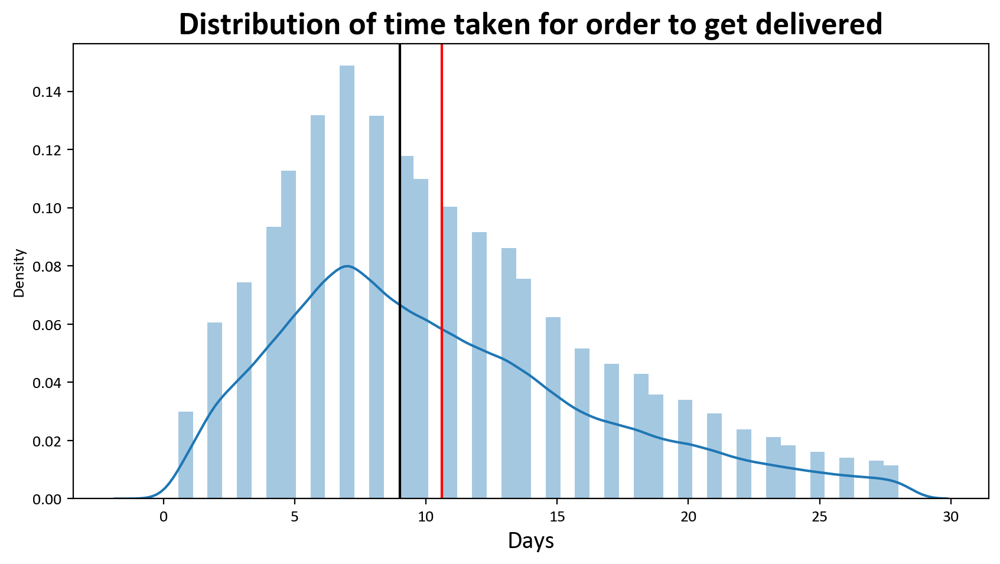

In [26]:
plt.figure(figsize=(10, 5))
sns.distplot(purchasedDeliveredDist.purchased_delivered)
plt.axvline(purchasedDeliveredDist.purchased_delivered.mean(), c = 'red')
plt.axvline(purchasedDeliveredDist.purchased_delivered.median(), c = 'black')
plt.xlabel('Days',color='black',fontsize=15)
plt.title('Distribution of time taken for order to get delivered',color='black',fontsize=20,fontweight='bold')
plt.show()

In [27]:
purchasedDeliveredDist.purchased_delivered.describe()

count    90096.000000
mean        10.602968
std          6.064321
min          0.000000
25%          6.000000
50%          9.000000
75%         14.000000
max         28.000000
Name: purchased_delivered, dtype: float64

Dengan melihat pesanan yang berada dalam rentang interkuartil saja, pesanan diantar dalam 0-28 hari sejak pelanggan mulai memesan produk, dengan rata-rata sekitar 11 hari.

### Customers Data

In [28]:
customers = df_customers

In [29]:
print('Number of records:',customers.shape[0])
print('Number of columns:',customers.shape[1])

Number of records: 99441
Number of columns: 5


In [30]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [31]:
customers.isnull().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

**observation result:**

- Ada 4 variabel kategorikal: customer_id, customer_unique_id, customer_city, customer_state.
- Ada satu variabel numerik: customer_zip_code_prefix, yang seharusnya dikonversi ke tipe data objek.
- Tidak ada keberadaan nilai Null dalam dataset Pelanggan.

In [32]:
customers['customer_zip_code_prefix'] = customers['customer_zip_code_prefix'].astype(object)

In [33]:
customers.describe(include='object')

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
count,99441,99441,99441,99441,99441
unique,99441,96096,14994,4119,27
top,06b8999e2fba1a1fbc88172c00ba8bc7,8d50f5eadf50201ccdcedfb9e2ac8455,22790,sao paulo,SP
freq,1,17,142,15540,41746


**Observation Result:**

- Total jumlah ID pelanggan adalah 99441, sedangkan jumlah ID pelanggan unik adalah 96096. Kita bisa melihat bahwa hampir semua pelanggan (sekitar 97%) adalah pengunjung sekali, yaitu frekuensi kunjungan mereka adalah 1.
-  Pelanggan berasal dari 14994 lokasi kode pos unik, dan jumlah pelanggan terbanyak, 142, berasal dari kode pos 22790, yang merupakan sebuah area di Rio de Janeiro, Brasil
-  Kota terbanyak tempat pelanggan berada adalah Sao Paulo dan negara bagian teratas yang menjadi tempat tinggal pelanggan adalah Sao Paulo.

### Visualization of top 10 cities 

In [34]:
customerCity = customers.customer_city.value_counts(normalize = True)[:10] * 100
print('The top 10 cities from which customers come are: \n', customerCity)

The top 10 cities from which customers come are: 
 customer_city
sao paulo                15.627357
rio de janeiro            6.920687
belo horizonte            2.788588
brasilia                  2.142979
curitiba                  1.529550
campinas                  1.452117
porto alegre              1.386752
salvador                  1.251999
guarulhos                 1.195684
sao bernardo do campo     0.943273
Name: proportion, dtype: float64


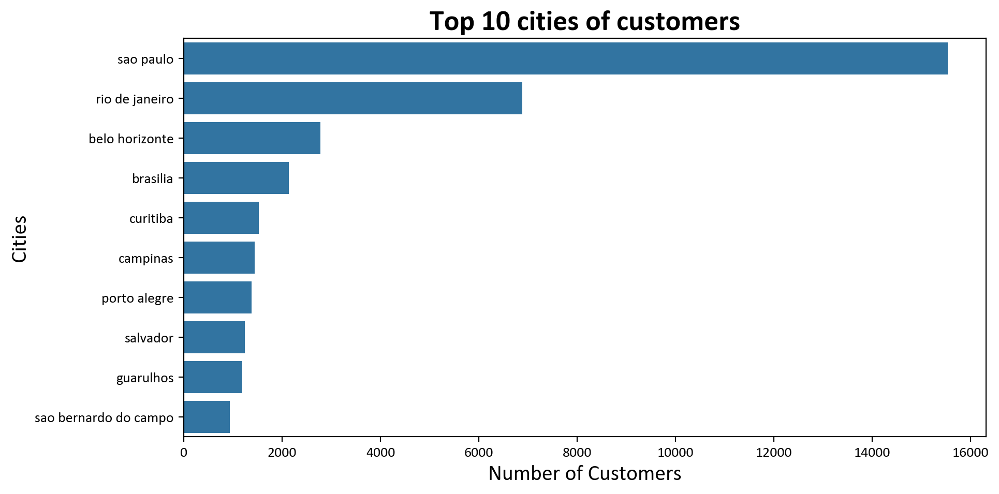

In [35]:
plt.figure(figsize=(10, 5))
sns.barplot(y = customers.customer_city.value_counts().index[:10], x = customers.customer_city.value_counts().values[:10])
plt.xlabel('Number of Customers',color='black',fontsize=15)
plt.ylabel('Cities',color='black',fontsize=15)
plt.title('Top 10 cities of customers',color='black',fontsize=20,fontweight='bold')
plt.show()

**observation result:**

- Kota teratas tempat pelanggan tinggal adalah Sao Paulo, yang menyumbang 15,62% dari total pelanggan, diikuti oleh Rio De Janeiro, yang menyumbang 6,92% dari total pelanggan. Hal tersebut masuk akal mengingat Sao Paulo adalah kota dengan populasi terbanyak di Brasil dan Rio de Janeiro adalah kota dengan populasi terbanyak kedua.

### Visualization of top 10 States 

In [36]:
customerState = customers.customer_state.value_counts(normalize=True)[:10] * 100
print('The top 10 cities from which customers come are: \n', customerState)

The top 10 cities from which customers come are: 
 customer_state
SP    41.980672
RJ    12.924247
MG    11.700405
RS     5.496727
PR     5.073360
SC     3.657445
BA     3.399000
DF     2.152030
ES     2.044428
GO     2.031355
Name: proportion, dtype: float64


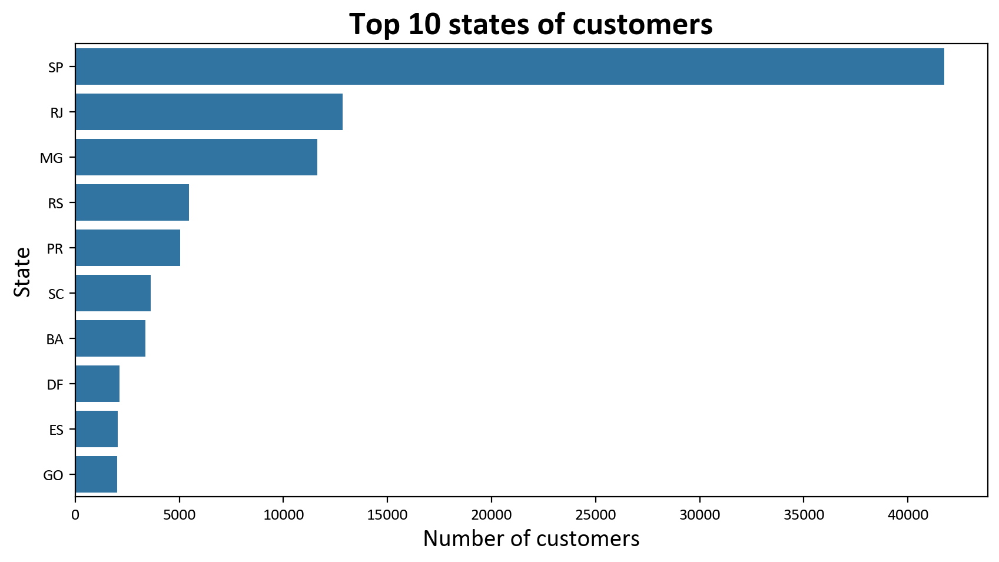

In [37]:
plt.figure(figsize=(10, 5))
sns.barplot(y = customers.customer_state.value_counts().index[:10], x = customers.customer_state.value_counts().values[:10])
plt.xlabel('Number of customers',color='black',fontsize=15)
plt.ylabel('State',color='black',fontsize=15)
plt.title('Top 10 states of customers',color='black',fontsize=20,fontweight='bold')
plt.show()

**observation result:**

- Negara bagian teratas tempat pelanggan tinggal adalah Sao Paulo, dari mana 41,98% dari total pelanggan berasal. Ini diikuti oleh Rio De Janeiro, yang menyumbang 12,92% dari total pelanggan. Sao paulo dan Rio de Janeiro merupakan negara bagian dengan populasi tinggi dibandingkan negara bagian lain.

### Visualization of Geolocation of Customers

In [38]:
geolocation = df_geolocation

In [39]:
incorrectLocation = geolocation[(geolocation.geolocation_lat > 10) & (geolocation.geolocation_lng < -18)]
incorrectLocation

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
538512,29654,29.409252,-98.484121,santo antônio do canaã,ES
538557,29654,21.657547,-101.466766,santo antonio do canaa,ES
585242,35179,25.995203,-98.078544,santana do paraíso,MG
585260,35179,25.995245,-98.078533,santana do paraiso,MG


In [40]:
geolocation.drop(index = [538512, 538557, 585242, 585260], inplace = True)

**Observation Result:**

- Ada beberapa catatan dalam data geolokasi di mana latitude dan longitude geolokasi menunjuk ke lokasi di laut, yang akan mengakibatkan visualisasi geolokasi yang tidak sesuai, ketika agregasi diterapkan pada bidang tersebut, Jadi catatan-catatan seperti itu dihapus dari data
- Catatan-catatan tersebut termasuk kode pos geolokasi 29654 dan 35179, di mana nilai-nilai latitude dan longitude untuk beberapa catatan salah. Latitude lebih besar dari 10 derajat dan longitude kurang dari -18 derajat menunjukkan ke laut. 

In [41]:
geolocationMean = geolocation.groupby('geolocation_zip_code_prefix', as_index = False).agg({'geolocation_lat'  : 'max',
                                                                                            'geolocation_lng'  : 'max'})
geolocationMean.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
0,1001,-23.549292,-46.633559
1,1002,-23.544641,-46.633180
2,1003,-23.548901,-46.634862
3,1004,-23.549181,-46.634057
4,1005,-23.548758,-46.634768


**Observation Result :**

Karena ada banyak koordinat geografis yang diberikan untuk satu kode pos geolokasi, kita mempertimbangkan nilai maksimum dari koordinat untuk suatu kode pos tertentu.

In [42]:
customerDensity = customers.merge(geolocationMean, left_on = 'customer_zip_code_prefix', right_on = 'geolocation_zip_code_prefix', how = 'left')[['customer_unique_id', 'customer_zip_code_prefix', 'geolocation_lat', 'geolocation_lng']]
customerDensity.head()

,customer_unique_id,customer_zip_code_prefix,geolocation_lat,geolocation_lng
0,861eff4711a542e4b93843c6dd7febb0,14409,-20.468849,-47.382173
1,290c77bc529b7ac935b93aa66c333dc3,9790,-23.659702,-46.530264
2,060e732b5b29e8181a18229c7b0b2b5e,1151,-23.527788,-46.652997
3,259dac757896d24d7702b9acbbff3f3c,8775,-23.493944,-46.172406
4,345ecd01c38d18a9036ed96c73b8d066,13056,-22.961980,-47.125767


In [43]:
customerDensity.dropna(inplace = True)

**observation result:**

- Kode pos pelanggan dipetakan dengan latitude dan longitude kode pos geolokasi, sehingga dapat memvisualisasikan dari wilayah mana pelanggan kami lebih padat terkonsentrasi.
-  Ada beberapa kode pos di mana nilai latitude dan longitude tidak tersedia dalam data, jadi kami menghapus catatan tersebut untuk keperluan visualisasi 

In [44]:
# create a map centered on your coordinates
m = folium.Map(location = customerDensity[['geolocation_lat', 'geolocation_lng']].values.tolist()[0], zoom_start = 13)

# create a list of coordinates
coordinates = customerDensity[['geolocation_lat', 'geolocation_lng']].values.tolist()

# create a heatmap layer with the list of coordinates
heat_layer = HeatMap(coordinates)

# add the heatmap layer to the map
heat_layer.add_to(m)

# display the map
m

Berdasarkan Heatmap, dapat dilihat bahwa sebagian besar pelanggan berada di Amerika Selatan, tidak hanya Brasil, dan terdapat juga beberapa pelanggan dari benua Eropa.

## OrderItems

In [45]:
orderItems = df_items

In [46]:
orderItems.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [47]:
orderItems['shipping_limit_date'] = pd.to_datetime(orderItems.shipping_limit_date)

In [48]:
orderItems.isna().sum() / len(orderItems) * 100

order_id               0.0
order_item_id          0.0
product_id             0.0
seller_id              0.0
shipping_limit_date    0.0
price                  0.0
freight_value          0.0
dtype: float64

In [49]:
orderItems.describe(exclude = np.number)

,order_id,product_id,seller_id,shipping_limit_date
count,112650,112650,112650,112650
unique,98666,32951,3095,NaN
top,8272b63d03f5f79c56e9e4120aec44ef,aca2eb7d00ea1a7b8ebd4e68314663af,6560211a19b47992c3666cc44a7e94c0,NaN
freq,21,527,2033,NaN
mean,NaN,NaN,NaN,2018-01-07 15:36:52.192685312
min,NaN,NaN,NaN,2016-09-19 00:15:34
25%,NaN,NaN,NaN,2017-09-20 20:57:27.500000
50%,NaN,NaN,NaN,2018-01-26 13:59:35
75%,NaN,NaN,NaN,2018-05-10 14:34:00.750000128
max,NaN,NaN,NaN,2020-04-09 22:35:08


In [50]:
orderItems.describe()

,order_item_id,shipping_limit_date,price,freight_value
count,112650.000000,112650,112650.000000,112650.000000
mean,1.197834,2018-01-07 15:36:52.192685312,120.653739,19.990320
min,1.000000,2016-09-19 00:15:34,0.850000,0.000000
25%,1.000000,2017-09-20 20:57:27.500000,39.900000,13.080000
50%,1.000000,2018-01-26 13:59:35,74.990000,16.260000
75%,1.000000,2018-05-10 14:34:00.750000128,134.900000,21.150000
max,21.000000,2020-04-09 22:35:08,6735.000000,409.680000
std,0.705124,NaN,183.633928,15.806405


**Observation Result :**

- Ada 98666 pesanan unik yang dibuat dan pesanan dengan jumlah barang terbanyak  memiliki 21 barang dalam satu pesanan.
- 32951 produk unik dipesan dan suatu produk yang paling banyak dipesan telah dipesan 527 kali. Selama tahap analisis lanjutan, produk akan dianalisis dengan memetakan ID dengan dataframe produk.
- ada 3095 penjual unik untuk produk dan penjual yang menjual sebagian besar produk adalah 6560211a19b47992c3666cc44a7e94c0. Identitas penjual dirahasiakan, tetapi kita dapat menggabungkannya dengan geolokasi dan menemukan negara bagian atau kota tempat penjual berasal dan melakukan analisis lebih lanjut.
- Harga rata-rata produk yang dipesan adalah 120.65 Real Brasil. Harga produk yang dipesan sangat miring ke kanan, karena produk termahal yang dipesan dihargai 6735 Real Brasil.
- Demikian pula, nilai pengiriman pesanan rata-rata untuk setiap pesanan adalah 19,99 Real Brasil, dan nilai pengiriman mahal adalah 409,68 Real Brasil. Pesanan tertentu yang memiliki nilai pengiriman yang lebih tinggi akan dipelajari lebih lanjut dalam analisis

### Visualization of Top 10 orders

In [51]:
topOrders = orderItems.groupby('order_id', as_index = False).agg({'price'         : 'sum',
                                                                  'freight_value' : 'sum'})
topOrders['total_price'] = topOrders.price + topOrders.freight_value
top10Orders = topOrders.sort_values(by = 'total_price', ascending = False)[:10]
top10Orders

,order_id,price,freight_value,total_price
1455,03caa2c082116e1d31e67e9ae3700499,13440.0,224.08,13664.08
44467,736e1922ae60d0d6a89247b851902527,7160.0,114.88,7274.88
3130,0812eb902a67711a1cb742b3cdaa65ae,6735.0,194.31,6929.31
98298,fefacc66af859508bf1a7934eab1e97f,6729.0,193.21,6922.21
94439,f5136e38d1a14a4dbd87dff67da82701,6499.0,227.66,6726.66
17114,2cc9089445046817a7539d90805e6e5a,5934.6,146.94,6081.54
65046,a96610ab360d42a2e5335a3998b4718a,4799.0,151.34,4950.34
69531,b4c4b76c642808cbe472a32b86cddc95,4599.9,209.54,4809.44
9868,199af31afc78c699f0dbf71fb178d4d4,4690.0,74.34,4764.34
54353,8dbc85d1447242f3b127dda390d56e19,4590.0,91.78,4681.78


### Visualization of top sellers of the orders placed by customers

In [52]:
topSellers = orderItems.seller_id.value_counts()
topSellers.head()

seller_id
6560211a19b47992c3666cc44a7e94c0    2033
4a3ca9315b744ce9f8e9374361493884    1987
1f50f920176fa81dab994f9023523100    1931
cc419e0650a3c5ba77189a1882b7556a    1775
da8622b14eb17ae2831f4ac5b9dab84a    1551
Name: count, dtype: int64

In [53]:
topSellers = pd.DataFrame({'seller_id'     : topSellers.index,
                           'instances'     : topSellers.values})
topSellers.head()

,seller_id,instances
0,6560211a19b47992c3666cc44a7e94c0,2033
1,4a3ca9315b744ce9f8e9374361493884,1987
2,1f50f920176fa81dab994f9023523100,1931
3,cc419e0650a3c5ba77189a1882b7556a,1775
4,da8622b14eb17ae2831f4ac5b9dab84a,1551


In [54]:
sellers = df_sellers

In [55]:
topSellersOfOrders = topSellers.merge(sellers, on = 'seller_id').merge(geolocationMean, left_on = 'seller_zip_code_prefix', right_on = 'geolocation_zip_code_prefix').drop(columns = ['geolocation_zip_code_prefix'], axis = 1).sort_values('instances', ascending = False)
topSellersOfOrders.head()

,seller_id,instances,seller_zip_code_prefix,seller_city,seller_state,geolocation_lat,geolocation_lng
0,6560211a19b47992c3666cc44a7e94c0,2033,5849,sao paulo,SP,-23.649432,-46.753466
2,4a3ca9315b744ce9f8e9374361493884,1987,14940,ibitinga,SP,-21.734663,-48.809349
51,1f50f920176fa81dab994f9023523100,1931,15025,sao jose do rio preto,SP,-20.793902,-49.376768
55,cc419e0650a3c5ba77189a1882b7556a,1775,9015,santo andre,SP,-23.653394,-46.513267
58,da8622b14eb17ae2831f4ac5b9dab84a,1551,13405,piracicaba,SP,-22.692313,-47.653256


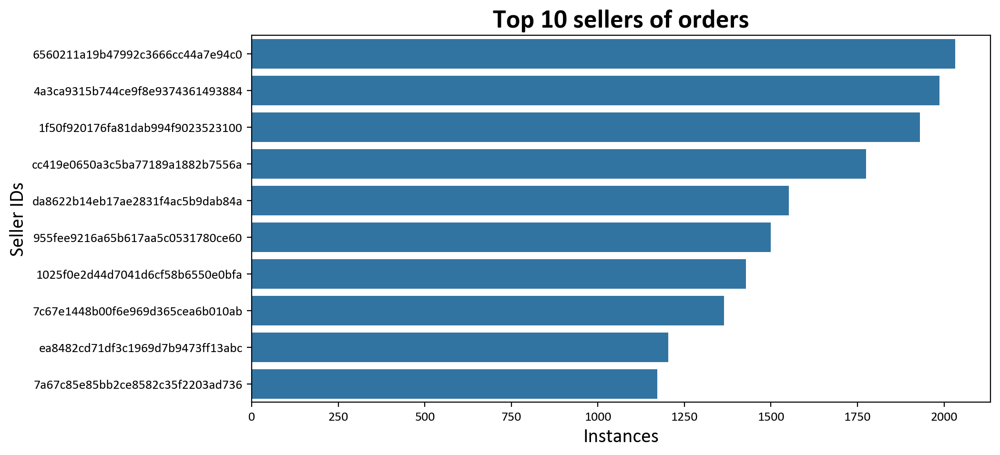

In [56]:
plt.figure(figsize=(10, 5))
sns.barplot(x = topSellers.instances[:10], y = topSellers.seller_id[:10])
plt.xlabel('Instances',color='black',fontsize=15)
plt.ylabel('Seller IDs',color='black',fontsize=15)
plt.title('Top 10 sellers of orders',color='black',fontsize=20,fontweight='bold')
plt.show()

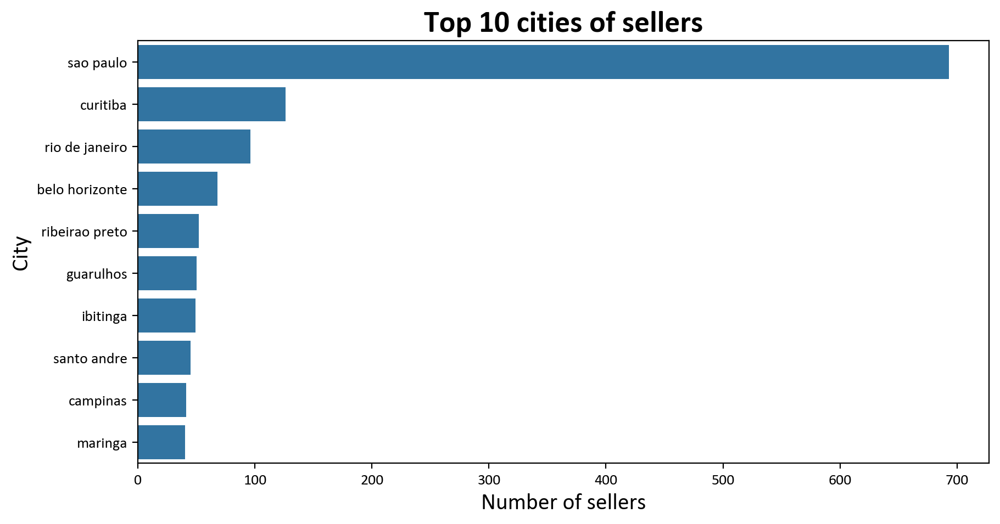

In [57]:
plt.figure(figsize=(10, 5))
sns.barplot(y = topSellersOfOrders.seller_city.value_counts().index[:10], x = topSellersOfOrders.seller_city.value_counts().values[:10])
plt.xlabel('Number of sellers',color='black',fontsize=15)
plt.ylabel('City',color='black',fontsize=15)
plt.title('Top 10 cities of sellers',color='black',fontsize=20,fontweight='bold')
plt.show()

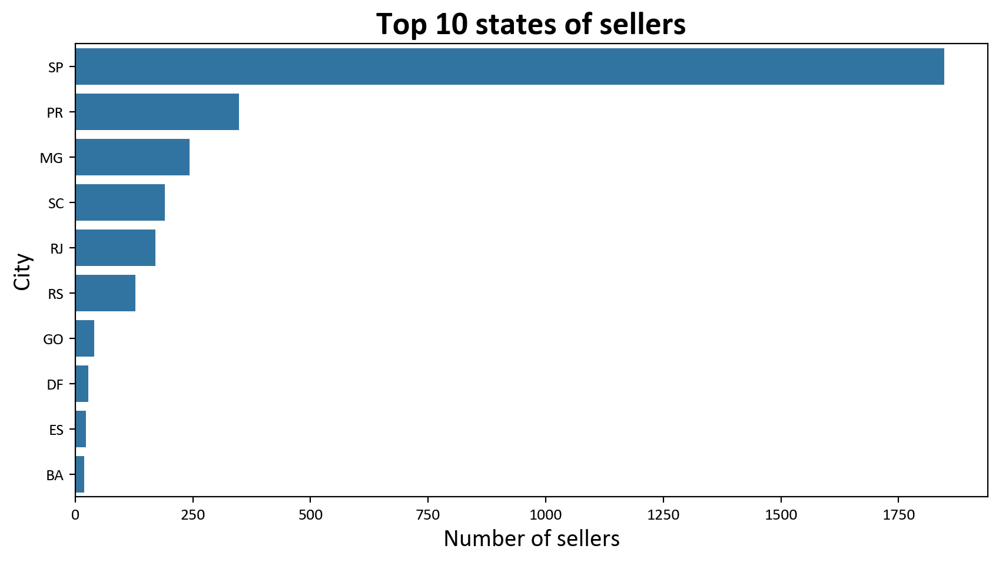

In [58]:
plt.figure(figsize=(10, 5))
sns.barplot(y = topSellersOfOrders.seller_state.value_counts().index[:10], x = topSellersOfOrders.seller_state.value_counts().values[:10])
plt.xlabel('Number of sellers',color='black',fontsize=15)
plt.ylabel('City',color='black',fontsize=15)
plt.title('Top 10 states of sellers',color='black',fontsize=20,fontweight='bold')
plt.show()

**Observation Result:**

- Penjual pesanan kebanyakan berasal dari kota Sao Paulo, diikuti oleh Curitiba dan Rio De Janeiro.
- Penjual pesanan kebanyakan berasal dari negara bagian Sao Paulo dan Parana, negara bagian tempat curitiba berada.

In [59]:
# create a map centered on your coordinates
m = folium.Map(location = topSellersOfOrders[['geolocation_lat', 'geolocation_lng']].values.tolist()[0], zoom_start = 13)

# create a list of coordinates
coordinates = topSellersOfOrders[['geolocation_lat', 'geolocation_lng']].values.tolist()

# create a heatmap layer with the list of coordinates
heat_layer = HeatMap(coordinates)

# add the heatmap layer to the map
heat_layer.add_to(m)

# display the map
m

Penjual hanya berbasis di Brasil. Mereka memfasilitasi pelanggan dari negara lain di Amerika Selatan, bahkan dari benua Eropa.

### Distribution of price of the orders

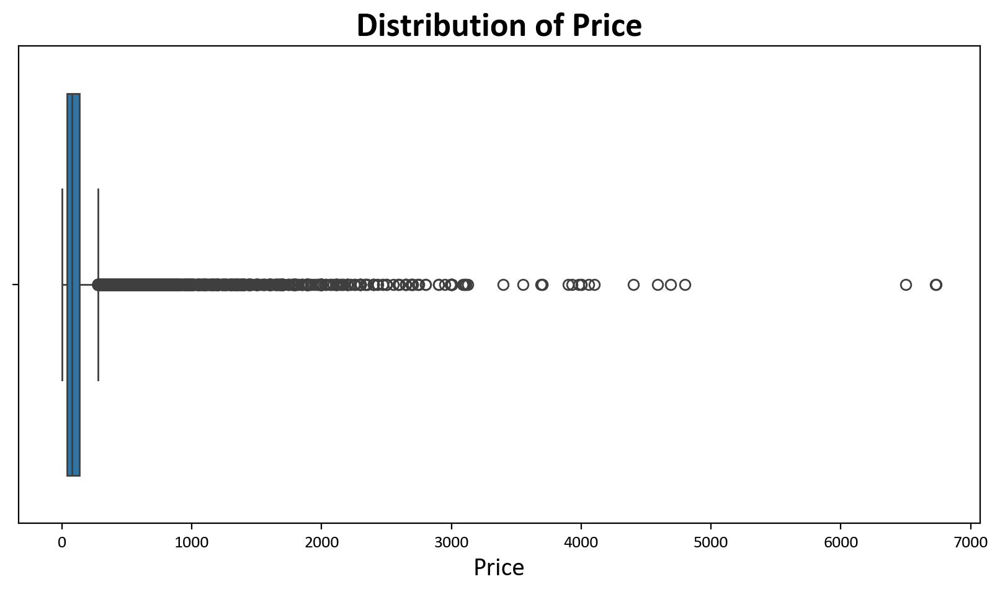

In [60]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='price', data=orderItems)
plt.xlabel('Price',color='black',fontsize=15)
plt.title('Distribution of Price',color='black',fontsize=20,fontweight='bold')
plt.show()

Harga produk sangat skew kanan. Maka akan coba melihat ulang dengan mengabaikan outlier.

In [61]:
Q1 = np.quantile(orderItems.price, 0.25)
Q3 = np.quantile(orderItems.price, 0.75)
IQR = Q3 - Q1
priceDistribution = orderItems[~((orderItems.price < Q1 - 1.5 * IQR) | (orderItems.price > Q3 + 1.5 * IQR))]
priceDistribution.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


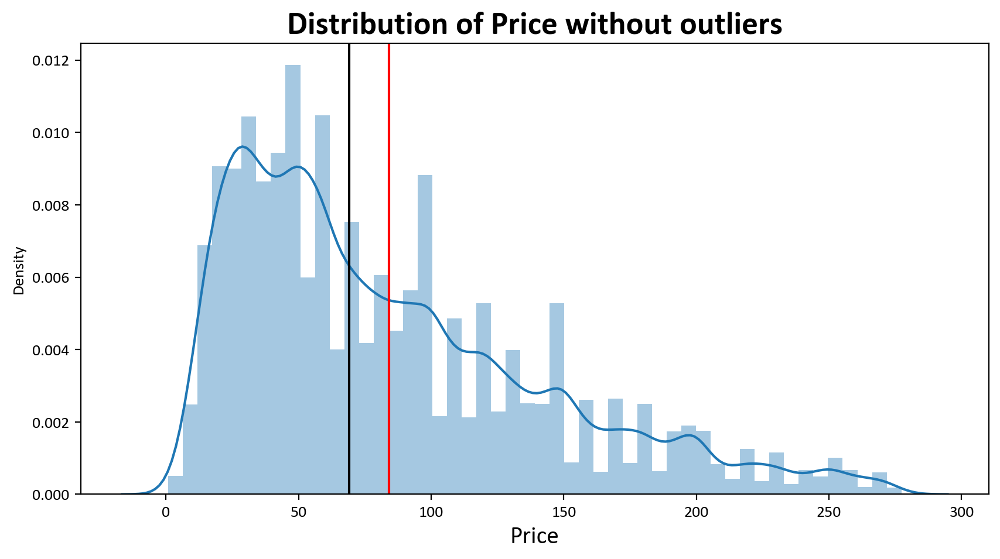

In [62]:
plt.figure(figsize=(10, 5))
sns.distplot(priceDistribution.price)
plt.axvline(priceDistribution.price.mean(), c = 'red')
plt.axvline(priceDistribution.price.median(), c = 'black')
plt.xlabel('Price',color='black',fontsize=15)
plt.title('Distribution of Price without outliers',color='black',fontsize=20,fontweight='bold')
plt.show()

In [63]:
priceDistribution.price.describe()

count    104223.000000
mean         83.974668
std          58.580002
min           0.850000
25%          38.500000
50%          69.000000
75%         118.990000
max         277.300000
Name: price, dtype: float64

**Observation Result:**

- Harga produk dalam rentang kuartil tersebar terutama antara 0 dan 100 Real Brasil, yang dapat dilihat dalam plot distribusi. Rentang keseluruhan adalah 0.85-277.3
- 
Rata-rata harga produk adalah 83,97 Real Brasil.

### Visualization of freight value of the orders

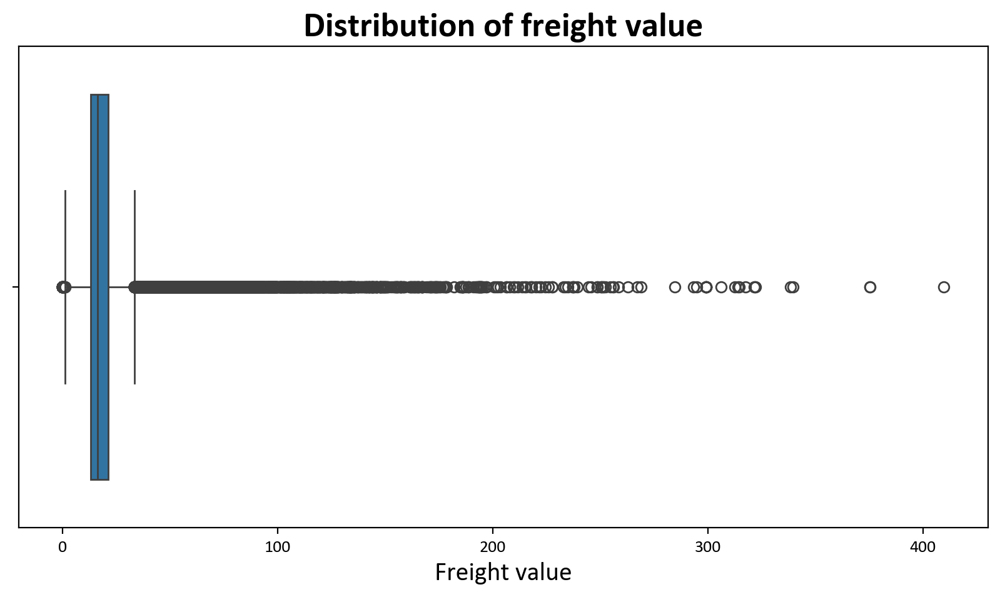

In [64]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='freight_value', data=orderItems)
plt.xlabel('Freight value',color='black',fontsize=15)
plt.title('Distribution of freight value',color='black',fontsize=20,fontweight='bold')
plt.show()

Nilai pengiriman pun sangat skew kanan, maka akan dicoba melihat tanpa outliernya.

In [65]:
Q1 = np.quantile(orderItems.freight_value, 0.25)
Q3 = np.quantile(orderItems.freight_value, 0.75)
IQR = Q3 - Q1
freightValueDistribution = orderItems[~((orderItems.freight_value < Q1 - 1.5 * IQR) | (orderItems.freight_value > Q3 + 1.5 * IQR))]
freightValueDistribution.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


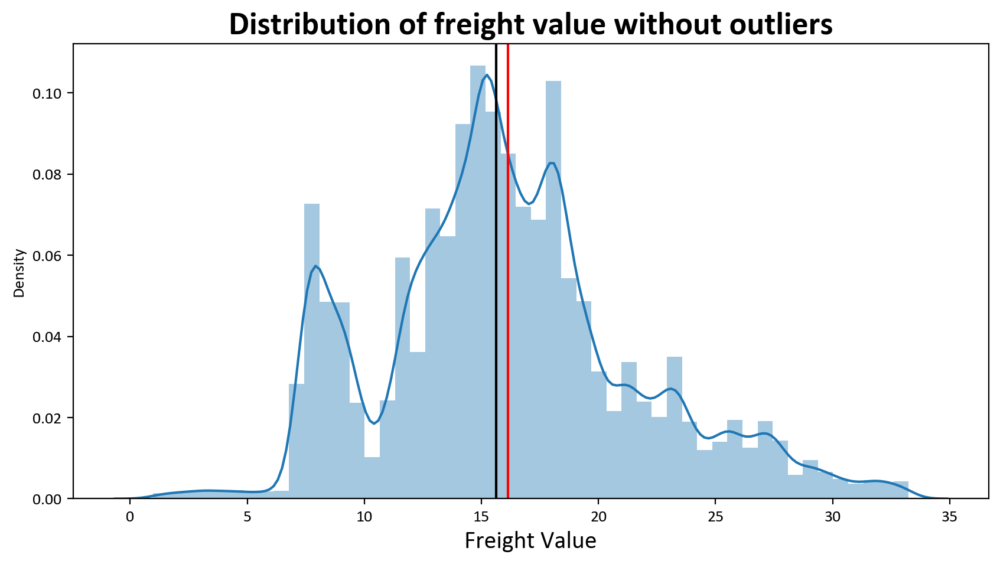

In [66]:
plt.figure(figsize=(10, 5))
sns.distplot(freightValueDistribution.freight_value)
plt.axvline(freightValueDistribution.freight_value.mean(), c = 'red')
plt.axvline(freightValueDistribution.freight_value.median(), c = 'black')
plt.xlabel('Freight Value',color='black',fontsize=15)
plt.title('Distribution of freight value without outliers',color='black',fontsize=20,fontweight='bold')
plt.show()

In [67]:
freightValueDistribution.freight_value.describe()

count    100516.000000
mean         16.125685
std           5.468564
min           0.980000
25%          12.760000
50%          15.620000
75%          18.800000
max          33.250000
Name: freight_value, dtype: float64

- Nilai rata-rata pengiriman produk adalah 16,12 Real Brasil. 

## Payments

In [68]:
payments = df_payments
payments.head(3)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71


In [69]:
print('Number of Records:',payments.shape[0])
print('Number of Columns:',payments.shape[1])

Number of Records: 103886
Number of Columns: 5


In [70]:
payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [71]:
payments.isna().sum()

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [72]:
payments.describe(include = np.number)

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


In [73]:
payments.describe(exclude = np.number)

,order_id,payment_type
count,103886,103886
unique,99440,5
top,fa65dad1b0e818e3ccc5cb0e39231352,credit_card
freq,29,76795


**Observation Result :**

- Tidak ada nilai Null dalam dataframe pembayaran.
- Sebagian besar pembayaran dilakukan melalui kartu kredit.
- Rata-rata jumlah cicilan pembayaran adalah 1, karena distribusinya sangat miring ke kanan, maka nilai rata-rata tidak diperhitungkan. 24 adalah jumlah cicilan pembayaran maksimum untuk sebuah pesanan.
- Nilai pembayaran pesanan juga sangat miring ke kanan. Nilai pembayaran rata-rata adalah 154,1 Real Brasil.**.

### Visualization Of Different Payment types

In [74]:
payments.payment_type.value_counts(normalize = True) * 100

payment_type
credit_card    73.922376
boleto         19.043952
voucher         5.558978
debit_card      1.471806
not_defined     0.002888
Name: proportion, dtype: float64

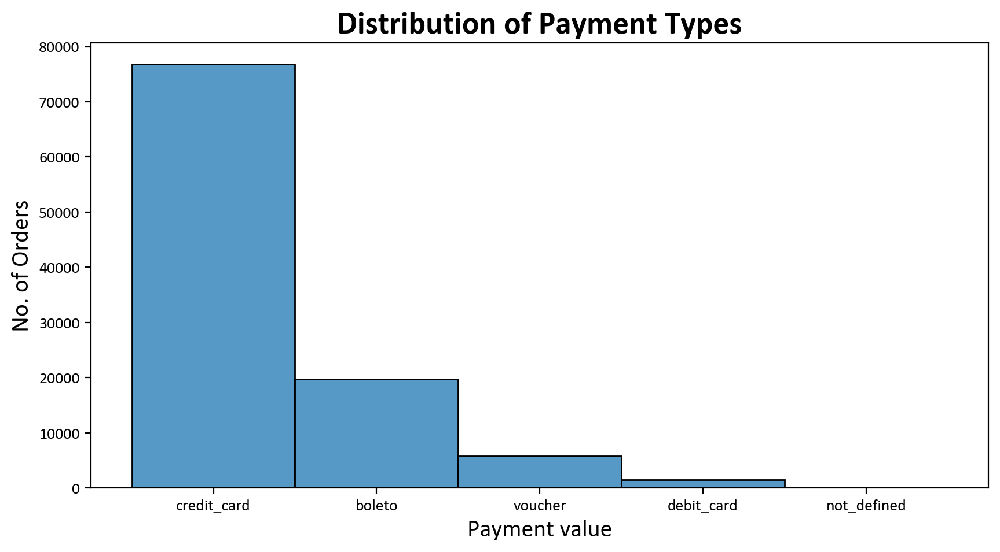

In [75]:
plt.figure(figsize=(10, 5))
sns.histplot(x='payment_type', data=payments)
plt.title('Distribution of Payment Types',fontweight='bold',fontsize=20)
plt.xlabel('Payment value',fontsize=15)
plt.ylabel('No. of Orders',fontsize=15)
plt.show()

**Observation Result :**

- Dari plot hitung, kita dapat dengan jelas melihat bahwa kartu kredit menyumbang 73,9% dari pembayaran, yang merupakan jenis pembayaran yang paling sering dipakai, diikuti oleh boleto, voucher, dan kartu debit.
-  Terdapat ketidakseimbangan dalam data karena sebagian besar jenis pembayaran adalah kartu kredit 

### Distribution of the payment value of the orders

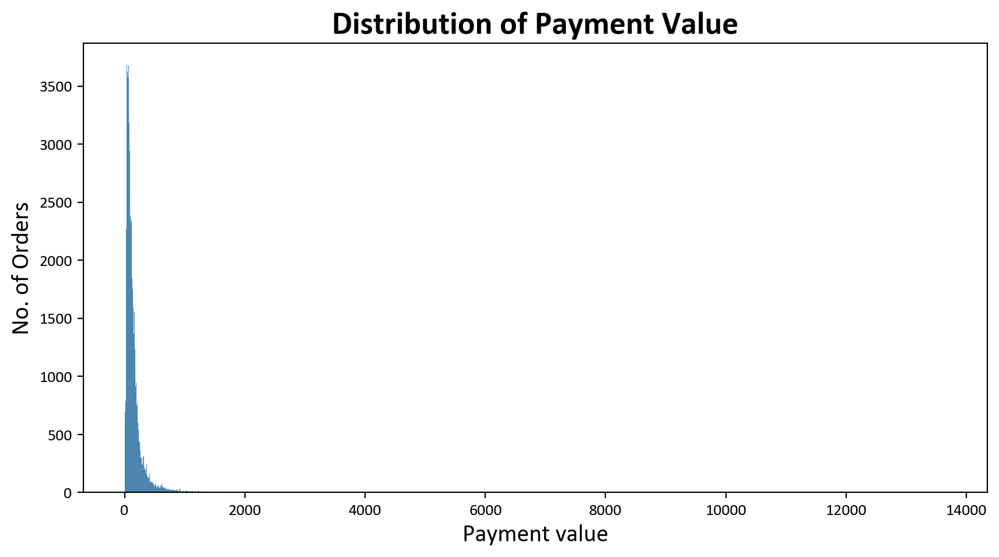

In [76]:
plt.figure(figsize=(10, 5))
sns.histplot(x='payment_value', data=payments)
plt.title('Distribution of Payment Value',fontweight='bold',fontsize=20)
plt.xlabel('Payment value',fontsize=15)
plt.ylabel('No. of Orders',fontsize=15)
plt.show()

In [77]:
Q1 = np.quantile(payments.payment_value, 0.25)
Q3 = np.quantile(payments.payment_value, 0.75)
IQR = Q3 - Q1
paymentValueDistribution = payments[~((payments.payment_value < Q1 - 1.5 * IQR) | (payments.payment_value > Q3 + 1.5 * IQR))]
paymentValueDistribution.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


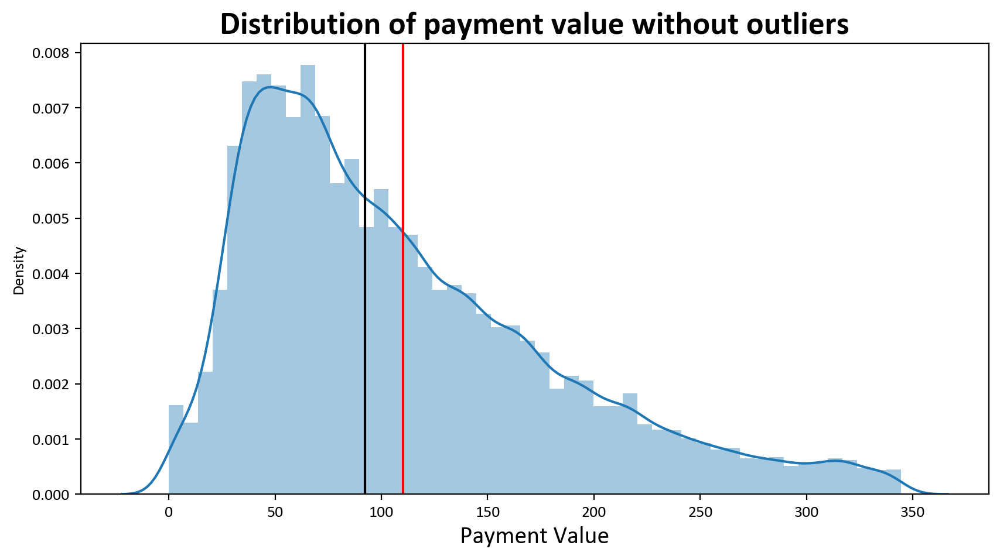

In [78]:
plt.figure(figsize=(10, 5))
sns.distplot(paymentValueDistribution.payment_value)
plt.axvline(paymentValueDistribution.payment_value.mean(), c = 'red')
plt.axvline(paymentValueDistribution.payment_value.median(), c = 'black')
plt.xlabel('Payment Value',color='black',fontsize=15)
plt.title('Distribution of payment value without outliers',color='black',fontsize=20,fontweight='bold')
plt.show()

In [79]:
paymentValueDistribution.payment_value.describe()

count    95905.000000
mean       110.062133
std         72.785054
min          0.000000
25%         54.000000
50%         92.200000
75%        150.580000
max        344.340000
Name: payment_value, dtype: float64

**Observation Result :**

- Nilai pembayaran pesanan dalam rentang kuartil tersebar terutama antara 0 dan 200, yang dapat dilihat dalam plot distribusi.
- 
Nilai pembayaran rata-rata untuk pesanan adalah 110,06 Real Brasil 

## Order Reviews

In [80]:
orderReviews = df_reviews

In [81]:
print('Number of records:',orderReviews.shape[0])
print('number of columns:',orderReviews.shape[1])

Number of records: 99224
number of columns: 7


In [82]:
orderReviews['review_answer_timestamp'] = pd.to_datetime(orderReviews.review_answer_timestamp)
orderReviews['review_creation_date'] = pd.to_datetime(orderReviews.review_creation_date)

In [83]:
orderReviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_comment_title     11568 non-null  object        
 4   review_comment_message   40977 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 5.3+ MB


In [84]:
orderReviews.isna().sum()[orderReviews.isna().sum() > 0] / len(orderReviews) * 100

review_comment_title      88.341530
review_comment_message    58.702532
dtype: float64

In [85]:
reviewScore = orderReviews.review_score.value_counts(normalize = True) * 100
reviewScore

review_score
5    57.776344
4    19.291704
1    11.513344
3     8.242965
2     3.175643
Name: proportion, dtype: float64

**Observation Result :**

- Dari plot hitung dari skor ulasan, kita dapat dengan jelas melihat bahwa sekitar 57,77% dari pesanan memiliki skor ulasan 5, yang merupakan skor ulasan maksimum.
- Dari hal ini, dapat disimpulkan bahwa sebagian besar pelanggan puas dengan produk dan layanan bisnis tersebut 

In [86]:
reviewScoreAnalysis = orderReviews[['order_id', 'review_score']].merge(orders[['order_id', 'purchased_approved', 'approved_carrier', 'carrier_delivered', 'delivered_estimated', 'purchased_delivered']], on = 'order_id')
reviewScoreAnalysis.head()

,order_id,review_score,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
0,73fc7af87114b39712e6da79b0a377eb,4,1030,1,4,15,6
1,a548910a1c6147796b98fdf73dbeba33,5,1400,2,7,4,9
2,f9e4b658b201a9f2ecdecbb34bed034b,5,2239,3,10,20,13
3,658677c97b385a9be170737859d3511b,5,846,0,9,19,10
4,8e6bfb81e283fa7e4f11123a3fb894f1,5,17358,5,12,8,18


In [87]:
ontimeDelivery_review = reviewScoreAnalysis[reviewScoreAnalysis.delivered_estimated > 0][['review_score', 'purchased_approved', 'approved_carrier', 'carrier_delivered', 'delivered_estimated', 'purchased_delivered']].mean()
lateDelivery_review = reviewScoreAnalysis[reviewScoreAnalysis.delivered_estimated < 0][['review_score', 'purchased_approved', 'approved_carrier', 'carrier_delivered', 'delivered_estimated', 'purchased_delivered']].mean()
comparision_review = pd.DataFrame([ontimeDelivery_review, lateDelivery_review]).T
comparision_review.rename(columns = {0 : 'on time delivery', 1 : 'late delivery'}, inplace = True)
comparision_review

,on time delivery,late delivery
review_score,4.295638,2.564497
purchased_approved,13698.077141,15812.153645
approved_carrier,2.111246,4.832007
carrier_delivered,7.373943,25.082170
delivered_estimated,12.892131,-9.768749
purchased_delivered,10.361973,30.946524


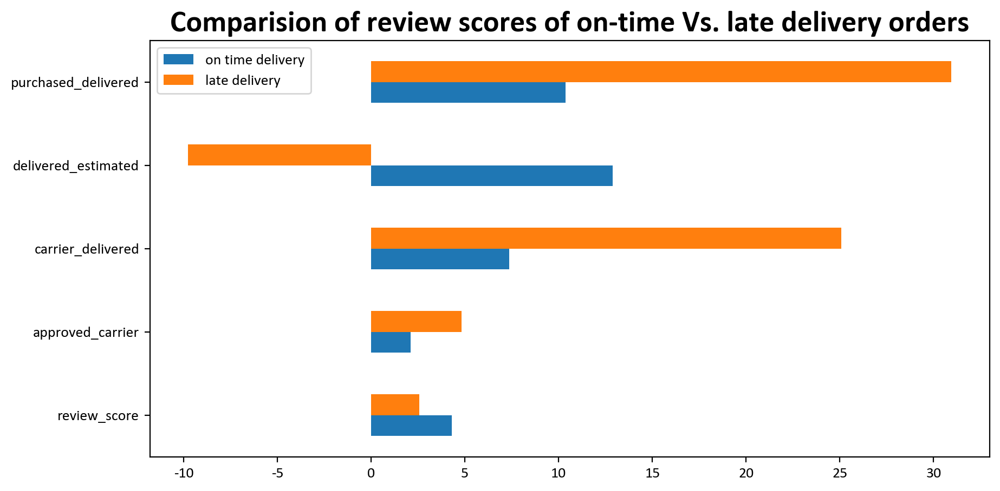

In [88]:
comparision_review.drop('purchased_approved').plot(kind = 'barh', figsize = (10, 5))
plt.title('Comparision of review scores of on-time Vs. late delivery orders',fontweight='bold',fontsize=20)
plt.show()

**Observation Result :**

- Skor ulasan untuk pengiriman yang terlambat adalah 2,5, sedangkan untuk pengiriman tepat waktu adalah 4 secara rata-rata. Terdapat indikasi bahwa pengiriman berpengaruh terhadap kepuasan pelanggan.
- Membutuhkan waktu 25 hari secara rata-rata bagi pesanan untuk sampai ke pelanggan untuk pesanan pengiriman terlambat, sedangkan hanya membutuhkan 9 hari untuk pesanan pengiriman tepat waktu.
- Secara rata-rata, pesanan dikirim 14 hari sebelum tanggal perkiraan pengiriman untuk pesanan yang dikirim tepat waktu.

### Top comments by the customers

In [89]:
topComments = orderReviews.review_comment_title.value_counts()[:10]
print('The top 20 comments by the customer are:',topComments,sep='\n')

The top 20 comments by the customer are:
review_comment_title
Recomendo          423
recomendo          345
Bom                293
super recomendo    270
Excelente          248
Muito bom          247
Ótimo              240
Super recomendo    217
Ótimo              207
Otimo              174
Name: count, dtype: int64


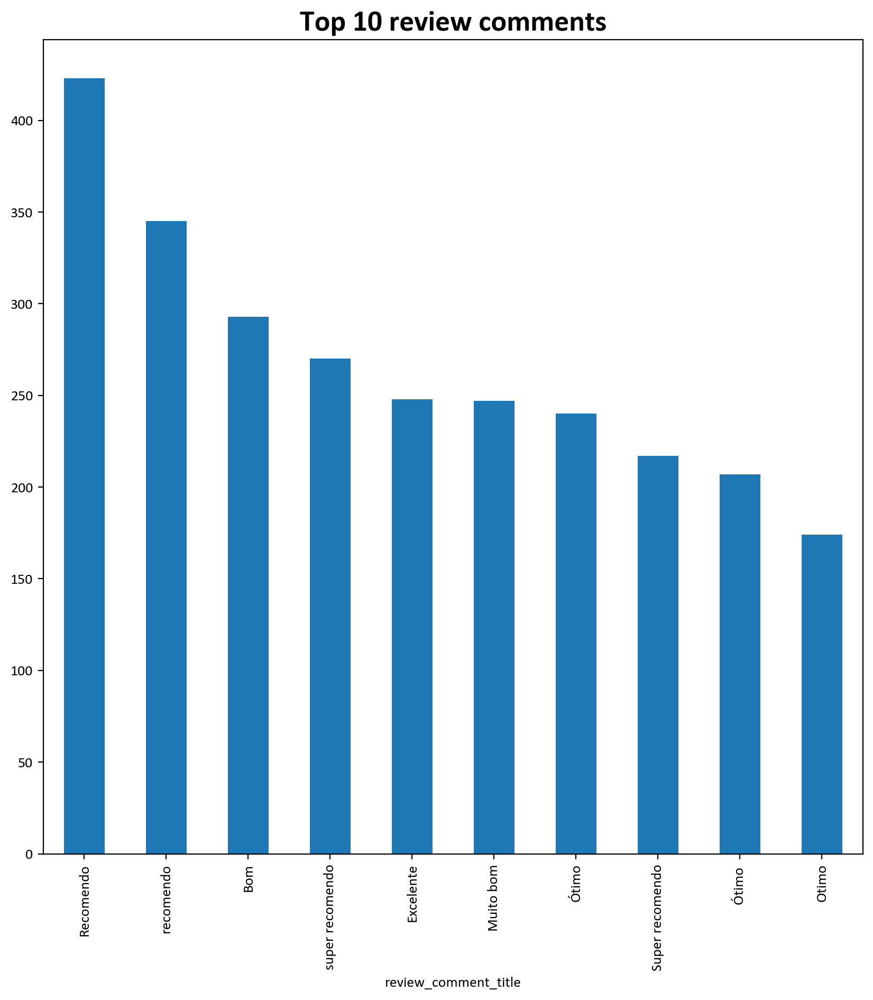

In [90]:
topComments.plot(kind="bar",figsize=(10, 10))
plt.title('Top 10 review comments',fontweight='bold',fontsize=20)
plt.show()

**Observation Result :**

- Komentar yang paling sering muncul adalah Recomendo (*recommended*), Bom (*good*), super recomendo (*I highly recommend*), dan excelente (*great/excellent*). Komentar tersebut bernada positif, sejalan dengan jumlah review yang kebanyakan merupakan review baik.
-  Recomendo mencakup sekitar 11,93% dari total komentar.

## Revenue

### Year-wise number of orders

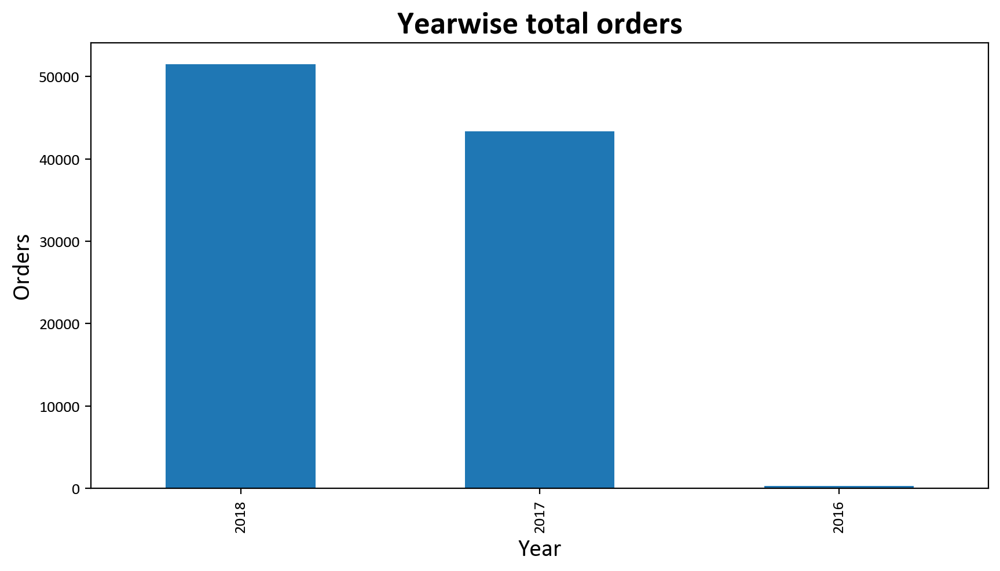

In [91]:
plt.figure(figsize=(10, 5))
pd.to_datetime(orders.order_purchase_timestamp).dt.year.value_counts().plot(kind='bar')
plt.title('Yearwise total orders',fontweight='bold',fontsize=20)
plt.xlabel('Year',fontsize=15,color='black')
plt.ylabel('Orders',fontsize=15,color='black')
plt.show()

2018 merupakan tahun dengan jumlah pesanan terbanyak.

In [92]:
def is_late_delivery(Days):
    if Days < 0:
        return 1
    else:
        return 0

In [93]:
def is_ontime_delivery(Days):
    if Days > 0:
        return 1
    else:
        return 0

In [94]:
year2016 = orders[orders.order_purchase_timestamp.dt.year == 2016].merge(orderItems, on = 'order_id')
year2016['Month'] = year2016.order_purchase_timestamp.dt.month
year2016['isLateDelivery'] = year2016['delivered_estimated'].apply(is_late_delivery)
year2016['isOnTimeDelivery'] = year2016['delivered_estimated'].apply(is_ontime_delivery)
revenue2016 = year2016.groupby('Month').agg({'order_id' : 'nunique', 'price' : 'sum', 'freight_value' : 'sum', 'purchased_approved' : 'mean', 'carrier_delivered' : 'mean', 'delivered_estimated' : 'mean', 'purchased_delivered' : 'mean', 'isLateDelivery' : 'sum', 'isOnTimeDelivery' : 'sum'})
revenue2016['total_revenue'] = revenue2016.price + revenue2016.freight_value
revenue2016['lateDeliveryRate'] = revenue2016['isLateDelivery'] / (revenue2016['isLateDelivery'] + revenue2016['isOnTimeDelivery'])
revenue2016

,order_id,price,freight_value,purchased_approved,carrier_delivered,delivered_estimated,purchased_delivered,isLateDelivery,isOnTimeDelivery,total_revenue,lateDeliveryRate
Month,,,,,,,,,,,
9,1,134.97,8.49,0.000000,1.00000,-37.000000,54.000000,3,0,143.46,1.000000
10,261,39738.17,6093.65,31555.386364,5.62013,35.798701,19.198052,3,304,45831.82,0.009772
12,1,10.90,8.72,890.000000,1.00000,21.000000,4.000000,0,1,19.62,0.000000


In [95]:
year2017 = orders[orders.order_purchase_timestamp.dt.year == 2017].merge(orderItems, on = 'order_id')
year2017['Month'] = year2017.order_purchase_timestamp.dt.month
year2017['isLateDelivery'] = year2017['delivered_estimated'].apply(is_late_delivery)
year2017['isOnTimeDelivery'] = year2017['delivered_estimated'].apply(is_ontime_delivery)
revenue2017 = year2017.groupby('Month').agg({'order_id' : 'nunique', 'price' : 'sum', 'freight_value' : 'sum', 'purchased_approved' : 'mean', 'carrier_delivered' : 'mean', 'delivered_estimated' : 'mean', 'purchased_delivered' : 'mean', 'isLateDelivery' : 'sum', 'isOnTimeDelivery' : 'sum'})
revenue2017['total_revenue'] = revenue2017.price + revenue2017.freight_value
revenue2017['lateDeliveryRate'] = revenue2017['isLateDelivery'] / (revenue2017['isLateDelivery'] + revenue2017['isOnTimeDelivery'])
revenue2017

,order_id,price,freight_value,purchased_approved,carrier_delivered,delivered_estimated,purchased_delivered,isLateDelivery,isOnTimeDelivery,total_revenue,lateDeliveryRate
Month,,,,,,,,,,,
1,749,111609.71,15666.01,14288.871570,8.701427,26.734358,12.072448,26,885,127275.72,0.028540
2,1650,233716.91,36938.42,11139.714517,9.002698,18.165677,12.634107,62,1787,270655.33,0.033532
3,2545,359109.85,55107.03,6177.327807,9.364421,11.439724,12.427634,163,2717,414216.88,0.056597
4,2279,338839.16,49652.13,13151.595351,10.679669,12.108747,14.328211,191,2322,388491.29,0.076005
5,3531,488010.45,77258.11,13569.175069,7.937296,12.395535,10.899172,151,3810,565268.56,0.038122
6,3130,421310.97,68013.90,13466.575079,8.357450,11.719782,11.451622,130,3332,489324.87,0.037551
7,3841,478598.50,83898.01,13519.357536,7.850893,11.586578,11.021530,160,4175,562496.51,0.036909
8,4190,553928.41,90976.11,12527.191103,7.345447,12.344612,10.482038,151,4603,644904.52,0.031763
9,4137,604764.74,93400.02,12330.243381,8.105910,10.435077,11.404787,242,4414,698164.76,0.051976


In [96]:
year2018 = orders[orders.order_purchase_timestamp.dt.year == 2018].merge(orderItems, on = 'order_id')
year2018['Month'] = year2018.order_purchase_timestamp.dt.month
year2018['isLateDelivery'] = year2018['delivered_estimated'].apply(is_late_delivery)
year2018['isOnTimeDelivery'] = year2018['delivered_estimated'].apply(is_ontime_delivery)
revenue2018 = year2018.groupby('Month').agg({'order_id' : 'nunique', 'price' : 'sum', 'freight_value' : 'sum', 'purchased_approved' : 'mean', 'carrier_delivered' : 'mean', 'delivered_estimated' : 'mean', 'purchased_delivered' : 'mean', 'isLateDelivery' : 'sum', 'isOnTimeDelivery' : 'sum'})
revenue2018['total_revenue'] = revenue2018.price + revenue2018.freight_value
revenue2018['lateDeliveryRate'] = revenue2018['isLateDelivery'] / (revenue2018['isLateDelivery'] + revenue2018['isOnTimeDelivery'])
revenue2018

,order_id,price,freight_value,purchased_approved,carrier_delivered,delivered_estimated,purchased_delivered,isLateDelivery,isOnTimeDelivery,total_revenue,lateDeliveryRate
Month,,,,,,,,,,,
1,7045,922192.60,152670.38,15841.367146,9.854841,12.010618,13.656090,525,7405,1074862.98,0.066204
2,6543,824207.87,139455.59,14366.830757,12.700693,7.361940,16.481210,1183,6173,963663.46,0.160821
3,7001,953311.25,167215.46,13605.120274,12.128759,5.799750,15.604741,1641,6190,1120526.71,0.209552
4,6409,923081.83,150642.10,17088.306233,8.035366,11.935772,11.014770,368,6948,1073723.93,0.050301
5,6681,966547.76,149446.94,14948.900233,8.282220,11.342262,10.878106,618,6980,1115994.70,0.081337
6,5976,840156.23,152896.15,12594.163708,6.197031,18.297293,8.667055,93,6771,993052.38,0.013549
7,5596,797173.38,146234.44,17851.038383,5.668773,10.189228,8.623914,294,5949,943407.82,0.047093
8,6265,828540.84,144748.47,14523.856960,4.817653,7.402441,7.262097,735,5908,973289.31,0.110643


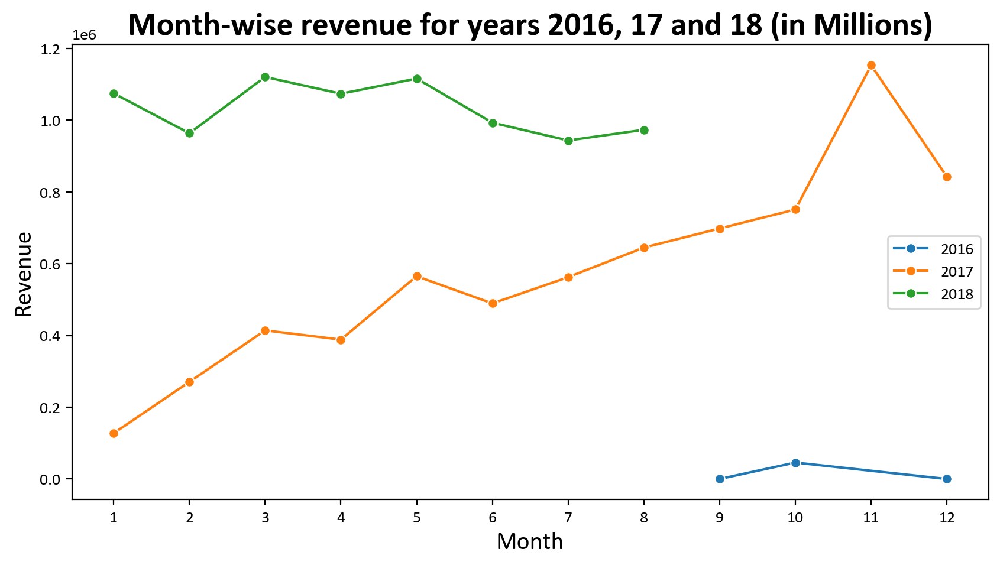

In [97]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenue2016['total_revenue'], x = revenue2016.index, marker = 'o', label = '2016')
sns.lineplot(y = revenue2017['total_revenue'], x = revenue2017.index, marker = 'o', label = '2017')
sns.lineplot(y = revenue2018['total_revenue'], x = revenue2018.index, marker = 'o', label = '2018')
plt.title('Month-wise revenue for years 2016, 17 and 18 (in Millions)',fontweight='bold',fontsize=20)
plt.xlabel('Month',fontsize=15,color='black')
plt.ylabel('Revenue',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

**Observation Result :**

- Tidak banyak catatan yang tersedia untuk tahun 2016, jadi pendapatannya juga lebih sedikit. Oleh karena itu, kita hanya mempertimbangkan catatan dari tahun 2017 hingga catatan yang tersedia hingga Agustus 2018 untuk analisis kami.
- Dari data yang tersedia, jelas terlihat bahwa pendapatan terus tumbuh sepanjang tahun 2017, dimulai dari 127 ribu Real Brasil hingga mencapai 1,15 juta Real Brasil selama bulan November 2017.
- Terjadi penurunan pendapatan sekitar 310 ribu Real Brasil pada bulan Desember 2017.
- Tahun 2018 mengalami aliran pendapatan yang cenderung konstan, yang berada dalam kisaran 966 ribu - 1,13 juta Real Brasil.
- Pendapatan tersebut berhubungan dengan jumlah pesanan yang dibuat.

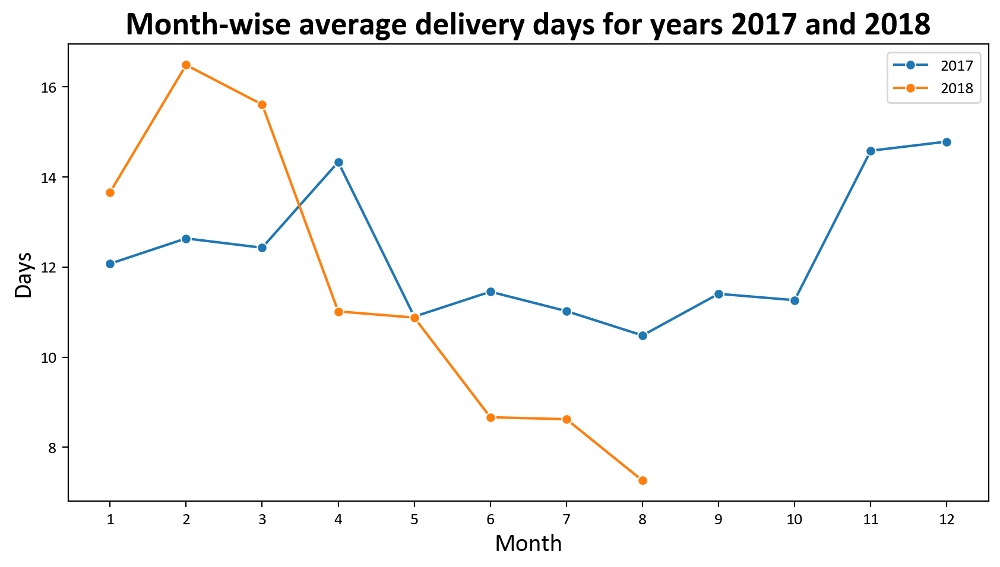

In [98]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenue2017['purchased_delivered'], x = revenue2017.index, marker = 'o', label = '2017')
sns.lineplot(y = revenue2018['purchased_delivered'], x = revenue2018.index, marker = 'o', label = '2018')
plt.title('Month-wise average delivery days for years 2017 and 2018',fontweight='bold',fontsize=20)
plt.xlabel('Month',fontsize=15,color='black')
plt.ylabel('Days',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

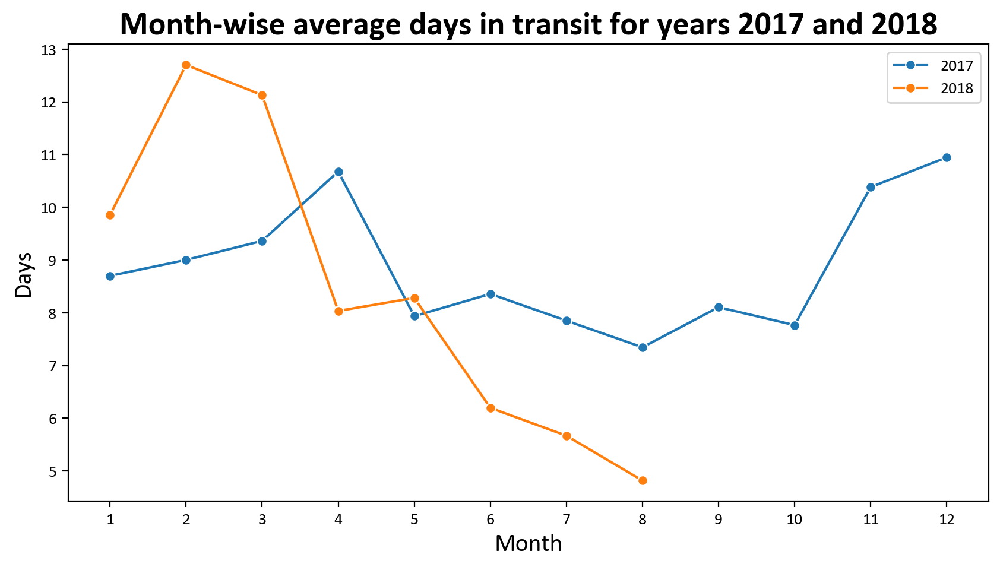

In [99]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenue2017['carrier_delivered'], x = revenue2017.index, marker = 'o', label = '2017')
sns.lineplot(y = revenue2018['carrier_delivered'], x = revenue2018.index, marker = 'o', label = '2018')
plt.title('Month-wise average days in transit for years 2017 and 2018',fontweight='bold',fontsize=20)
plt.xlabel('Month',fontsize=15,color='black')
plt.ylabel('Days',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

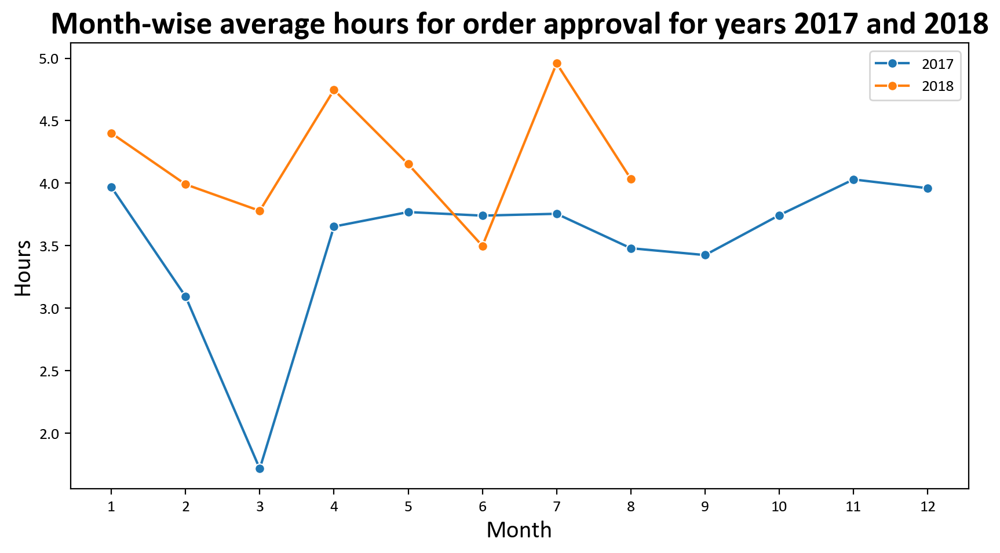

In [100]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenue2017['purchased_approved']/3600, x = revenue2017.index, marker = 'o', label = '2017')
sns.lineplot(y = revenue2018['purchased_approved']/3600, x = revenue2018.index, marker = 'o', label = '2018')
plt.title('Month-wise average hours for order approval for years 2017 and 2018',fontweight='bold',fontsize=20)
plt.xlabel('Month',fontsize=15,color='black')
plt.ylabel('Hours',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

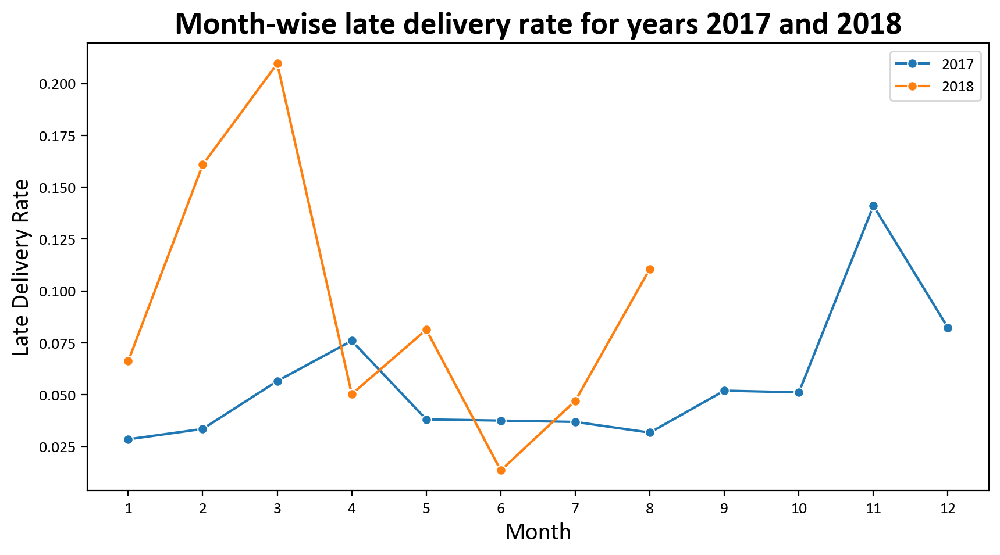

In [101]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenue2017['lateDeliveryRate'], x = revenue2017.index, marker = 'o', label = '2017')
sns.lineplot(y = revenue2018['lateDeliveryRate'], x = revenue2018.index, marker = 'o', label = '2018')
plt.title('Month-wise late delivery rate for years 2017 and 2018',fontweight='bold',fontsize=20)
plt.xlabel('Month',fontsize=15,color='black')
plt.ylabel('Late Delivery Rate',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

**Observation Result :**

- Data untuk tahun 2016 sangat sedikit, jadi kami tidak mempertimbangkannya untuk interpretasi.
- Jumlah hari yang dibutuhkan sejak pemesanan hingga sampai ke tangan pelanggan cenderung menurun. Terdapat indikasi adanya peningkatan dalam sistem sehingga pesanan dapat tiba lebih cepat.

## Black Friday

- Penjualan selama bulan November dapat dipelajari secara ekstensif karena bulan tersebut merupakan bulan yang menghasilkan pendapatan tertinggi, dan yang diikuti oleh penurunan pendapatan yang tiba-tiba pada bulan berikutnya.
- Hal ini mungkin terkait dengan Black Friday Sale, sebuah event diskon besar-besaran yang biasanya diselenggarakan pada hari Jumat terakhir di bulan November. Pada tahun 2017, Black Friday jatuh pada Jumat, 24 November.

In [102]:
november2017 = year2017[year2017.order_purchase_timestamp.dt.month == 11]
november2017['Date'] = november2017.order_purchase_timestamp.dt.day
november2017.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,Month,isLateDelivery,isOnTimeDelivery,Date
1,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073,3,9,12,13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.0,27.20,11,0,1,18
10,85ce859fd6dc634de8d2f1e290444043,059f7fc5719c7da6cbafe370971a8d70,delivered,2017-11-21 00:03:41,2017-11-21 00:14:22,2017-11-23 21:32:26,2017-11-27 18:28:00,2017-12-11,641,2,3,13,6,1,cce679660c66e6fbd5c8091dfd29e9cd,d2374cbcbb3ca4ab1086534108cc3ab7,2017-11-29 00:14:22,17.9,11.85,11,0,1,21
17,6ea2f835b4556291ffdc53fa0b3b95e8,c7340080e394356141681bd4c9b8fe31,delivered,2017-11-24 21:27:48,2017-11-25 00:21:09,2017-12-13 21:14:05,2017-12-28 18:59:23,2017-12-21,10401,18,14,-8,33,1,be021417a6acb56b9b50d3fd2714baa8,f5f46307a4d15880ca14fab4ad9dfc9b,2017-11-30 00:21:09,339.0,17.12,11,1,0,24
26,68873cf91053cd11e6b49a766db5af1a,4632eb5a8f175f6fe020520ae0c678f3,delivered,2017-11-30 22:02:15,2017-12-02 02:51:18,2017-12-04 22:07:01,2017-12-05 20:28:40,2017-12-18,17343,2,0,12,4,1,15a9e834e89eab39d973492882c658d6,a673821011d0cec28146ea42f5ab767f,2017-12-07 02:51:18,79.9,11.76,11,0,1,30
27,8f06cc6465925031568537b815f1198d,9916715c2ab6ee1710c9c32f0a534ad2,delivered,2017-11-15 11:31:41,2017-11-15 11:46:42,2017-11-16 22:03:00,2017-11-22 22:41:07,2017-12-05,901,1,6,12,7,1,12087840651e83b48206b82c213b76fd,5b925e1d006e9476d738aa200751b73b,2017-11-21 11:46:42,299.0,18.34,11,0,1,15


In [103]:
blackfriday = november2017[november2017['Date']==24]
blackfriday.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,Month,isLateDelivery,isOnTimeDelivery,Date
17,6ea2f835b4556291ffdc53fa0b3b95e8,c7340080e394356141681bd4c9b8fe31,delivered,2017-11-24 21:27:48,2017-11-25 00:21:09,2017-12-13 21:14:05,2017-12-28 18:59:23,2017-12-21,10401,18,14,-8,33,1,be021417a6acb56b9b50d3fd2714baa8,f5f46307a4d15880ca14fab4ad9dfc9b,2017-11-30 00:21:09,339.0,17.12,11,1,0,24
59,b01875821b8dcb6abc61776f0f971bce,818596f5b68adfe2c11498ebb6d39e02,delivered,2017-11-24 21:55:22,2017-11-25 01:31:43,2017-11-28 22:37:15,2017-12-01 21:11:40,2017-12-15,12981,3,2,13,6,1,a6ad77b15e566298a4e8ee2011ab1255,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-01 00:38:17,31.8,39.28,11,0,1,24
60,b01875821b8dcb6abc61776f0f971bce,818596f5b68adfe2c11498ebb6d39e02,delivered,2017-11-24 21:55:22,2017-11-25 01:31:43,2017-11-28 22:37:15,2017-12-01 21:11:40,2017-12-15,12981,3,2,13,6,2,a6ad77b15e566298a4e8ee2011ab1255,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-01 00:38:17,31.8,39.28,11,0,1,24
115,c263211bd219538f7c031591e87ef0d7,ed8c52327eecff596e141636d5b556d2,delivered,2017-11-24 16:56:46,2017-11-28 03:48:24,2017-12-08 23:28:26,2017-12-18 20:24:54,2017-12-19,39098,10,9,0,24,1,028b0b0277744a9eaa2c4f57c24dcb68,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-05 03:48:24,359.7,17.27,11,0,0,24
116,c263211bd219538f7c031591e87ef0d7,ed8c52327eecff596e141636d5b556d2,delivered,2017-11-24 16:56:46,2017-11-28 03:48:24,2017-12-08 23:28:26,2017-12-18 20:24:54,2017-12-19,39098,10,9,0,24,2,028b0b0277744a9eaa2c4f57c24dcb68,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-05 03:48:24,359.7,17.27,11,0,0,24


In [104]:
revenueNovember2017 = november2017.groupby('Date').agg({'order_id' : 'nunique', 'price' : 'sum', 'freight_value' : 'sum'})
revenueNovember2017['total_revenue'] = revenueNovember2017.price + revenueNovember2017.freight_value

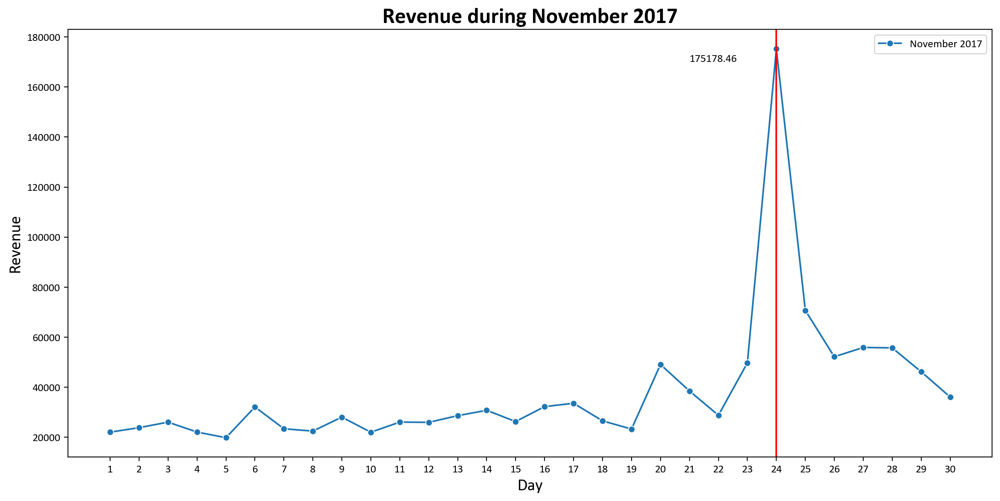

In [105]:
plt.figure(figsize=(15, 7))
sns.lineplot(y = revenueNovember2017['total_revenue'], x = revenueNovember2017.index, marker = 'o', label = 'November 2017')
plt.title('Revenue during November 2017',fontweight='bold',fontsize=20)
plt.axvline(24, c = 'r')
plt.annotate(revenueNovember2017.loc[24].total_revenue, (21, 170000))
plt.xlabel('Day',fontsize=15,color='black')
plt.ylabel('Revenue',fontsize=15,color='black')
plt.xticks(range(1, 31))
plt.legend()
plt.show()

**Observation Result :**

- Black Friday Sale jatuh pada tanggal 24 November 2017, di mana jumlah pesanan tertinggi, yaitu 1147 pesanan, ditempatkan.
- Ini menghasilkan pendapatan maksimum untuk satu hari, yang sekitar 175 ribu Real Brasil.
- Perusahaan dapat memanfaatkan event serupa pada tahun-tahun selanjutnya untuk mendapatkan pendapatan yang lebih baik.

### Products ordered on Black Friday Sale

In [106]:
products = df_products
productCategoryTranslation =df_translations

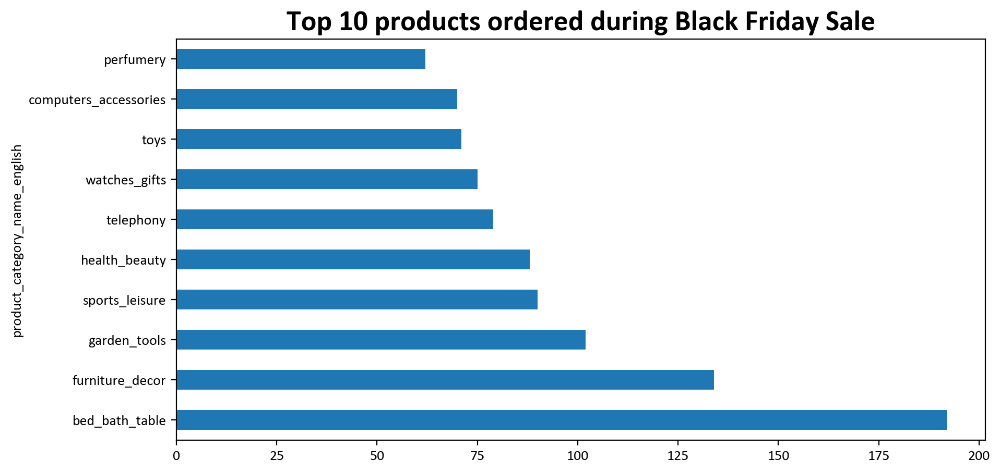

In [107]:
blackFridayProducts = blackfriday.merge(products[['product_id', 'product_category_name']], on = 'product_id').merge(productCategoryTranslation, on = 'product_category_name')
plt.figure(figsize = (10, 5))
blackFridayProducts.product_category_name_english.value_counts()[:10].plot(kind = 'barh')
plt.title('Top 10 products ordered during Black Friday Sale',fontweight='bold',fontsize=20)
plt.show()

Saat event Black friday, barang yang paling banyak terjual adalah produk dengan kategori bed_bath_table. Perusahaan dapat memaksimalkan promosi pada produk-produk tersebut agar penjualan semakin meningkat.

## Late Deliveries

In [108]:
def is_late(Days):
    if Days < -10:
        return 'delayed by >10 days'
    elif Days < -5 and Days >= -10:
        return 'delayed by 6-10 days'
    elif Days < 0 and Days >= -5:
        return 'delayed by 1-5 days'
    else:
        return 'on time'

In [109]:
lateDelivery = orders[['order_id', 'order_purchase_timestamp', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'delivered_estimated']].merge(orderReviews[['order_id', 'review_score']], on = 'order_id', how = 'left')
lateDelivery['is_late'] = lateDelivery['delivered_estimated'].apply(is_late)
lateDelivery.head()

,order_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivered_estimated,review_score,is_late
0,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,7,4.0,on time
1,53cdb2fc8bc7dce0b6741e2150273451,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,5,4.0,on time
2,47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,17,5.0,on time
3,949d5b44dbf5de918fe9c16f97b45f8a,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,12,5.0,on time
4,ad21c59c0840e6cb83a9ceb5573f8159,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,9,5.0,on time


In [110]:
lateDelivery.is_late.value_counts()

is_late
on time                 87800
delayed by 1-5 days      3611
delayed by >10 days      2308
delayed by 6-10 days     1913
Name: count, dtype: int64

In [111]:
lateDelivery.is_late.value_counts(normalize = True) * 100

is_late
on time                 91.810273
delayed by 1-5 days      3.775933
delayed by >10 days      2.413418
delayed by 6-10 days     2.000376
Name: proportion, dtype: float64

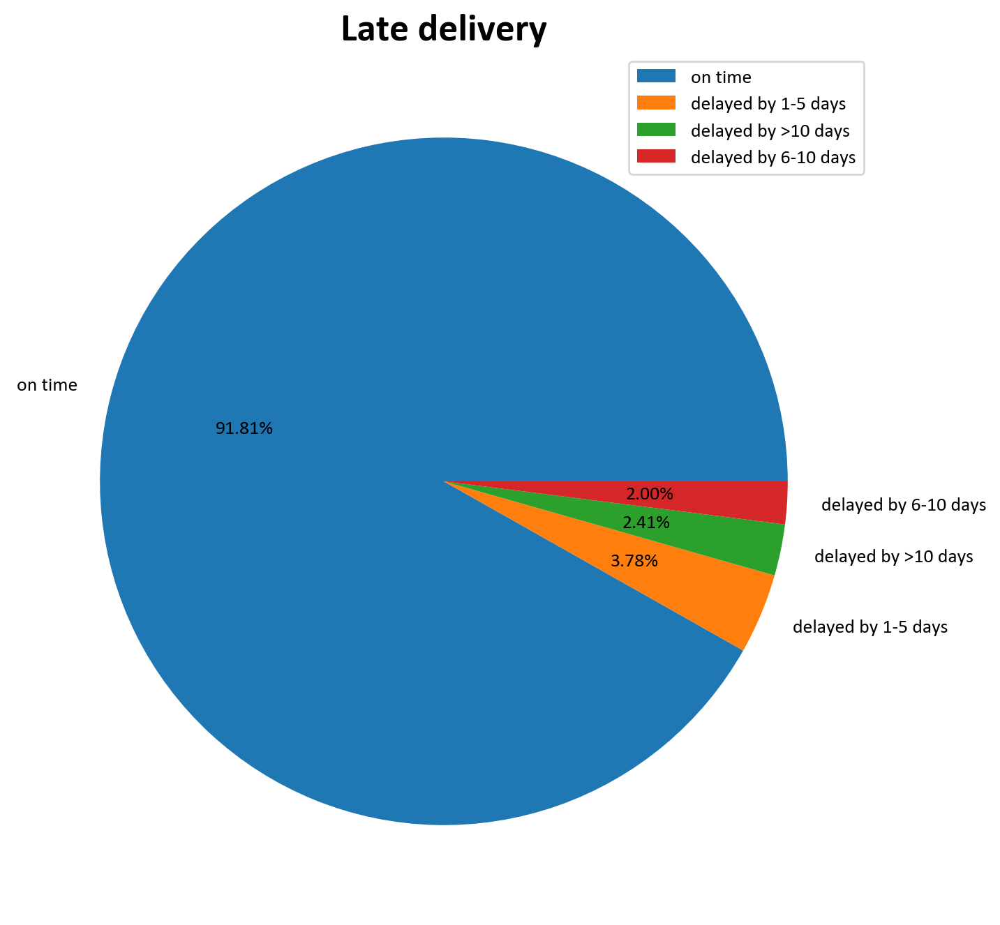

In [112]:
plt.figure(figsize = (10, 8))
plt.pie(lateDelivery.is_late.value_counts(), autopct = '%0.2f%%', labels = lateDelivery.is_late.value_counts().index)
plt.title('Late delivery',fontweight='bold',fontsize=20)
plt.legend()
plt.show()

Meskipun mayoritas pesanan tiba tepat waktu (sebelum estimated delivery date), namun pesanan yang terlambat pun tidak boleh diabaikan karena berpotensi mempengaruhi kepuasan pelanggan

In [113]:
reviewScore_lateDelivery = lateDelivery.groupby('is_late').agg({'review_score' : 'mean'})
reviewScore_lateDelivery

,review_score
is_late,
delayed by 1-5 days,3.458474
delayed by 6-10 days,1.894737
delayed by >10 days,1.699241
on time,4.293223


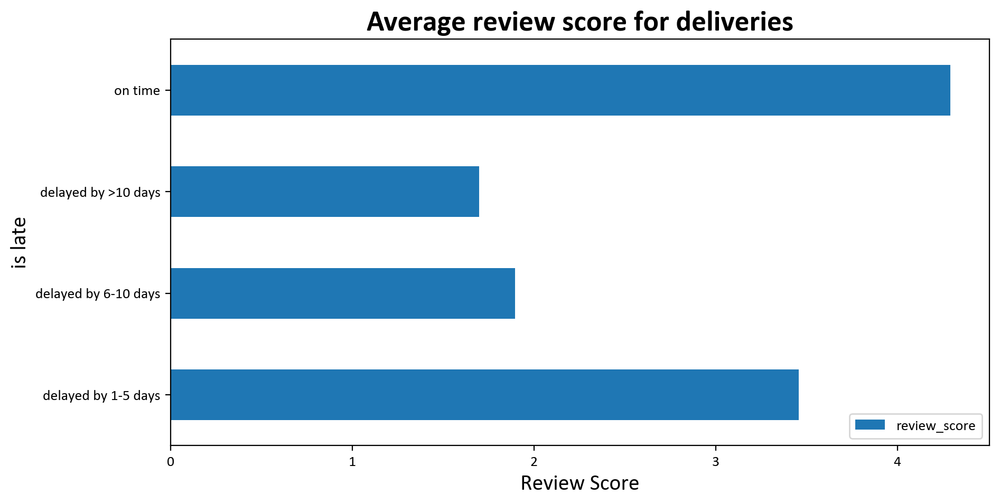

In [114]:
reviewScore_lateDelivery.plot(kind = 'barh', figsize = (10, 5))
plt.title('Average review score for deliveries',fontweight='bold',fontsize=20)
plt.xlabel('Review Score',fontsize=15,color='black')
plt.ylabel('is late',fontsize=15,color='black')
plt.show()

Pada grafik dapat dilihat bahwa semakin lama keterlambatan pesanan, rata-rata review pelanggan pun semakin buruk. Maka pengiriman merupakan salah satu aspek yang perlu diperbaiki jika perusahaan ingin meningkatkan kepuasan pelanggan.

## Golden Hours and Days

In [115]:
def weekend(dayName):
    if dayName == 'Saturday' or dayName == 'Sunday':
        return 'weekend'
    else:
        return 'weekday'

In [116]:
ordersTimeAnalysis = orders.copy().merge(orderItems, on = 'order_id')
ordersTimeAnalysis['Hour'] = ordersTimeAnalysis.order_purchase_timestamp.dt.hour
ordersTimeAnalysis['day_name'] = ordersTimeAnalysis.order_purchase_timestamp.dt.day_name()
ordersTimeAnalysis['is_weekend'] = ordersTimeAnalysis.day_name.apply(weekend)
ordersTimeAnalysis['total_revenue'] = ordersTimeAnalysis.price + ordersTimeAnalysis.freight_value
ordersTimeAnalysis.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,Hour,day_name,is_weekend,total_revenue
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,642,2,6,7,8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,10,Monday,weekday,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,24170,0,12,5,13,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,20,Tuesday,weekday,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,994,0,9,17,9,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,8,Wednesday,weekday,179.12
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073,3,9,12,13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20,19,Saturday,weekend,72.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3710,0,1,9,2,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72,21,Tuesday,weekday,28.62


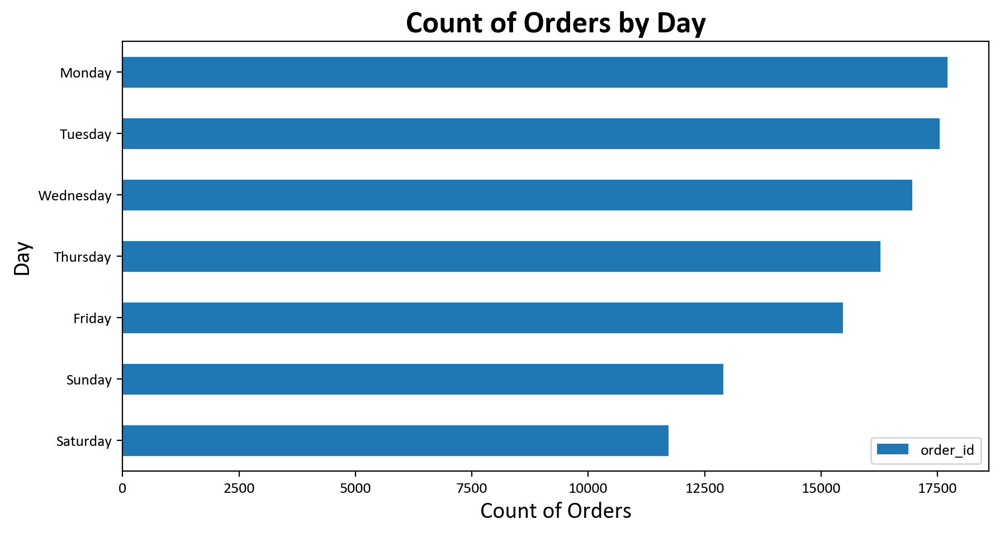

In [117]:
ordersTimeAnalysis.groupby(['day_name']).agg({'order_id' : 'count'}).sort_values('order_id').plot(kind = 'barh', figsize = (10, 5))
plt.title('Count of Orders by Day',fontweight='bold',fontsize=20)
plt.xlabel('Count of Orders',fontsize=15,color='black')
plt.ylabel('Day',fontsize=15,color='black')
plt.show()

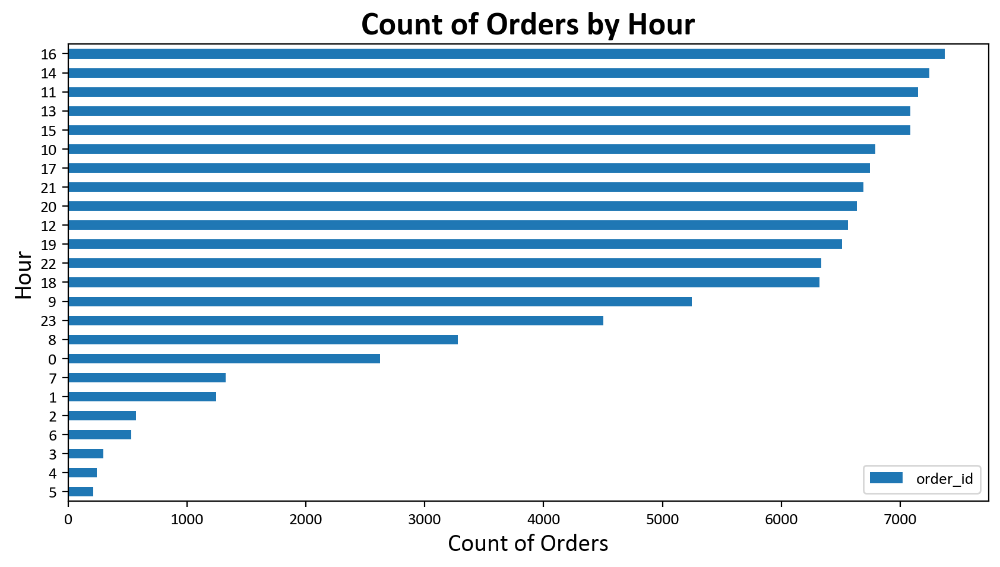

In [118]:
ordersTimeAnalysis.groupby(['Hour']).agg({'order_id' : 'count'}).sort_values('order_id').plot(kind = 'barh', figsize = (10, 5))
plt.title('Count of Orders by Hour',fontweight='bold',fontsize=20)
plt.xlabel('Count of Orders',fontsize=15,color='black')
plt.ylabel('Hour',fontsize=15,color='black')
plt.show()

**Observation Result :**

- Plot di atas mewakili jam-jam puncak dan hari-hari puncak selama pelanggan memesan produk.
- Lalu lintas pelanggan lebih tinggi selama hari kerja dibandingkan akhir pekan, dengan Senin dan Selasa menjadi hari-hari ketika pesanan paling banyak ditempatkan.
- Demikian pula, waktu puncak selama yang pesanan paling banyak ditempatkan adalah antara jam 11 pagi hingga jam 4 sore.
- Kita bisa meningkatkan penjualan dan pendapatan jika kita bisa memanfaatkan informasi ini dan menargetkan pelanggan dengan penawaran menarik pada hari dan jam tersebut.

## Products

In [119]:
products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [120]:
print('Number of records:',products.shape[0])
print('Number of Columns:',products.shape[1])

Number of records: 32951
Number of Columns: 9


In [121]:
products.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [122]:
products.dropna(inplace = True) #karena tidak ada keterangan berarti dari data tanpa kategori produk

In [123]:
orderedProducts = products.merge(orderItems, on = 'product_id').merge(productCategoryTranslation, on = 'product_category_name')[['product_id', 'product_category_name_english', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'order_id', 'price', 'freight_value']]
orderedProducts['total_revenue'] = orderedProducts.price + orderedProducts.freight_value
orderedProducts.head()

,product_id,product_category_name_english,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,order_id,price,freight_value,total_revenue
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,40.0,287.0,1.0,225.0,16.0,10.0,14.0,e17e4f88e31525f7deef66779844ddce,10.91,7.39,18.30
1,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,39.0,346.0,2.0,400.0,27.0,5.0,20.0,048cc42e03ca8d43c729adf6962cb348,16.90,7.78,24.68
2,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,39.0,346.0,2.0,400.0,27.0,5.0,20.0,5fa78e91b5cb84b6a8ccc42733f95742,16.90,7.78,24.68
3,0d009643171aee696f4733340bc2fdd0,perfumery,52.0,150.0,1.0,422.0,21.0,16.0,18.0,24b1c4d88fdb7a2dc87f8ecc7d8f47f1,339.00,17.13,356.13
4,0d009643171aee696f4733340bc2fdd0,perfumery,52.0,150.0,1.0,422.0,21.0,16.0,18.0,7b13c77c64a9a956500cbf1a9a23798d,275.00,23.48,298.48


In [124]:
orderedProductsAnalysis = orderedProducts.groupby('product_category_name_english', as_index = False).agg({
                                                        'product_id'                      : 'count',                                                       
                                                        'order_id'                        : 'count',
                                                        'price'                           : 'sum',
                                                        'freight_value'                   : 'sum',
                                                        'total_revenue'                   : 'sum'})
orderedProductsAnalysis.head()

,product_category_name_english,product_id,order_id,price,freight_value,total_revenue
0,agro_industry_and_commerce,212,212,72530.47,5843.60,78374.07
1,air_conditioning,297,297,55024.96,6749.23,61774.19
2,art,209,209,24202.64,4045.17,28247.81
3,arts_and_craftmanship,24,24,1814.01,370.13,2184.14
4,audio,364,364,50688.50,5710.44,56398.94


In [125]:
orderedProductsAnalysis.select_dtypes(include = np.number).describe()

,product_id,order_id,price,freight_value,total_revenue
count,71.000000,71.000000,7.100000e+01,71.000000,7.100000e+01
mean,1563.690141,1563.690141,1.887980e+05,31313.653521,2.201117e+05
std,2606.537422,2606.537422,3.036850e+05,50281.462423,3.515343e+05
min,2.000000,2.000000,2.832900e+02,41.220000,3.245100e+02
25%,93.000000,93.000000,9.171185e+03,1973.205000,1.174393e+04
50%,281.000000,281.000000,4.685688e+04,6749.230000,5.605240e+04
75%,1819.000000,1819.000000,2.029071e+05,35505.620000,2.214684e+05
max,11115.000000,11115.000000,1.258681e+06,204693.040000,1.441248e+06


In [126]:
top10revenueGenerating = orderedProductsAnalysis.sort_values(by = 'total_revenue', ascending = False)[:10]
top10revenueGenerating

,product_category_name_english,product_id,order_id,price,freight_value,total_revenue
43,health_beauty,9670,9670,1258681.34,182566.73,1441248.07
70,watches_gifts,5991,5991,1205005.68,100535.93,1305541.61
7,bed_bath_table,11115,11115,1036988.68,204693.04,1241681.72
65,sports_leisure,8641,8641,988048.97,168607.51,1156656.48
15,computers_accessories,7827,7827,911954.32,147318.08,1059272.40
39,furniture_decor,8334,8334,729762.49,172749.30,902511.79
49,housewares,6964,6964,632248.66,146149.11,778397.77
20,cool_stuff,3796,3796,635290.85,84039.10,719329.95
5,auto,4235,4235,592720.11,92664.21,685384.32
42,garden_tools,4347,4347,485256.46,98962.75,584219.21


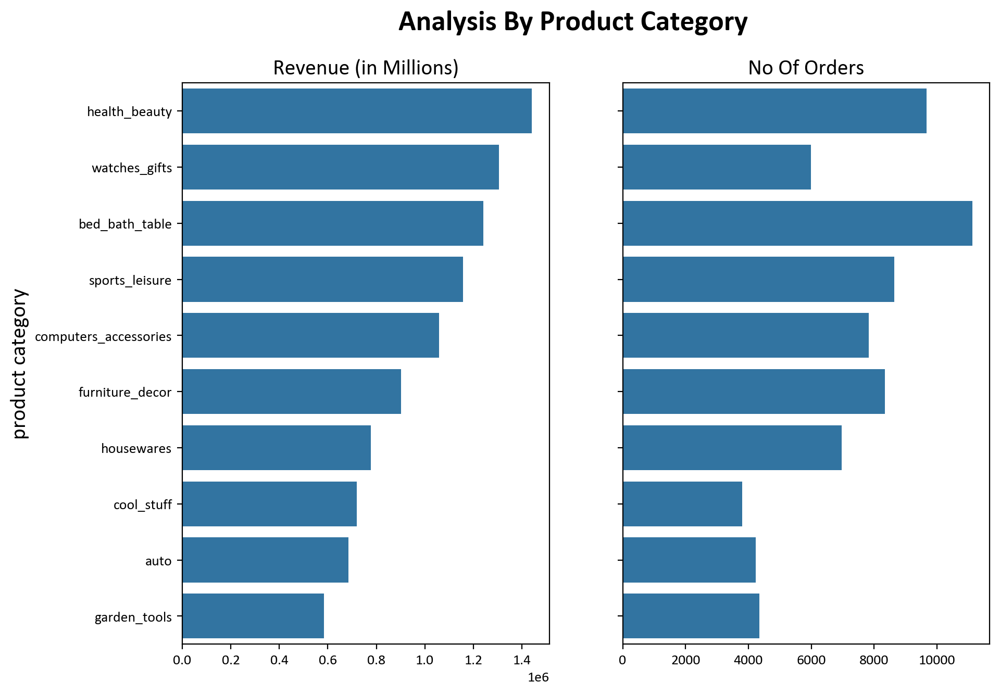

In [127]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 7), sharey=True)
fig.suptitle('Analysis By Product Category', fontsize=20, fontweight = 'bold')

sns.barplot(ax=ax[0], x='total_revenue', y= top10revenueGenerating.product_category_name_english, data = top10revenueGenerating)
ax[0].set_title('Revenue (in Millions)', fontsize = 15)
ax[0].set_ylabel('product category', fontsize = 15)

sns.barplot(ax=ax[1], x='order_id', y = top10revenueGenerating.product_category_name_english, data = top10revenueGenerating)
ax[1].set_title('No Of Orders', fontsize = 15)

for i in range(0,2):
    ax[i].set(xlabel=None)

for i in range(1,2):
    ax[i].set(ylabel=None)

In [128]:
bottom10revenueGenerating = orderedProductsAnalysis.sort_values(by = 'total_revenue', ascending = True)[:10]
bottom10revenueGenerating

,product_category_name_english,product_id,order_id,price,freight_value,total_revenue
61,security_and_services,2,2,283.29,41.22,324.51
29,fashion_childrens_clothes,8,8,569.85,95.51,665.36
11,cds_dvds_musicals,14,14,730.00,224.99,954.99
46,home_comfort_2,30,30,760.27,410.31,1170.58
35,flowers,33,33,1110.04,488.87,1598.91
23,diapers_and_hygiene,39,39,1567.59,573.68,2141.27
3,arts_and_craftmanship,24,24,1814.01,370.13,2184.14
52,la_cuisine,14,14,2054.99,333.55,2388.54
32,fashion_sport,30,30,2119.51,578.13,2697.64
27,fashio_female_clothing,48,48,2803.64,621.75,3425.39


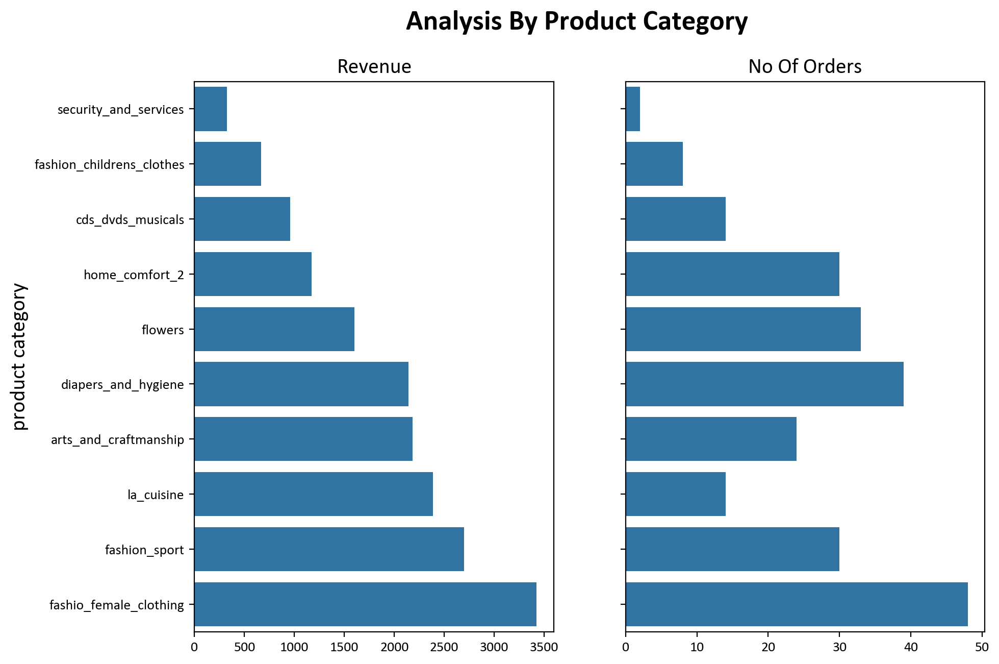

In [129]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 7), sharey=True)
fig.suptitle('Analysis By Product Category', fontsize=20, fontweight = 'bold')

sns.barplot(ax=ax[0], x='total_revenue', y= bottom10revenueGenerating.product_category_name_english, data = bottom10revenueGenerating)
ax[0].set_title('Revenue', fontsize = 15)
ax[0].set_ylabel('product category', fontsize = 15)

sns.barplot(ax=ax[1], x='order_id', y = bottom10revenueGenerating.product_category_name_english, data = bottom10revenueGenerating)
ax[1].set_title('No Of Orders', fontsize = 15)

for i in range(0,2):
    ax[i].set(xlabel=None)

for i in range(1,2):
    ax[i].set(ylabel=None)

Produk yang paling banyak dipesan adalah produk dengan kategori bed_bath_table, sedangkan produk dengan revenue tertinggi yaitu penjualan pada produk dengan kategori health_beauty.

Produk yang paling sedikit dipesan dan menghasilkan revenue paling sedikit adalah produk security_and_services

# Customer Review Analysis

In [130]:
data = pd.read_csv('data/olist_order_reviews_dataset.csv')
data.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [131]:
data['review_comment_length'] = data['review_comment_message'].str.len()
data.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,review_comment_length
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59,NaN
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13,NaN
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24,NaN
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06,37.0
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53,100.0


## Review Score Analysis

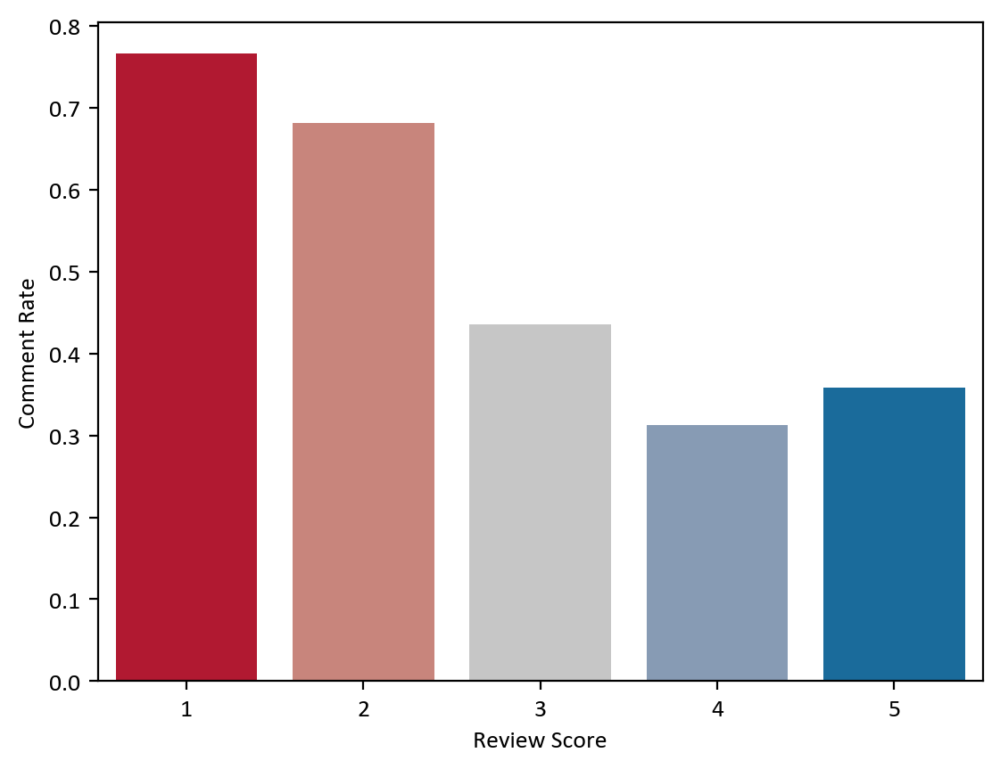

In [132]:
def comment_rate(df):
    return df['review_comment_length'].count() / len(df)

comment_rates = data.groupby('review_score').apply(comment_rate)
sns.barplot(
    x=comment_rates.index, 
    y=comment_rates.values, 
    palette=REVIEWS_PALETTE
).set(xlabel='Review Score', ylabel='Comment Rate');

Pelanggan yang tidak puas (review 1) lebih cenderung menulis komentar daripada pelanggan yang puas (review 4-5)

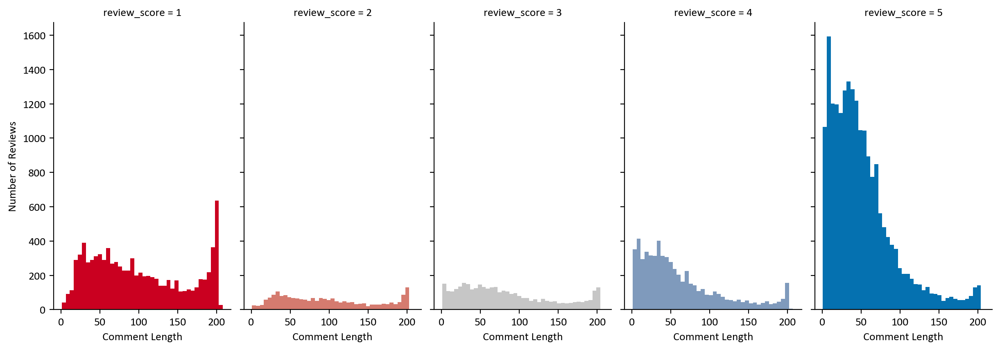

In [133]:
g = sns.FacetGrid(data=data, col='review_score', hue='review_score', palette=REVIEWS_PALETTE)
g.map(plt.hist, 'review_comment_length', bins=40)
g.set_xlabels('Comment Length')
g.set_ylabels('Number of Reviews')
plt.gcf().set_size_inches(12, 5)

In [134]:
data = data[['review_comment_message', 'review_score', 'review_comment_length']].dropna()
data.head()

,review_comment_message,review_score,review_comment_length
3,Recebi bem antes do prazo estipulado.,5,37.0
4,Parabéns lojas lannister adorei comprar pela I...,5,100.0
9,aparelho eficiente. no site a marca do aparelh...,4,174.0
12,"Mas um pouco ,travando...pelo valor ta Boa.\r\n",4,45.0
15,"Vendedor confiável, produto ok e entrega antes...",5,56.0


<Axes: xlabel='review_score', ylabel='review_comment_length'>

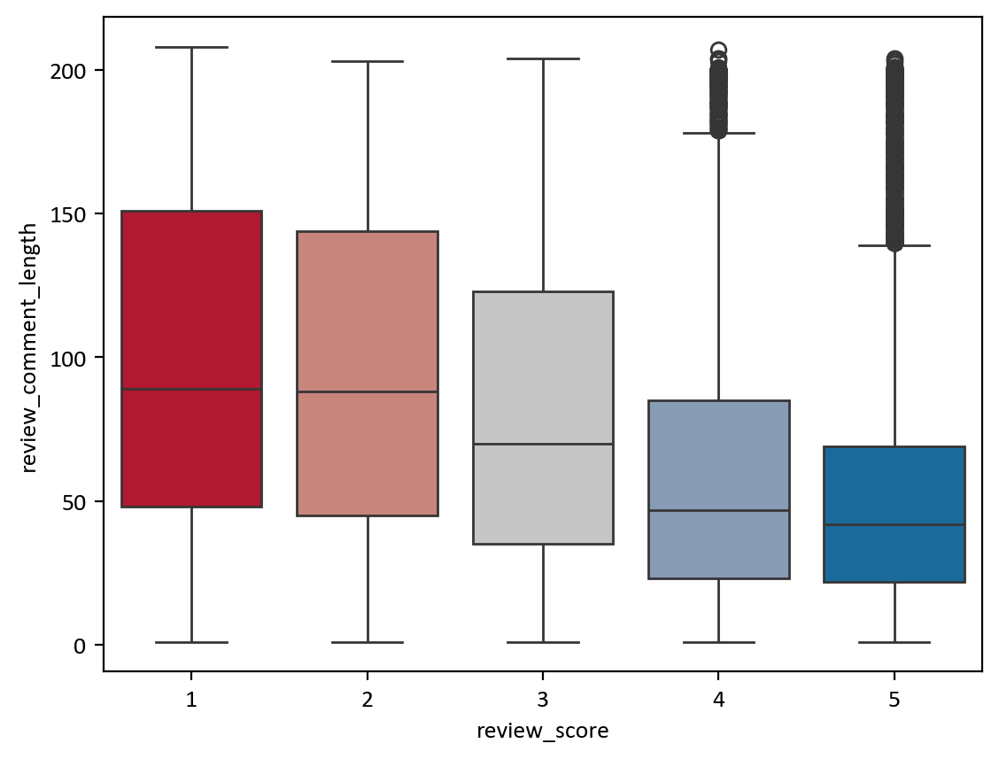

In [135]:
sns.boxplot(x='review_score', y='review_comment_length', data=data, palette=REVIEWS_PALETTE)

Pada review yang memiliki komentar, komentar yang ditulis untuk produk dengan review rendah cenderung lebih panjang daripada komentar pada produk dengan review yang tinggi.

## Customer Comments Analysis with NLP

In [136]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [137]:
def remove_accents(text):
    return unicodedata.normalize('NFKD', text).encode('ascii', errors='ignore').decode('utf-8')

STOP_WORDS = set(remove_accents(w) for w in nltk.corpus.stopwords.words('portuguese'))
STOP_WORDS.remove('nao') # This word is key to understand delivery problems later


def comments_to_words(comment):
    lowered = comment.lower()
    normalized = remove_accents(lowered)
    tokens = nltk.tokenize.word_tokenize(normalized)
    words = tuple(t for t in tokens if t not in STOP_WORDS and t.isalpha())
    return words

def words_to_ngrams(words):
    unigrams, bigrams, trigrams = [], [], []
    for comment_words in words:
        unigrams.extend(comment_words)
        bigrams.extend(' '.join(bigram) for bigram in nltk.bigrams(comment_words))
        trigrams.extend(' '.join(trigram) for trigram in nltk.trigrams(comment_words))
    
    return unigrams, bigrams, trigrams

def plot_freq(tokens, color):
    nltk.FreqDist(tokens).plot(25, cumulative=False, color=color)


In [138]:
commented_reviews = data.copy()
commented_reviews['review_comment_words'] = commented_reviews['review_comment_message'].apply(comments_to_words)

reviews_5s = commented_reviews[commented_reviews['review_score'] == 5]
reviews_1s = commented_reviews[commented_reviews['review_score'] == 1]

unigrams_5s, bigrams_5s, trigrams_5s = words_to_ngrams(reviews_5s['review_comment_words'])
unigrams_1s, bigrams_1s, trigrams_1s = words_to_ngrams(reviews_1s['review_comment_words'])

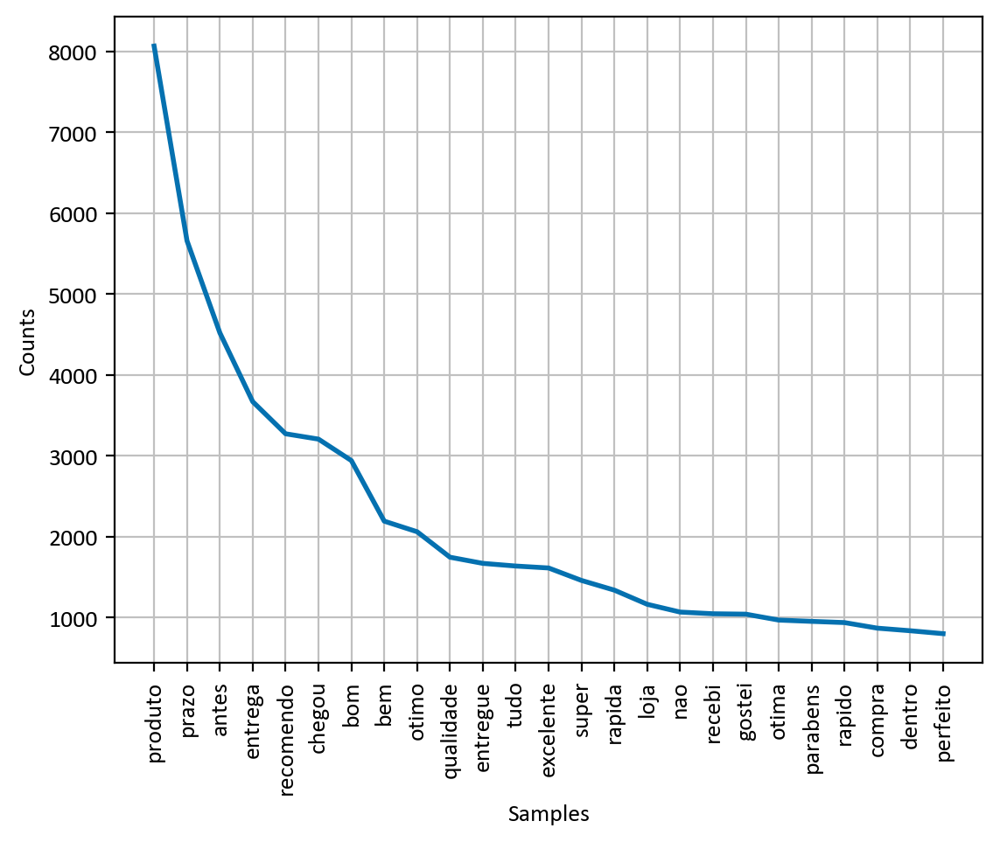

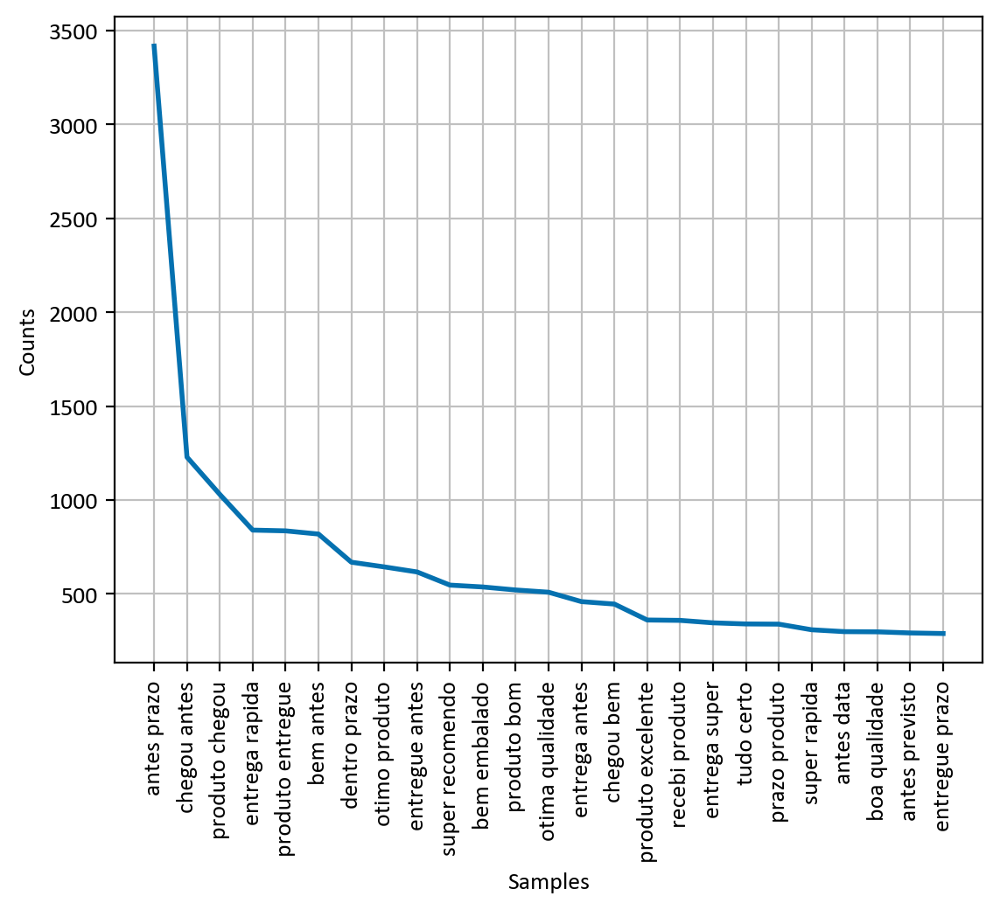

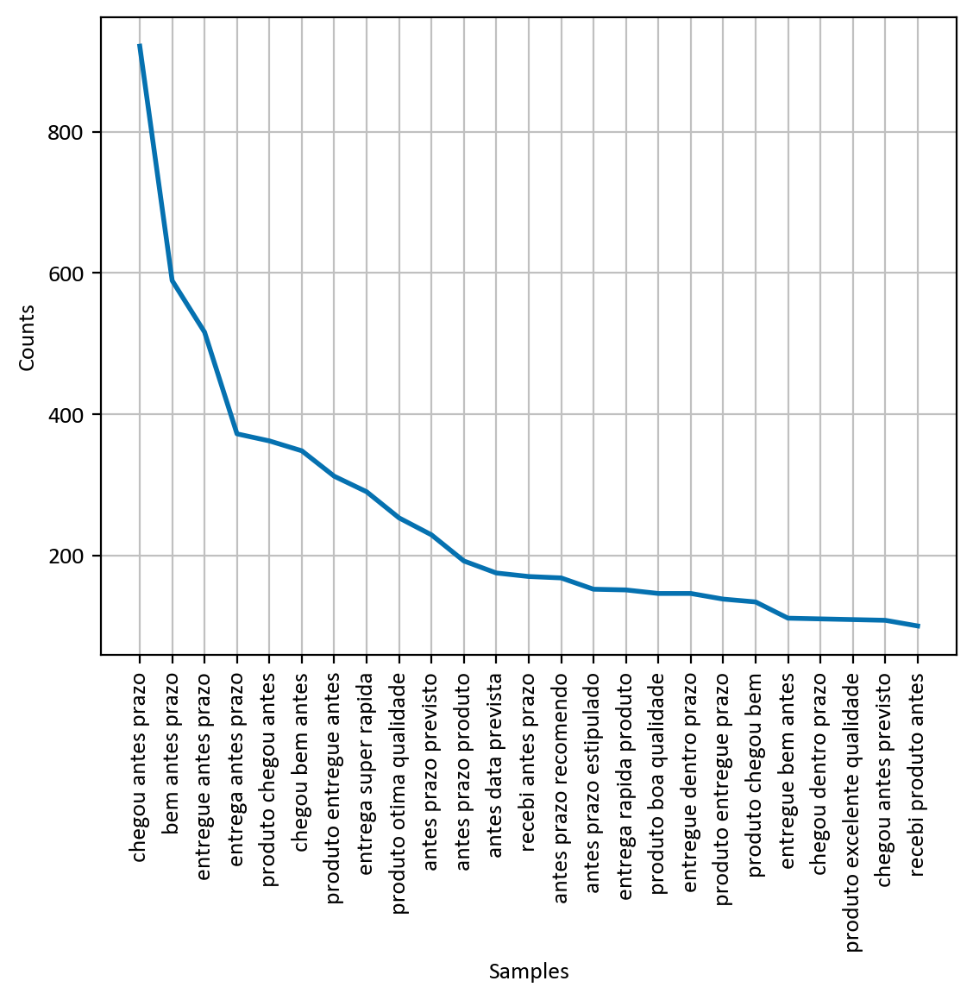

In [139]:
plot_freq(unigrams_5s, COLOR_5S)
plot_freq(bigrams_5s, COLOR_5S)
plot_freq(trigrams_5s, COLOR_5S)

Pelanggan yang memberikan skor 5 pada review (pelanggan yang puas) memberikan komentar mengenai:
- Pengiriman cepat, sebelum tenggat waktu (chegou antes prazo, produto chegou antes, dll.)
- Produk yang berkualitas (produto otima qualidade,produto boa qualidade)

Sejalan dengan analisis sebelumnya, pengiriman dapat berdampak pada kepuasan pelanggan.

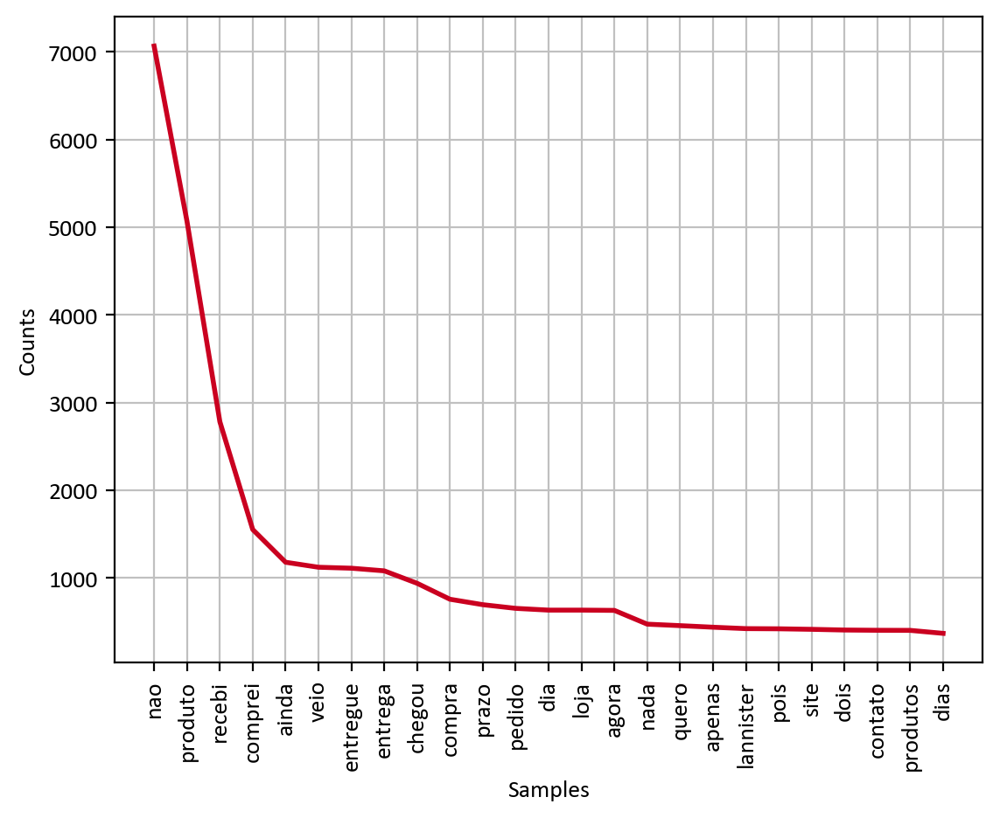

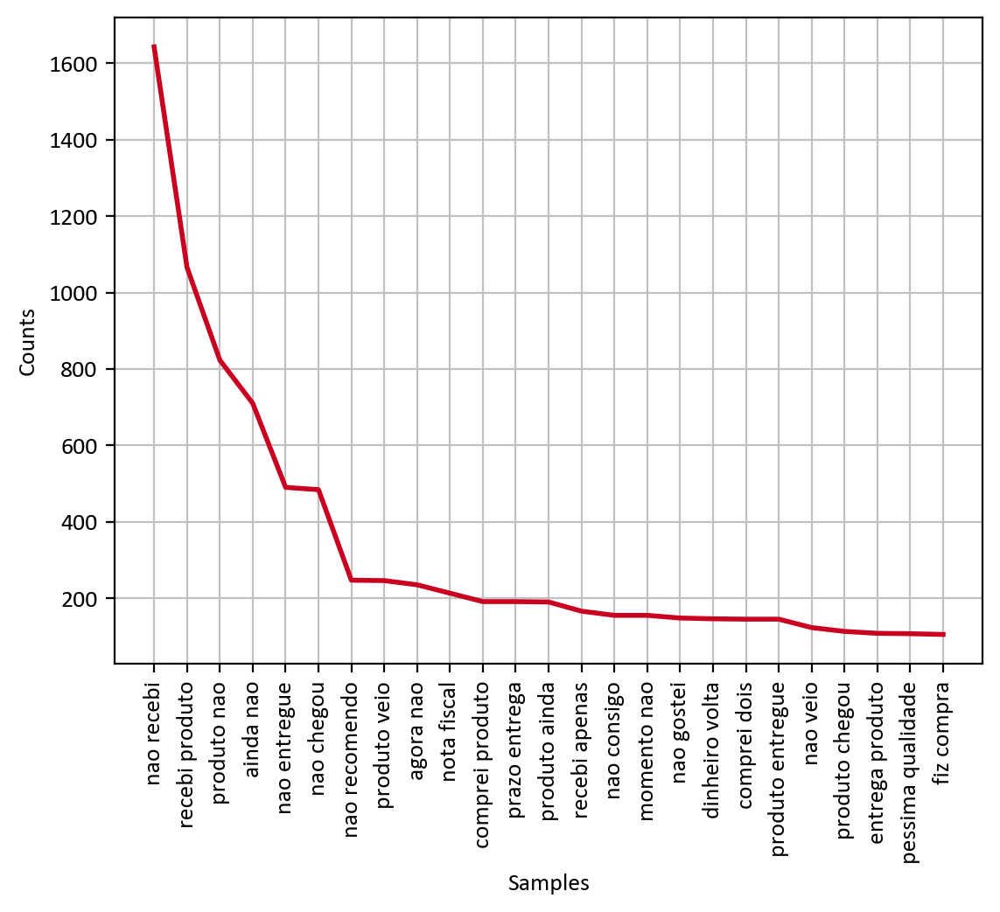

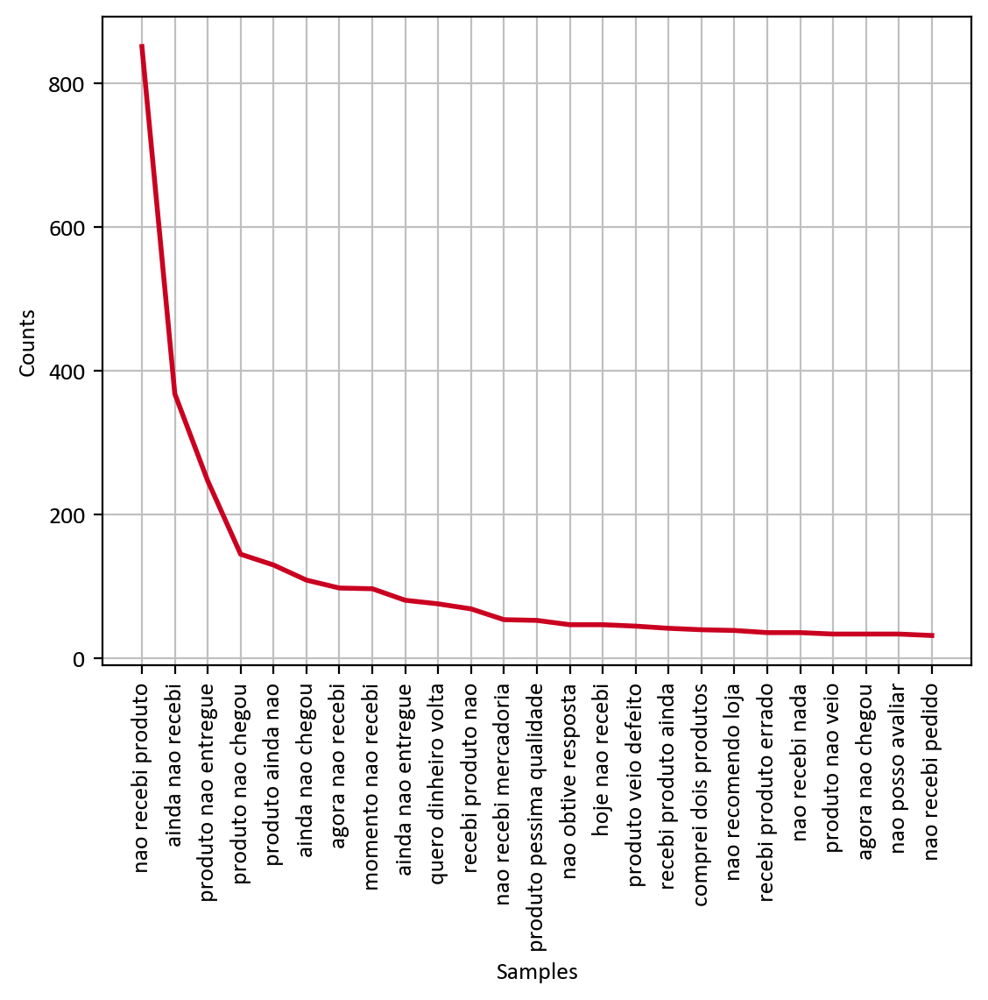

In [140]:
plot_freq(unigrams_1s, COLOR_1S)
plot_freq(bigrams_1s, COLOR_1S)
plot_freq(trigrams_1s, COLOR_1S)

Pelanggan yang memberikan skor 1 pada review (pelanggan yang tidak puas) memberikan komentar mengenai:
- Produk tidak diterima (nao recebi produto, agora nao recebi, dll)
- Kualitas produk yang buruk (produto pessima qualidade)

Terdapat banyak pelanggan yang mengaku tidak menerima produknya, terlepas dari delivery date yang sudah muncul. Selain mengevaluasi waktu pengiriman, perusahaan juga perlu mengevaluasi kembali proses logistik untuk memastikan pelanggan benar-benar menerima produknya.

# Data Prep

In [141]:
#Menggabungkan Dataset
merged = customers.merge(orders, on = 'customer_id').merge(orderItems, on = 'order_id').merge(products, on = 'product_id').merge(geolocationMean, left_on = 'customer_zip_code_prefix', right_on = 'geolocation_zip_code_prefix').merge(payments, on = 'order_id').merge(sellers, on = 'seller_id').merge(productCategoryTranslation, on = 'product_category_name').merge(orderReviews, on = 'order_id', how = 'left')
merged.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,payment_sequential,payment_type,payment_installments,payment_value,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05,997,6,1,10,8,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,14409,-20.468849,-47.382173,1,credit_card,2,146.87,8577,itaquaquecetuba,SP,office_furniture,88b8b52d46df026a9d1ad2136a59b30b,4.0,NaN,NaN,2017-05-26,2017-05-30 22:34:40
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,2017-11-28 00:09:50,2017-12-19,86255,12,5,20,18,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,112.99,24.90,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,68030,-2.430314,-54.693217,1,credit_card,1,275.79,8577,itaquaquecetuba,SP,office_furniture,7fc63200f12eebb5f387856afdd63db8,1.0,NaN,"GOSTARIA DE UMA SOLUÇÃO, ESTOU PRECISANDO MUIT...",2017-11-29,2017-12-01 19:41:59
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,2017-11-28 00:09:50,2017-12-19,86255,12,5,20,18,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,112.99,24.90,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,68030,-2.430314,-54.693217,1,credit_card,1,275.79,8577,itaquaquecetuba,SP,office_furniture,7fc63200f12eebb5f387856afdd63db8,1.0,NaN,"GOSTARIA DE UMA SOLUÇÃO, ESTOU PRECISANDO MUIT...",2017-11-29,2017-12-01 19:41:59
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,2017-05-26 09:54:04,2017-06-12,7890,10,6,16,18,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 22:22:56,124.99,15.62,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,92480,-29.826454,-51.245676,1,credit_card,7,140.61,8577,itaquaquecetuba,SP,office_furniture,251191809e37c1cffc16865947c18a4d,3.0,NaN,"Produto compatível com seu valor, muito bonito...",2017-05-27,2017-05-28 02:43:16
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,2018-02-28 21:09:00,2018-03-22,9819,14,9,21,25,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2018-02-18 21:29:19,106.99,30.59,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,25931,-22.604835,-43.026500,1,credit_card,10,137.58,8577,itaquaquecetuba,SP,office_furniture,f7123bac5b91a0e2e38d8b41fd1206f4,4.0,NaN,Entregou antes do prazo,2018-03-01,2018-03-02 11:11:24


In [142]:
merged.shape

(112124, 48)

In [143]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112124 entries, 0 to 112123
Data columns (total 48 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_id                    112124 non-null  object        
 1   customer_unique_id             112124 non-null  object        
 2   customer_zip_code_prefix       112124 non-null  object        
 3   customer_city                  112124 non-null  object        
 4   customer_state                 112124 non-null  object        
 5   order_id                       112124 non-null  object        
 6   order_status                   112124 non-null  object        
 7   order_purchase_timestamp       112124 non-null  datetime64[ns]
 8   order_approved_at              112124 non-null  datetime64[ns]
 9   order_delivered_carrier_date   112124 non-null  datetime64[ns]
 10  order_delivered_customer_date  112124 non-null  datetime64[ns]
 11  

In [144]:
merged.drop(columns = ['order_status', 'order_item_id', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'approved_carrier', 'carrier_delivered', 'seller_id', 'shipping_limit_date', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'geolocation_zip_code_prefix', 'payment_sequential', 'seller_zip_code_prefix', 'review_id', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp', 'seller_city', 'seller_state'], axis = 1, inplace = True)
merged.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,purchased_approved,delivered_estimated,purchased_delivered,product_id,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,product_category_name_english,review_score
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,997,10,8,a9516a079e37a9c9c36b9b78b10169e8,124.99,21.88,8683.0,54.0,64.0,31.0,-20.468849,-47.382173,credit_card,2,146.87,office_furniture,4.0
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,2017-11-09 00:50:13,86255,20,18,a9516a079e37a9c9c36b9b78b10169e8,112.99,24.90,8683.0,54.0,64.0,31.0,-2.430314,-54.693217,credit_card,1,275.79,office_furniture,1.0
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,2017-11-09 00:50:13,86255,20,18,a9516a079e37a9c9c36b9b78b10169e8,112.99,24.90,8683.0,54.0,64.0,31.0,-2.430314,-54.693217,credit_card,1,275.79,office_furniture,1.0
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,2017-05-07 20:11:26,7890,16,18,a9516a079e37a9c9c36b9b78b10169e8,124.99,15.62,8683.0,54.0,64.0,31.0,-29.826454,-51.245676,credit_card,7,140.61,office_furniture,3.0
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,2018-02-03 19:45:40,9819,21,25,a9516a079e37a9c9c36b9b78b10169e8,106.99,30.59,8683.0,54.0,64.0,31.0,-22.604835,-43.026500,credit_card,10,137.58,office_furniture,4.0


In [145]:
#menggabungkan berdasarkan masing-masing pelanggan
final = merged.groupby('customer_unique_id', as_index=False).agg({'customer_zip_code_prefix'      : 'max',
                                                                  'customer_city'                 : 'max',
                                                                  'customer_state'                : 'max',
                                                                  'order_id'                      : 'nunique',
                                                                  'purchased_approved'            : 'mean',
                                                                  'delivered_estimated'           : 'min',
                                                                  'purchased_delivered'           : 'mean',
                                                                  'product_id'                    : 'nunique',
                                                                  'price'                         : 'sum',
                                                                  'freight_value'                 : 'sum',
                                                                  'product_weight_g'              : 'sum',
                                                                  'product_length_cm'             : 'sum',
                                                                  'product_height_cm'             : 'sum',
                                                                  'product_width_cm'              : 'sum',
                                                                  'geolocation_lat'               : 'mean',
                                                                  'geolocation_lng'               : 'mean',
                                                                  'payment_type'                  : 'max',
                                                                  'payment_installments'          : 'max',
                                                                  'payment_value'                 : 'sum',
                                                                  'review_score'                  : 'mean'})

final.head()

,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,purchased_approved,delivered_estimated,purchased_delivered,product_id,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,review_score
0,0000366f3b9a7992bf8c76cfdf3221e2,7787,cajamar,SP,1,891.0,4,6.0,1,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,credit_card,8,141.90,5.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,6053,osasco,SP,1,26057.0,4,3.0,1,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,credit_card,1,27.19,4.0
2,0000f46a3911fa3c0805444483337064,88115,sao jose,SC,1,0.0,1,25.0,1,69.00,17.22,1500.0,25.0,50.0,35.0,-27.532246,-48.618667,credit_card,8,86.22,3.0
3,0000f6ccb0745a6a4b88665a16c9f078,66812,belem,PA,1,1176.0,11,20.0,1,25.99,17.63,150.0,19.0,5.0,11.0,-1.304189,-48.476339,credit_card,4,43.62,4.0
4,0004aac84e0df4da2b147fca70cf8255,18040,sorocaba,SP,1,1270.0,7,13.0,1,180.00,16.89,6050.0,16.0,3.0,11.0,-23.496567,-47.462811,credit_card,6,196.89,5.0


In [146]:
final.rename(columns = {'order_id' : 'no_of_orders', 'product_id' : 'no_of_products'}, inplace = True)

In [147]:
final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90528 entries, 0 to 90527
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_unique_id        90528 non-null  object 
 1   customer_zip_code_prefix  90528 non-null  object 
 2   customer_city             90528 non-null  object 
 3   customer_state            90528 non-null  object 
 4   no_of_orders              90528 non-null  int64  
 5   purchased_approved        90528 non-null  float64
 6   delivered_estimated       90528 non-null  int64  
 7   purchased_delivered       90528 non-null  float64
 8   no_of_products            90528 non-null  int64  
 9   price                     90528 non-null  float64
 10  freight_value             90528 non-null  float64
 11  product_weight_g          90528 non-null  float64
 12  product_length_cm         90528 non-null  float64
 13  product_height_cm         90528 non-null  float64
 14  produc

In [148]:
final['customer_zip_code_prefix'] = final.customer_zip_code_prefix.astype('object')

In [149]:
final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90528 entries, 0 to 90527
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_unique_id        90528 non-null  object 
 1   customer_zip_code_prefix  90528 non-null  object 
 2   customer_city             90528 non-null  object 
 3   customer_state            90528 non-null  object 
 4   no_of_orders              90528 non-null  int64  
 5   purchased_approved        90528 non-null  float64
 6   delivered_estimated       90528 non-null  int64  
 7   purchased_delivered       90528 non-null  float64
 8   no_of_products            90528 non-null  int64  
 9   price                     90528 non-null  float64
 10  freight_value             90528 non-null  float64
 11  product_weight_g          90528 non-null  float64
 12  product_length_cm         90528 non-null  float64
 13  product_height_cm         90528 non-null  float64
 14  produc

# RFM analysis
Bertujuan untuk membagi pelanggan berdasarkan kapan mereka melakukan pembelian terakhir, seberapa sering mereka pernah melakukan pembelian, dan jumlah uang yang dibelanjakan secara keseluruhan.

## Recency
Dihitung dari tanggal observasi terakhir pada dataset dikurangi tanggal terakhir pembelian

In [150]:
recency = merged.groupby('customer_unique_id', as_index=False)['order_purchase_timestamp'].max()
recency.rename(columns={'order_purchase_timestamp':'LastPurchaseDate'},inplace = True)
recency.head()

,customer_unique_id,LastPurchaseDate
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42


In [151]:
recent_date = merged['order_purchase_timestamp'].dt.date.max()
print('The last recent date in the available dataset is: ', recent_date)

The last recent date in the available dataset is:  2018-08-29


In [152]:
recency['Recency'] = recency['LastPurchaseDate'].dt.date.apply(lambda x: (recent_date - x).days)
recency.head()

,customer_unique_id,LastPurchaseDate,Recency
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,111
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,114
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,537
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,321
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,288


## Frequency
Menghitung berapa kali pelanggan melakukan pemesanan berdasarkan jumlah order_id yang unik.

In [153]:
frequency = merged.groupby(["customer_unique_id"]).agg({"order_id":"nunique"}).reset_index()
frequency.rename(columns={'order_id':'Frequency'},inplace=True)
frequency.head()

,customer_unique_id,Frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1


## Monetary
Dihitung dari total pembayaran masing-masing pelanggan.

In [154]:
monetary = merged.groupby('customer_unique_id', as_index=False)['payment_value'].sum()
monetary.rename(columns={'payment_value':'Monetary'},inplace=True)
monetary.head()

,customer_unique_id,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89


In [155]:
rfm = recency.merge(frequency, on='customer_unique_id')
rfm = rfm.merge(monetary, on='customer_unique_id').drop(columns='LastPurchaseDate')
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89


## Analysing RFM

In [156]:
rfm[rfm.Recency == 0]

,customer_unique_id,Recency,Frequency,Monetary
1463,0421e7a23f21e5d54efed456aedbc513,0,1,119.42
4454,0c6d7218d5f3fa14514fd29865269993,0,1,178.25
12062,21dbe8eabd00b34492a939c540e2b1a7,0,1,14.29
13032,24ac2b4327e25baf39f2119e4228976a,0,1,93.75
32785,5c58de6fb80e93396e2f35642666b693,0,1,1021.92
43195,7a22d14aa3c3599238509ddca4b93b01,0,1,73.10
45280,7febafa06d9d8f232a900a2937f04338,0,1,61.29
62249,afbcfd0b9c5233e7ccc73428526fbb52,0,1,2486.25
64024,b4dcade04bc548b7e3b0243c801f8c26,0,1,106.95
64767,b701bebbdf478f5500348f03aff62121,0,1,33.23


In [157]:
rfm['Recency'] = rfm.Recency.apply(lambda x: 1 if x == 0 else x)

Pelanggan yang memiliki nilai Recency 0 berarti melakukan transaksi pada hari terakhir observasi. nilai 0 ini diubah menjadi 1 agar tidak ada error saat membuat variable target kami (churn)

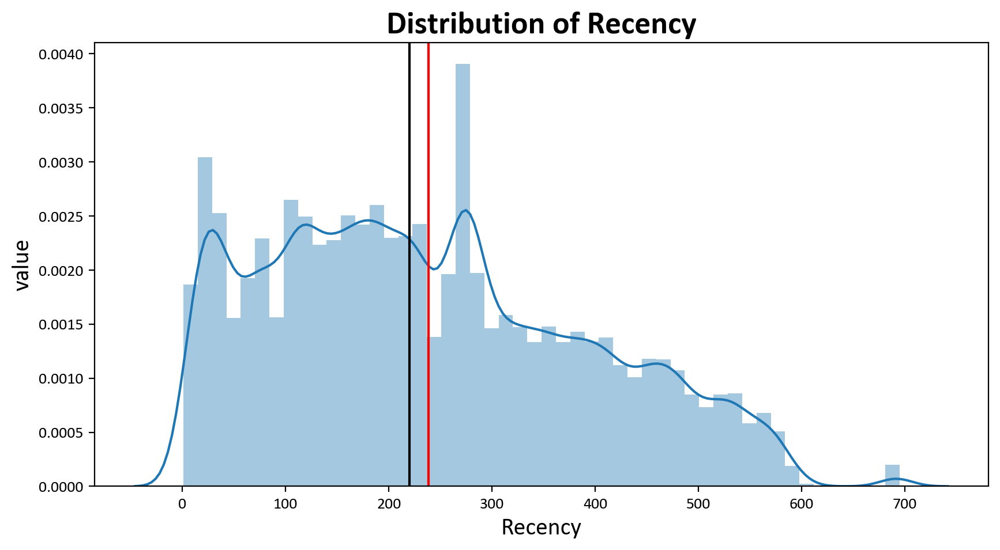

Mean of recency:  238.73377297631671
Median of recency:  220.0
Skewness of recency:  0.43585883202493925


In [158]:
plt.figure(figsize = (10, 5))
sns.distplot(rfm.Recency)
plt.axvline(rfm.Recency.mean(), c = 'red')
plt.axvline(rfm.Recency.median(), c = 'black')
plt.title('Distribution of Recency',fontweight='bold',fontsize=20)
plt.xlabel('Recency',fontsize=15,color='black')
plt.ylabel('value',fontsize=15,color='black')
plt.show()
print('Mean of recency: ', rfm.Recency.mean())
print('Median of recency: ', rfm.Recency.median())
print('Skewness of recency: ', rfm.Recency.skew())

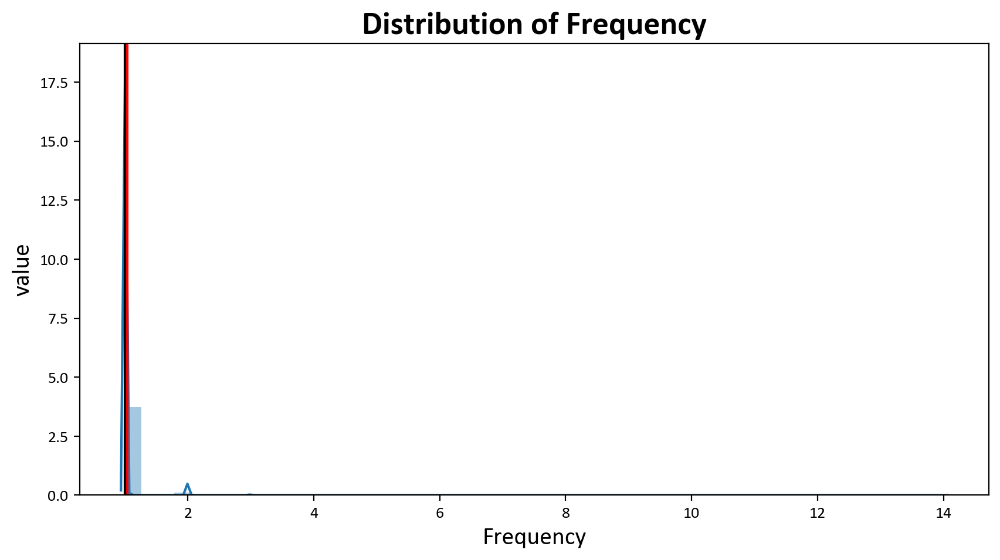

Mean of frequency:  1.0328958996111701
Median of frequency:  1.0
Skewness of frequency:  10.676600298052568


In [159]:
plt.figure(figsize = (10, 5))
sns.distplot(rfm.Frequency)
plt.axvline(rfm.Frequency.mean(), c = 'red')
plt.axvline(rfm.Frequency.median(), c = 'black')
plt.title('Distribution of Frequency',fontweight='bold',fontsize=20)
plt.xlabel('Frequency',fontsize=15,color='black')
plt.ylabel('value',fontsize=15,color='black')
plt.show()
print('Mean of frequency: ', rfm.Frequency.mean())
print('Median of frequency: ', rfm.Frequency.median())
print('Skewness of frequency: ', rfm.Frequency.skew())

In [160]:
Q1 = np.quantile(rfm.Frequency, 0.25)
Q3 = np.quantile(rfm.Frequency, 0.75)
IQR = Q3 - Q1
frequencyDistribution = rfm[~((rfm.Frequency < Q1 - 1.5 * IQR) | (rfm.Frequency > Q3 + 1.5 * IQR))]
frequencyDistribution.head()

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89


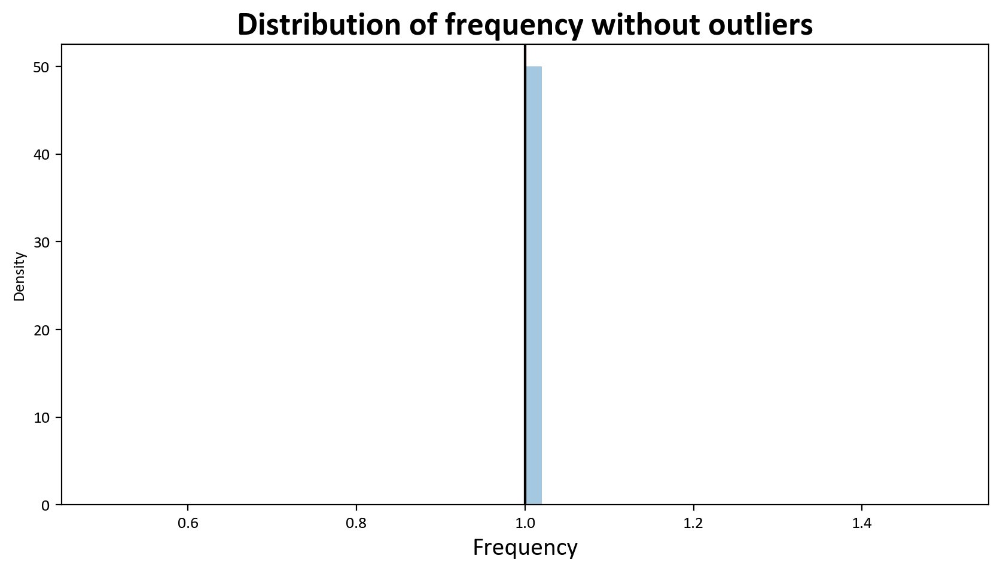

In [161]:
plt.figure(figsize=(10, 5))
sns.distplot(frequencyDistribution.Frequency)
plt.axvline(frequencyDistribution.Frequency.mean(), c = 'red')
plt.axvline(frequencyDistribution.Frequency.median(), c = 'black')
plt.xlabel('Frequency',color='black',fontsize=15)
plt.title('Distribution of frequency without outliers',color='black',fontsize=20,fontweight='bold')
plt.show()

In [162]:
frequencyDistribution.Frequency.describe()

count    87850.0
mean         1.0
std          0.0
min          1.0
25%          1.0
50%          1.0
75%          1.0
max          1.0
Name: Frequency, dtype: float64

Jika outlier dihapus, semua nilai frequency adalah 1. Maka frekuensi tidak membantu dalam analisis atau saat ingin membagi pelanggan.

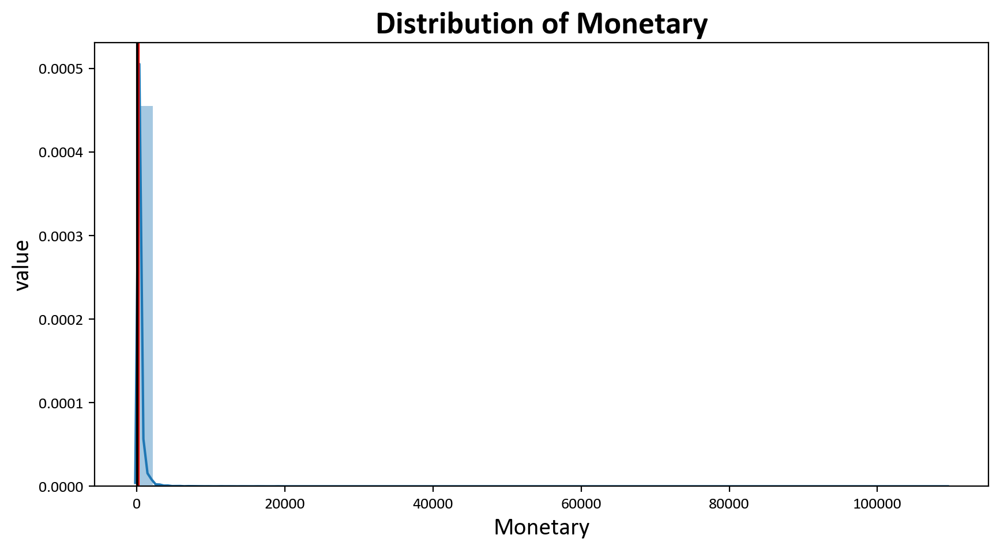

Mean of monetary:  213.36403256451038
Median of monetary:  112.99
Skewness of monetary:  69.45531310765217


In [163]:
plt.figure(figsize = (10, 5))
sns.distplot(rfm.Monetary)
plt.axvline(rfm.Monetary.mean(), c = 'red')
plt.axvline(rfm.Monetary.median(), c = 'black')
plt.title('Distribution of Monetary',fontweight='bold',fontsize=20)
plt.xlabel('Monetary',fontsize=15,color='black')
plt.ylabel('value',fontsize=15,color='black')
plt.show()
print('Mean of monetary: ', rfm.Monetary.mean())
print('Median of monetary: ', rfm.Monetary.median())
print('Skewness of monetary: ', rfm.Monetary.skew())

In [164]:
Q1 = np.quantile(rfm.Monetary, 0.25)
Q3 = np.quantile(rfm.Monetary, 0.75)
IQR = Q3 - Q1
monetaryDistribution = rfm[~((rfm.Monetary < Q1 - 1.5 * IQR) | (rfm.Monetary > Q3 + 1.5 * IQR))]
monetaryDistribution.head()

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89


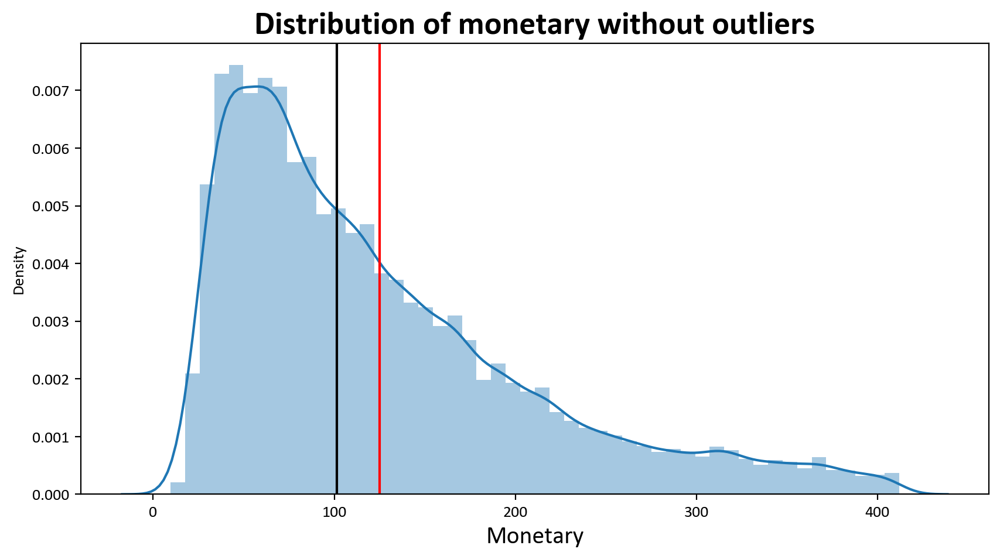

In [165]:
plt.figure(figsize=(10, 5))
sns.distplot(monetaryDistribution.Monetary)
plt.axvline(monetaryDistribution.Monetary.mean(), c = 'red')
plt.axvline(monetaryDistribution.Monetary.median(), c = 'black')
plt.xlabel('Monetary',color='black',fontsize=15)
plt.title('Distribution of monetary without outliers',color='black',fontsize=20,fontweight='bold')
plt.show()

In [166]:
monetaryDistribution.Monetary.describe()

count    81665.000000
mean       125.150342
std         85.615531
min          9.590000
25%         60.000000
50%        101.340000
75%        167.200000
max        411.910000
Name: Monetary, dtype: float64

- Nilai moneter rata-rata setelah membuang outlier adalah 124,74 Real Brasil, sedangkan nilai median adalah 101,25 Real Brasil.
- Nilai tengah 50% dari nilai moneter berada di antara 60 dan 166,71 Real Brasil.

# Customer Segmentation

## Labels for Recency

In [167]:
ll_r = rfm.Recency.quantile(0.25)
mid_r = rfm.Recency.quantile(0.50)
ul_r = rfm.Recency.quantile(0.75)
print(ll_r, mid_r, ul_r)

115.0 220.0 347.0


In [168]:
def recency_label(recent):
    if recent <= ll_r:
        return 1
    elif (recent > ll_r) and (recent <= mid_r):
        return 2
    elif (recent > mid_r) and (recent <= ul_r):
        return 3
    elif recent > ul_r:
        return 4

In [169]:
rfm['recency_label'] = rfm.Recency.apply(recency_label)
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3


Pembagian label Recency dilakukan berdasarkan kuantil, sehingga terbentuk 4 kelompok:
- 1 adalah pelanggan yang kunjungan terakhirnya paling baru
- 2 adalah pelanggan yang kunjungan terakhirnya tidak terlalu baru.
- 3 adalah pelanggan yang kunjungan terakhirnya cukup baru. 
- 4 adalah pelanggan yang kunjungan terakhirnya yang paling lama.

## Labels for Monetary

In [170]:
ll_m = rfm.Monetary.quantile(0.25)
mid_m = rfm.Monetary.quantile(0.50)
ul_m = rfm.Monetary.quantile(0.75)
print(ll_m, mid_m, ul_m)

63.837500000000006 112.99 203.08


In [171]:
def monetary_label(money):
    if money <= ll_m:
        return 4
    elif (money > ll_m) and (money <= mid_m):
        return 3
    elif (money > mid_m) and (money <= ul_m):
        return 2
    elif money > ul_m:
        return 1

In [172]:
rfm['monetary_label'] = rfm.Monetary.apply(monetary_label)
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2


Pembagian label Moneter sama dengan pembagian Recency.:
- 1 adalah pelanggan yang menghabiskan jumlah besar. (Nilai Moneter dalam kuartil 25%)<br>
- 2 adalah pelanggan yang menghabiskan jumlah yang baik. (Nilai Moneter antara kuartil 25% dan 50%)<br>
- 3 adalah pelanggan yang menghabiskan secara sedang. (Nilai Moneter antara kuartil 50% dan 75%)<br>
- 4 adalah pelanggan yang menghabiskan paling sedikit. (Nilai Moneter lebih dari kuartil 75%)

## Label Frekuensi

In [173]:
rfm.Frequency.value_counts()

Frequency
1     87850
2      2462
3       171
4        28
5         9
6         3
7         3
9         1
14        1
Name: count, dtype: int64

In [174]:
def frequency_label(frequent):
    if frequent == 1:
        return 4
    elif frequent == 2:
        return 3
    elif frequent == 3:
        return 2
    elif frequent > 3:
        return 1

In [175]:
rfm['frequency_label'] = rfm.Frequency.apply(frequency_label)
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label,frequency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2,4
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4,4
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3,4
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4,4
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2,4


Pembagian label Frekuensi:
- 1 adalah pelanggan paling sering. (Frekuensi > 3)
- 2 adalah pelanggan yang cukup sering. (Frekuensi = 3)
- 3 adalah pelanggan yang agak sering. (Frekuensi = 2)
- 4 adalah pelanggan yang paling jarang. (Frekuensi = 1)

In [176]:
rfm['Rank'] = list(zip(rfm.recency_label, rfm.monetary_label, rfm.frequency_label))
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label,frequency_label,Rank
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2,4,"(1, 2, 4)"
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4,4,"(1, 4, 4)"
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3,4,"(4, 3, 4)"
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4,4,"(3, 4, 4)"
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2,4,"(3, 2, 4)"


In [177]:
rfm.recency_label.value_counts()

recency_label
1    22754
4    22595
3    22594
2    22585
Name: count, dtype: int64

In [178]:
rfm.frequency_label.value_counts()

frequency_label
4    87850
3     2462
2      171
1       45
Name: count, dtype: int64

In [179]:
rfm.monetary_label.value_counts()

monetary_label
3    22637
4    22632
1    22631
2    22628
Name: count, dtype: int64

Seperti sudah disebutkan sebelumnya bahwa frekuensi pelanggan sangat banyak yang berjumlah 1, maka yang digunakan adalah recency dan monetary untuk segmentasi pelanggan.

In [180]:
rfm['rank_rm'] = list(zip(rfm.recency_label, rfm.monetary_label))
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label,frequency_label,Rank,rank_rm
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2,4,"(1, 2, 4)","(1, 2)"
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4,4,"(1, 4, 4)","(1, 4)"
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3,4,"(4, 3, 4)","(4, 3)"
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4,4,"(3, 4, 4)","(3, 4)"
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2,4,"(3, 2, 4)","(3, 2)"


In [181]:
rfm.rank_rm.value_counts()

rank_rm
(1, 2)    5887
(3, 3)    5849
(4, 3)    5827
(1, 1)    5763
(2, 4)    5741
(4, 4)    5720
(2, 2)    5700
(3, 1)    5681
(2, 1)    5647
(1, 4)    5640
(4, 1)    5540
(3, 2)    5533
(3, 4)    5531
(4, 2)    5508
(2, 3)    5497
(1, 3)    5464
Name: count, dtype: int64

## Makna Ranking:
### Rank yang paling perlu diperhatikan:
- (Recency - 1, Moneter - 1) - Mereka sangat baru dan telah menghabiskan banyak uang
- (Recency - 1, Moneter - 2) - Mereka sangat baru dan telah menghabiskan sejumlah uang yang baik
- (Recency - 2, Moneter - 1) - Mereka baru dan telah menghabiskan banyak uang
- (Recency - 2, Moneter - 2) - Mereka baru dan telah menghabiskan sejumlah uang yang baik
- (Recency - 1, Moneter - 3) - Mereka sangat baru dan telah menghabiskan sejumlah uang yang cukup

### Rank yang kurang perlu diperhatikan:
- (Recency - 4, Moneter - 4) - Mereka sama sekali tidak baru dan menghabiskan jumlah uang yang tidak berarti
- (Recency - 4, Moneter - 3) - Mereka sama sekali tidak baru dan menghabiskan sejumlah uang yang cukup
- (Recency - 4, Moneter - 2) - Mereka sama sekali tidak baru dan telah menghabiskan sejumlah uang yang baik
- (Recency - 3, Moneter - 4) - Mereka tidak begitu baru dan menghabiskan jumlah uang yang tidak berarti
- (Recency - 3, Moneter - 3) - Mereka tidak begitu baru dan telah menghabiskan sejumlah uang yang cukup


## Creating Target Variable

In [182]:
rfm['Churn'] = rfm.Recency.apply(lambda x: 1 if x > rfm.Recency.mean() else 0)
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label,frequency_label,Rank,rank_rm,Churn
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2,4,"(1, 2, 4)","(1, 2)",0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4,4,"(1, 4, 4)","(1, 4)",0
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3,4,"(4, 3, 4)","(4, 3)",1
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4,4,"(3, 4, 4)","(3, 4)",1
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2,4,"(3, 2, 4)","(3, 2)",1



- churn adalah kondisi di mana pelanggan berhenti menggunakan suatu bisnis.
- Kami menggunakan kolom Recency untuk membentuk variabel churn. Jika recency pelanggan berada di atas nilai rata-rata recency, kami mempertimbangkan pelanggan tersebut sebagai telah berhenti (churned = 1). Sisanya pelanggan sebagai tidak berhenti (not churn = 0).
- Kami menggunakan rata-rata recency sebagai ambang batas.

In [183]:
# Merging target to dataframe
final = final.merge(rfm[['customer_unique_id', 'Recency', 'Monetary', 'Frequency', 'Churn']], on = 'customer_unique_id')
final.head()

,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,no_of_orders,purchased_approved,delivered_estimated,purchased_delivered,no_of_products,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,review_score,Recency,Monetary,Frequency,Churn
0,0000366f3b9a7992bf8c76cfdf3221e2,7787,cajamar,SP,1,891.0,4,6.0,1,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,credit_card,8,141.90,5.0,111,141.90,1,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,6053,osasco,SP,1,26057.0,4,3.0,1,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,credit_card,1,27.19,4.0,114,27.19,1,0
2,0000f46a3911fa3c0805444483337064,88115,sao jose,SC,1,0.0,1,25.0,1,69.00,17.22,1500.0,25.0,50.0,35.0,-27.532246,-48.618667,credit_card,8,86.22,3.0,537,86.22,1,1
3,0000f6ccb0745a6a4b88665a16c9f078,66812,belem,PA,1,1176.0,11,20.0,1,25.99,17.63,150.0,19.0,5.0,11.0,-1.304189,-48.476339,credit_card,4,43.62,4.0,321,43.62,1,1
4,0004aac84e0df4da2b147fca70cf8255,18040,sorocaba,SP,1,1270.0,7,13.0,1,180.00,16.89,6050.0,16.0,3.0,11.0,-23.496567,-47.462811,credit_card,6,196.89,5.0,288,196.89,1,1


In [184]:
records, features = final.shape
print('Total number of unique records: ', records)
print('Total number of features: ', features)

Total number of unique records:  90528
Total number of features:  25


In [185]:
final['Churn'] = final.Churn.astype('object')

### Handling Outliers

Skewness of no_of_orders: 10.676600298052568
Standard deviation of no_of_orders: 0.20649360862520988


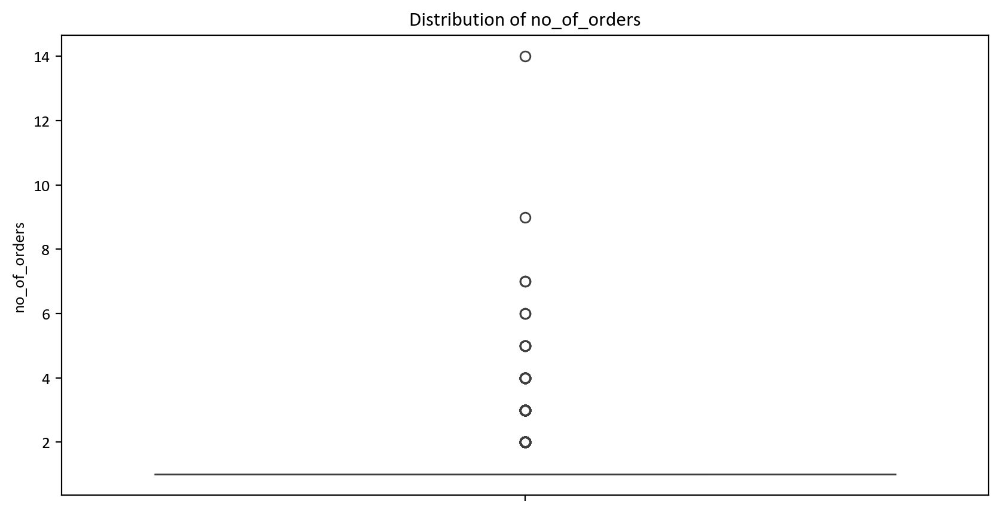

Skewness of purchased_approved: 1.6936650724829136
Standard deviation of purchased_approved: 23397.795858621448


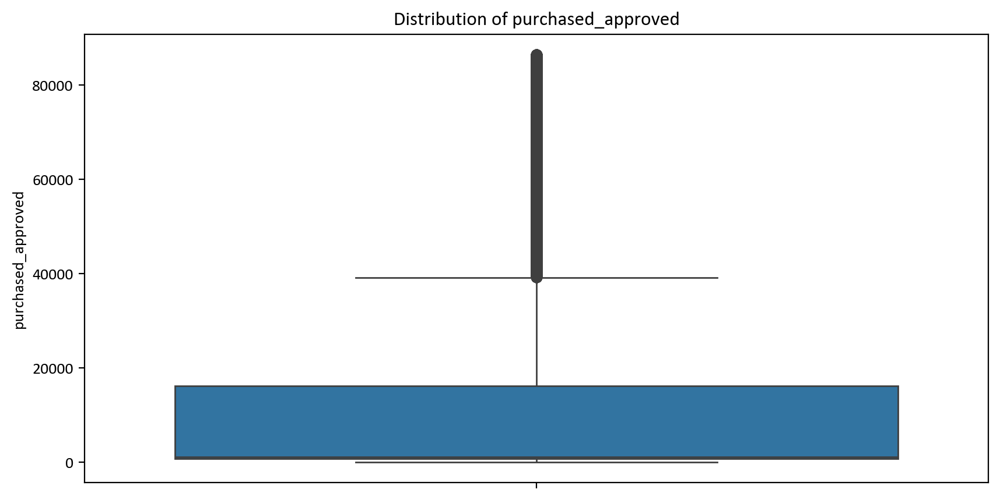

Skewness of delivered_estimated: -2.101764866389134
Standard deviation of delivered_estimated: 10.203242967048714


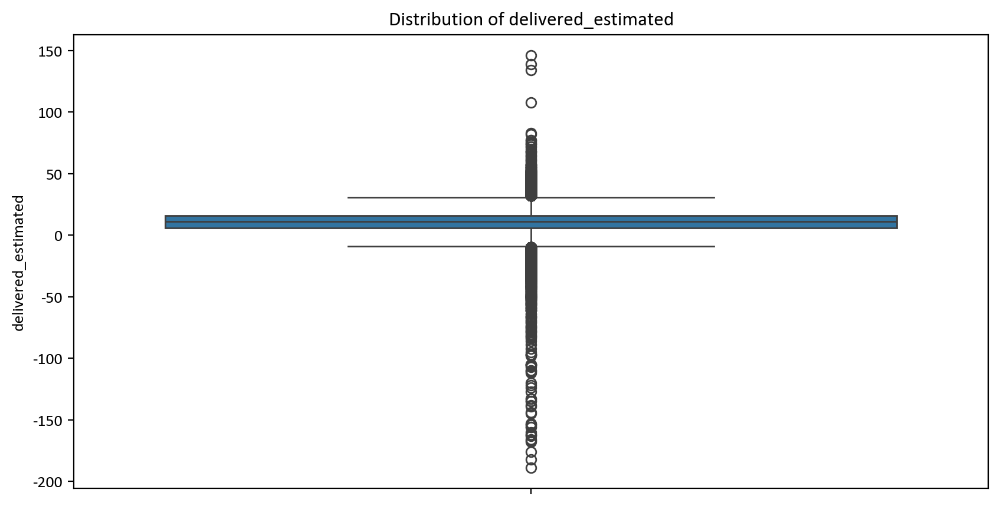

Skewness of purchased_delivered: 3.8851370289773977
Standard deviation of purchased_delivered: 9.568493285019958


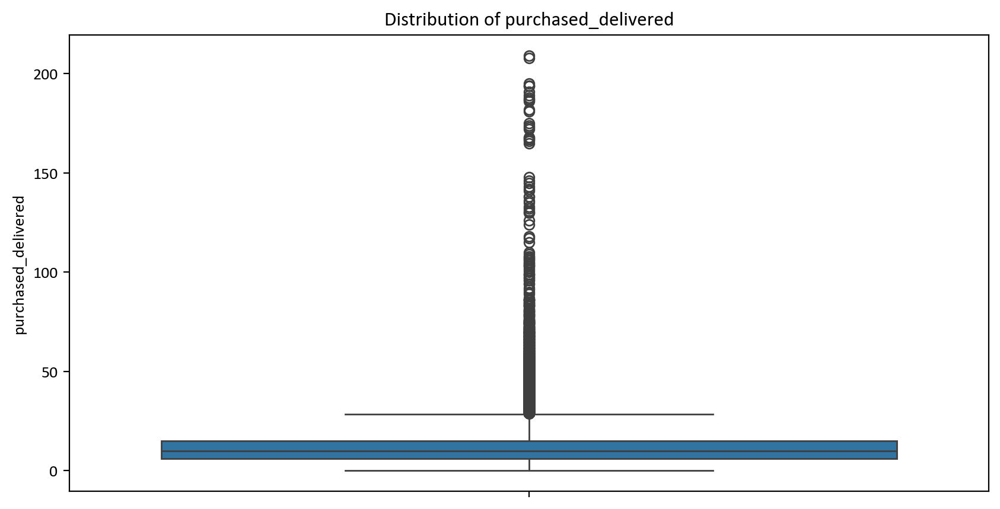

Skewness of no_of_products: 7.414378109080429
Standard deviation of no_of_products: 0.31373679944646404


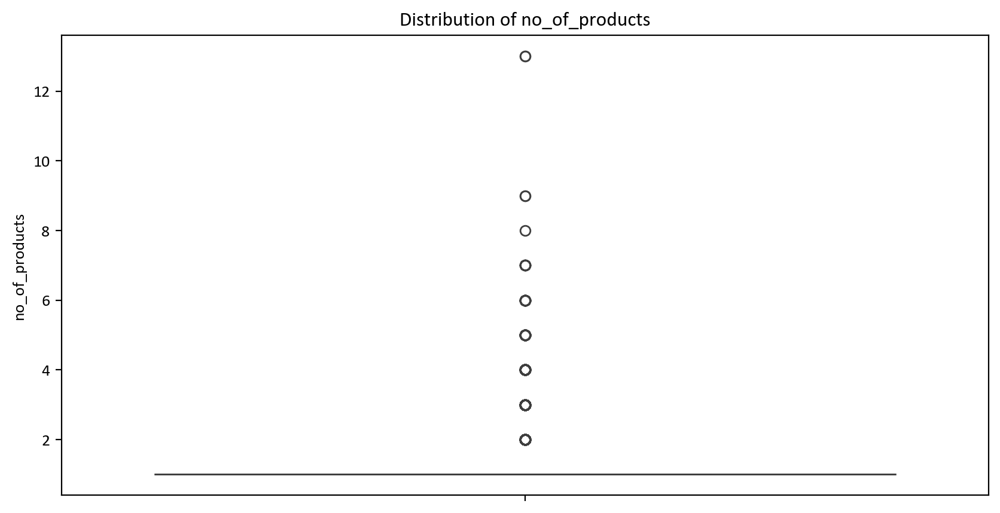

Skewness of price: 11.673286142641638
Standard deviation of price: 245.648186085988


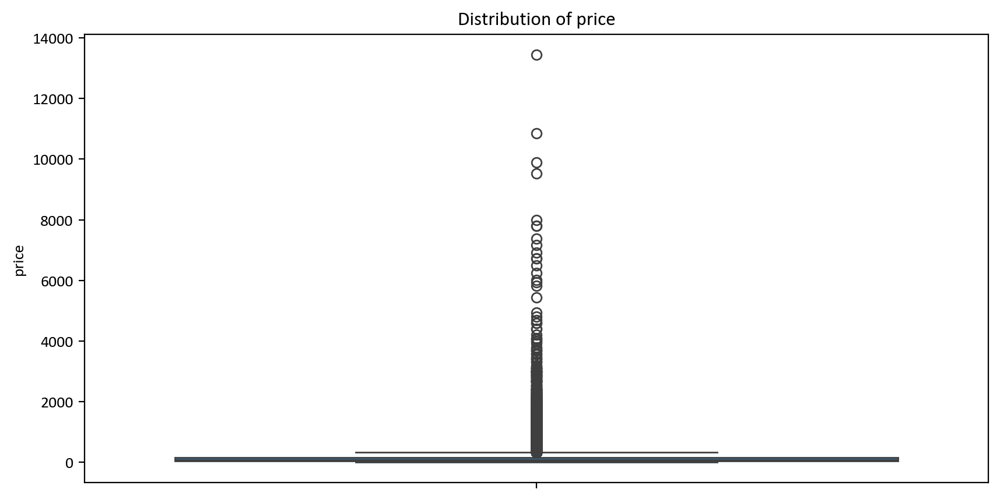

Skewness of freight_value: 13.404015071051449
Standard deviation of freight_value: 27.167210233851918


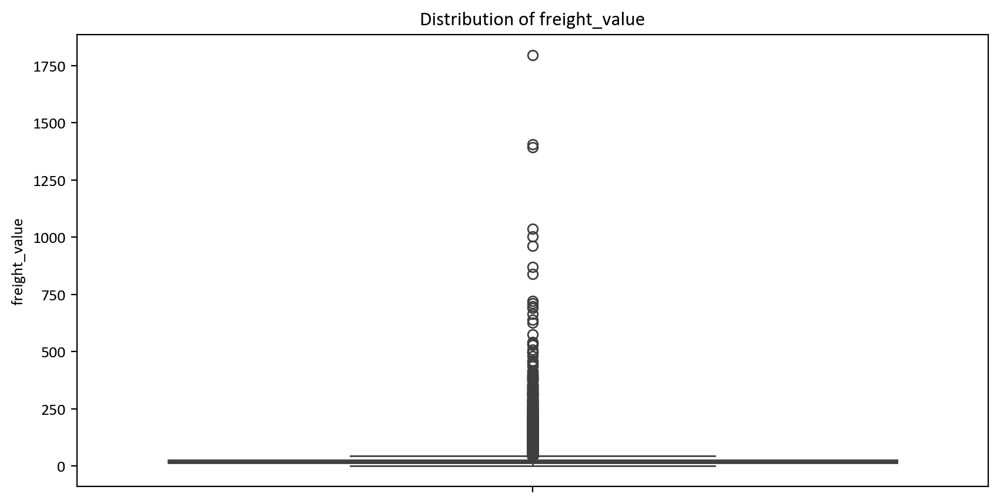

Skewness of product_weight_g: 12.103747627805273
Standard deviation of product_weight_g: 5870.34220607922


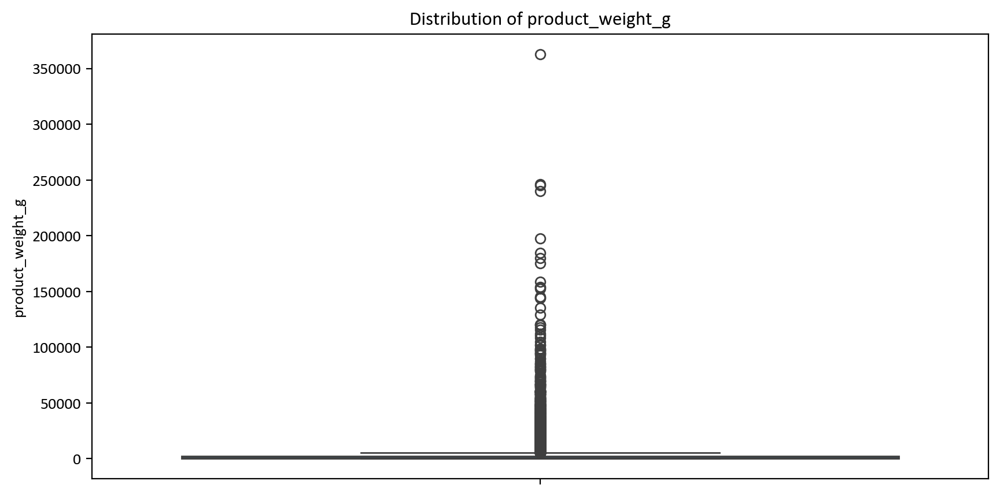

Skewness of product_length_cm: 15.455335601801671
Standard deviation of product_length_cm: 36.29532910933294


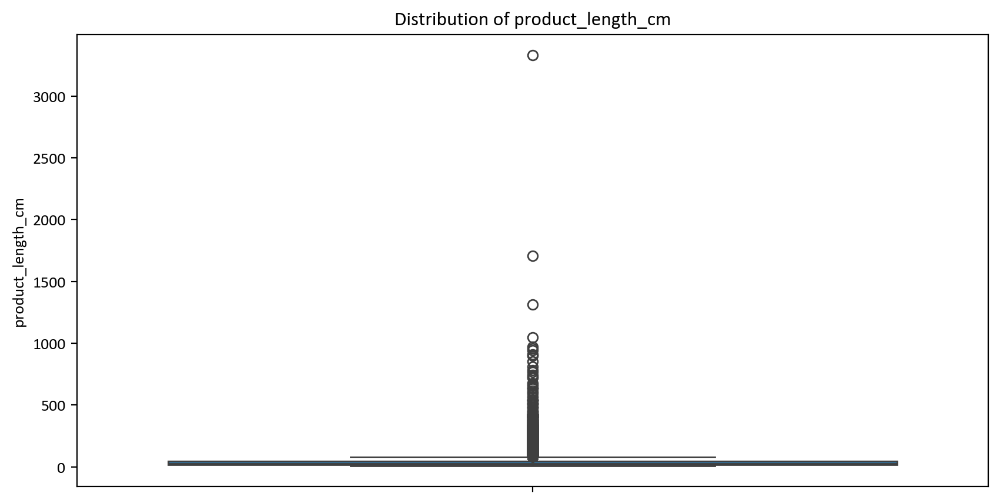

Skewness of product_height_cm: 14.319354023915139
Standard deviation of product_height_cm: 25.548808834973286


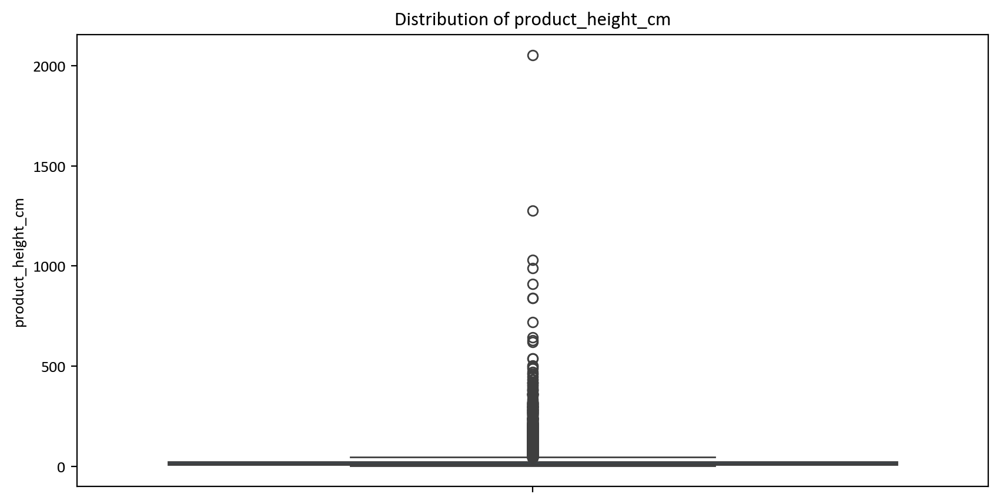

Skewness of product_width_cm: 15.990696995659524
Standard deviation of product_width_cm: 26.913001114896332


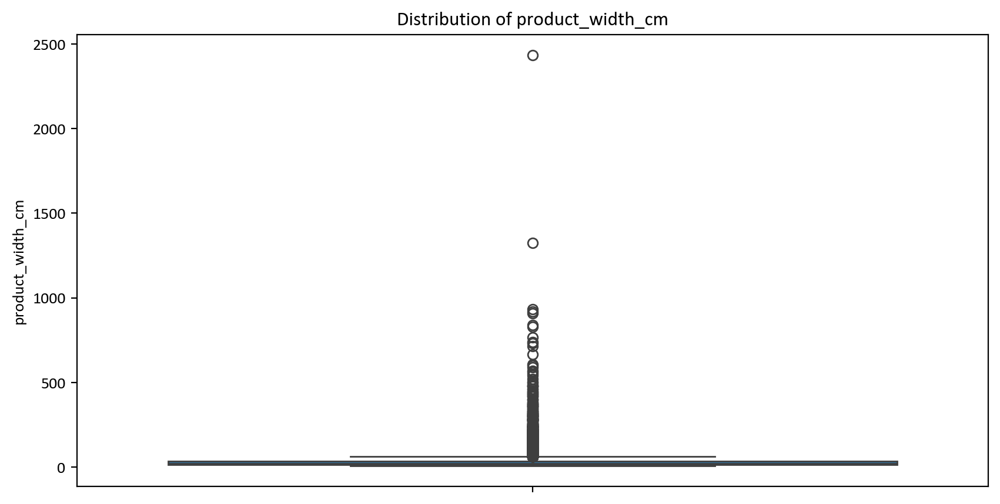

Skewness of geolocation_lat: 1.773152155669881
Standard deviation of geolocation_lat: 5.683911483397394


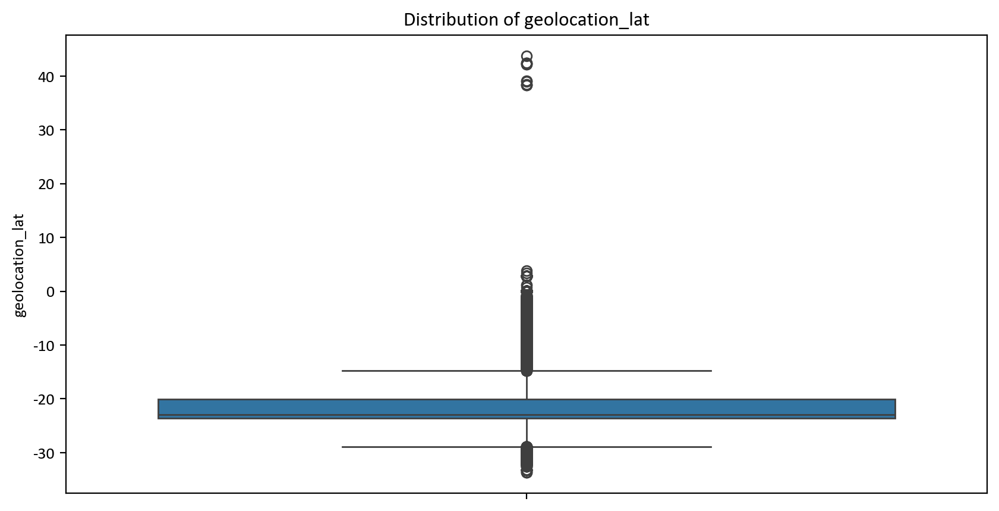

Skewness of geolocation_lng: 0.1892069766164438
Standard deviation of geolocation_lng: 4.09557910461328


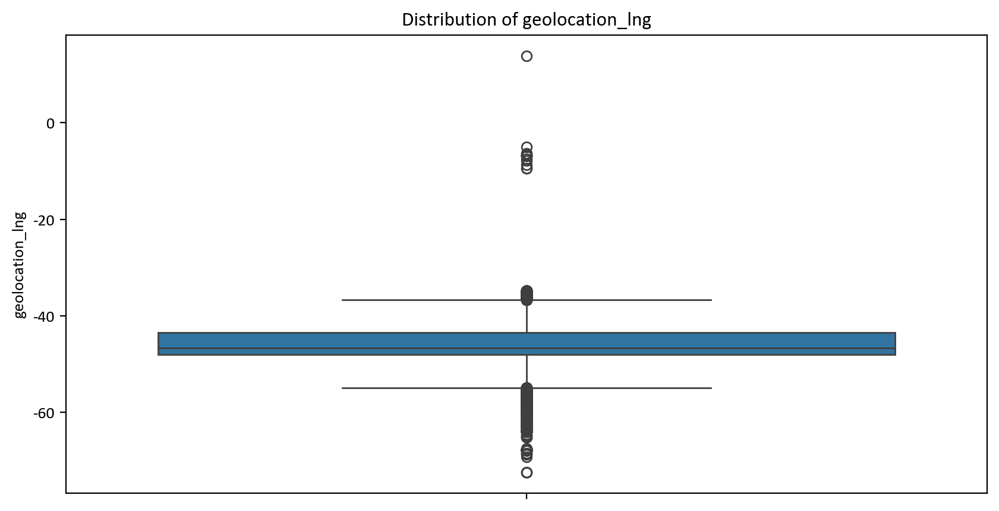

Skewness of payment_installments: 1.5985424567820286
Standard deviation of payment_installments: 2.728462973751188


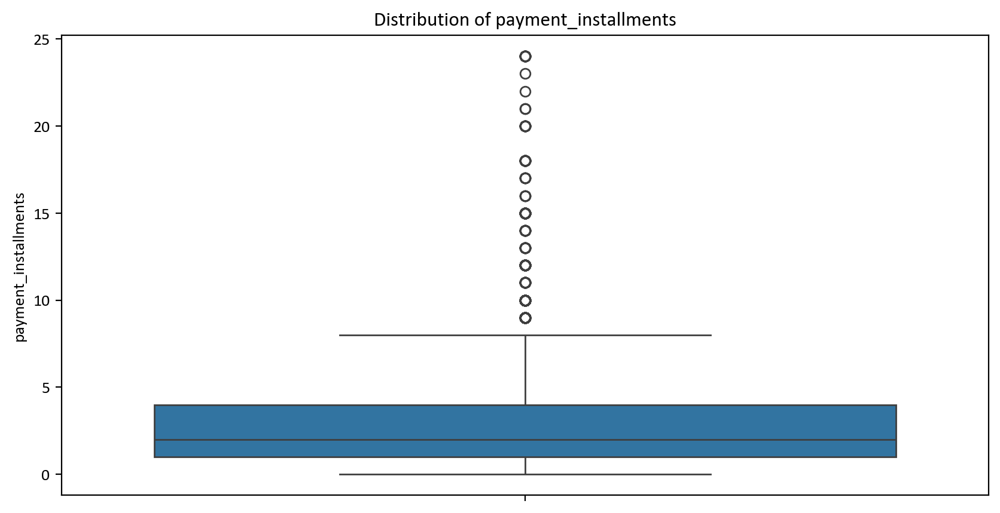

Skewness of payment_value: 69.45531310765217
Standard deviation of payment_value: 651.671327312369


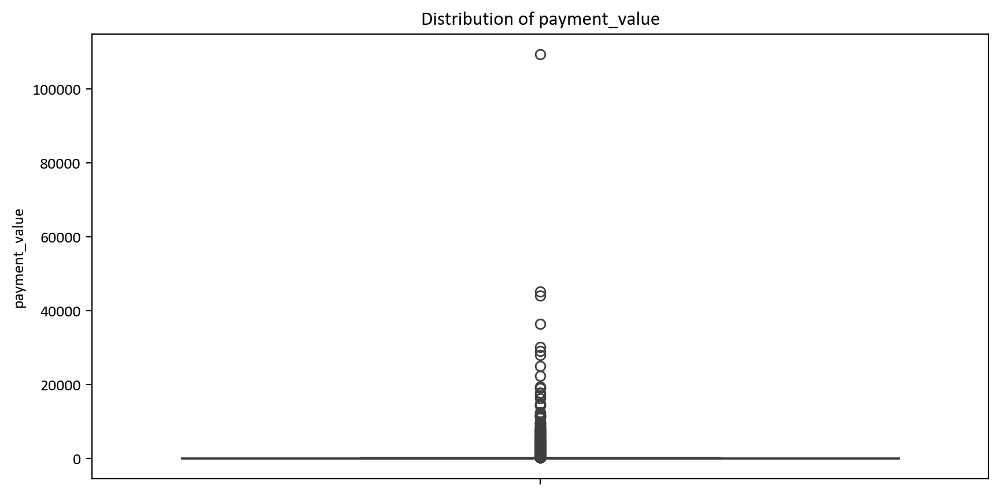

Skewness of review_score: -1.4753617649468038
Standard deviation of review_score: 1.2805415501520054


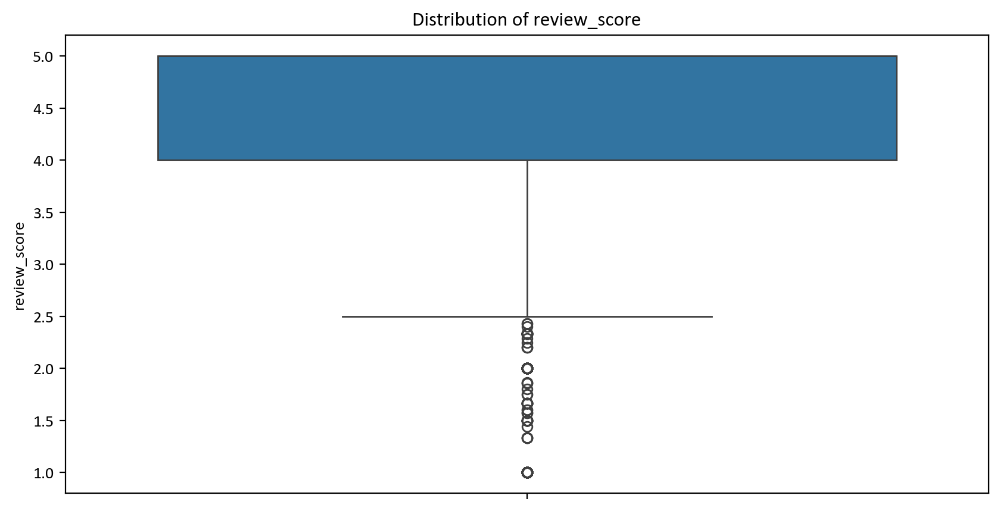

Skewness of Recency: 0.43585883202493925
Standard deviation of Recency: 152.38669351592222


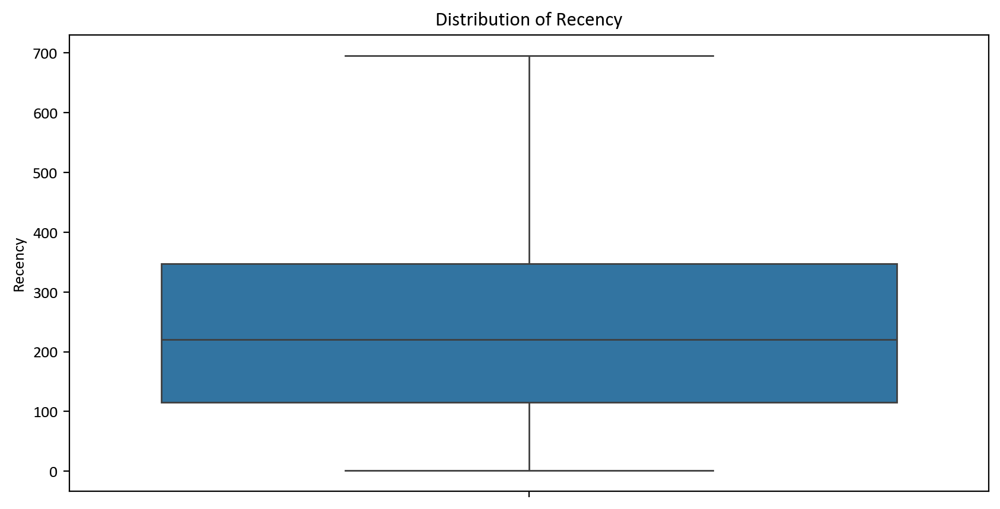

Skewness of Monetary: 69.45531310765217
Standard deviation of Monetary: 651.671327312369


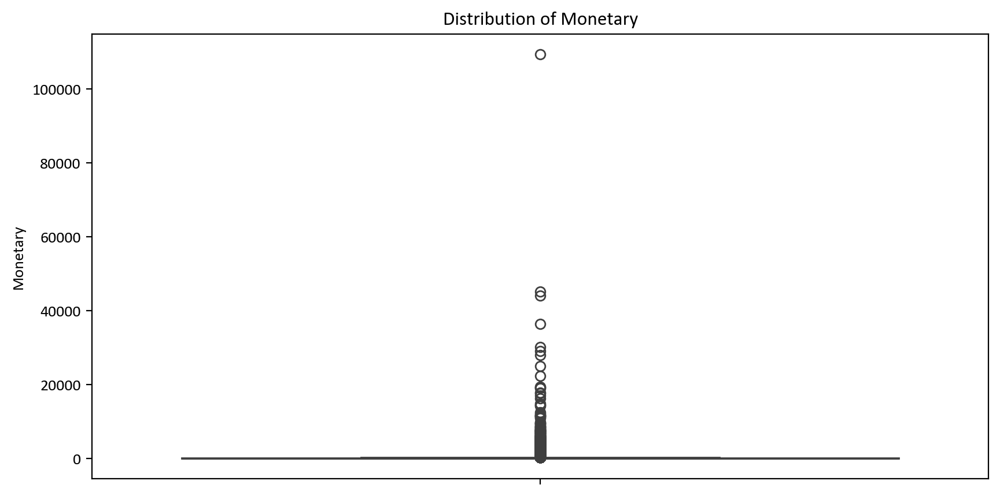

Skewness of Frequency: 10.676600298052568
Standard deviation of Frequency: 0.20649360862520988


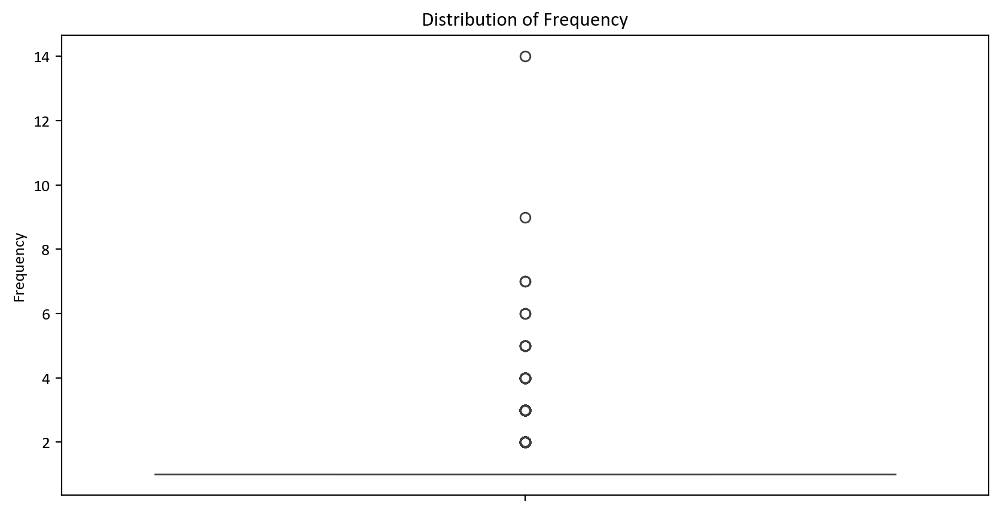

In [186]:
for col in final.select_dtypes(include = np.number).columns:
    plt.figure(figsize = (10, 5))
    print(f'Skewness of {col}: {final[col].skew()}')
    print(f'Standard deviation of {col}: {final[col].std()}')
    sns.boxplot(final[col])
    plt.title(f'Distribution of {col}')
    plt.show()

In [187]:
final.drop(columns = ['customer_zip_code_prefix', 'no_of_orders', 'no_of_products', 'Frequency'], axis = 1, inplace = True)

Kolom-kolom tersebut dihapus karena standar deviasinya hampir 0. Kolom tersebut tidak akan menambah banyak insight terhadap model.

In [188]:
final_outlierTreated = final.copy()

In [189]:
for i in final_outlierTreated.select_dtypes(include = np.number).columns:
    q1 = final_outlierTreated[i].quantile(0.25)
    q3 = final_outlierTreated[i].quantile(0.75)
    iqr = q3 - q1
    ul = q3 + 1.5*iqr
    ll = q1 - 1.5*iqr
    final_outlierTreated[i] = np.where(final_outlierTreated[i]>ul,ul,final_outlierTreated[i])
    final_outlierTreated[i] = np.where(final_outlierTreated[i]<ll,ll,final_outlierTreated[i])

Skewness of purchased_approved: 1.2164391823519571
Standard deviation of purchased_approved: 15172.694355588796


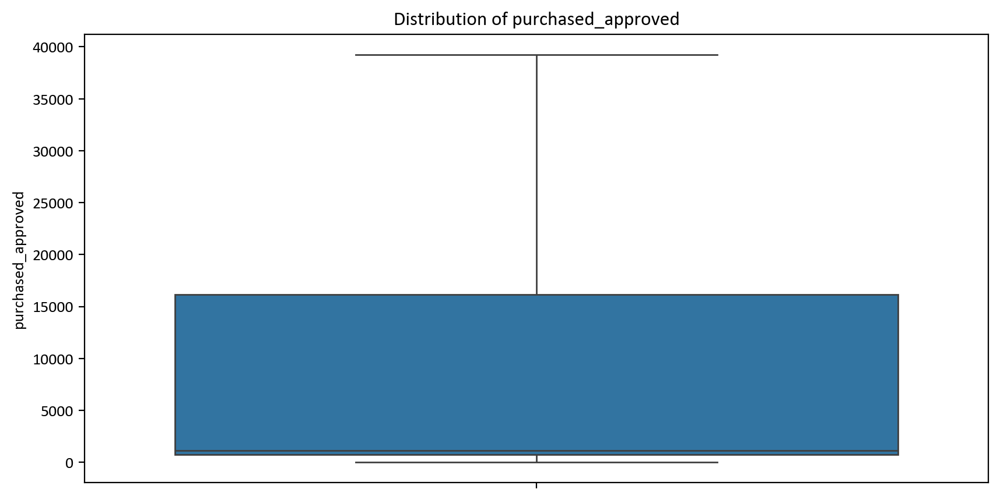

Skewness of delivered_estimated: -0.09874592372345704
Standard deviation of delivered_estimated: 8.274096249346677


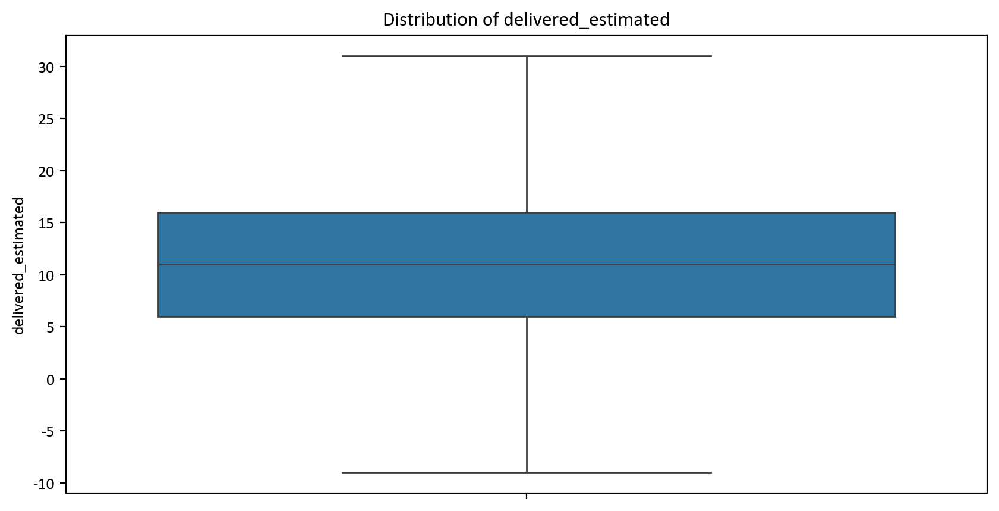

Skewness of purchased_delivered: 0.8756235891449513
Standard deviation of purchased_delivered: 7.115413212826002


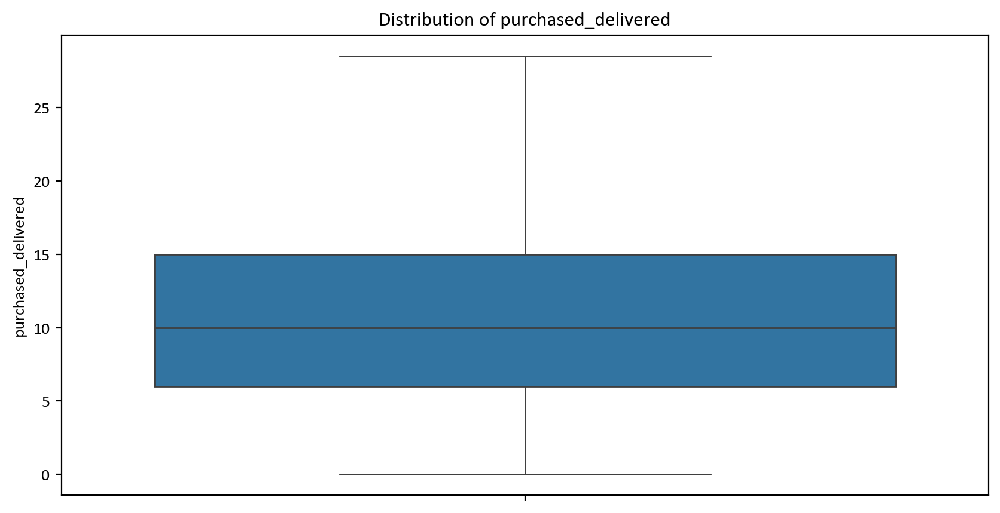

Skewness of price: 1.0575440832229996
Standard deviation of price: 92.37410737993144


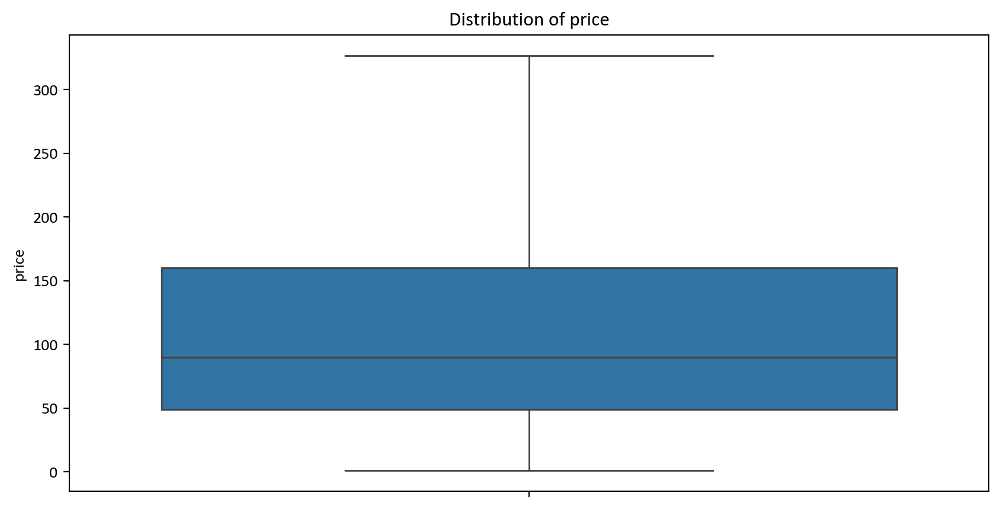

Skewness of freight_value: 0.9876807384042335
Standard deviation of freight_value: 11.171536270494622


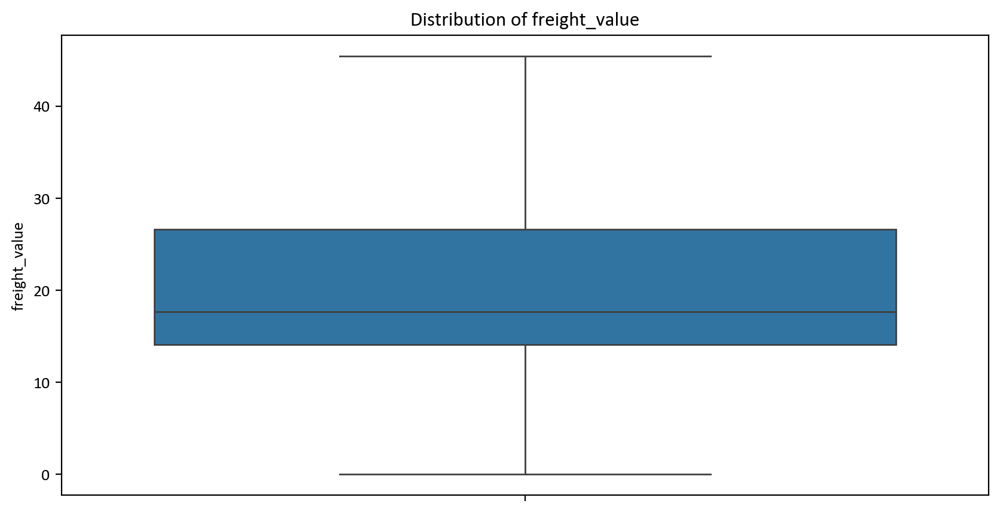

Skewness of product_weight_g: 1.1879390847711517
Standard deviation of product_weight_g: 1781.0525535942934


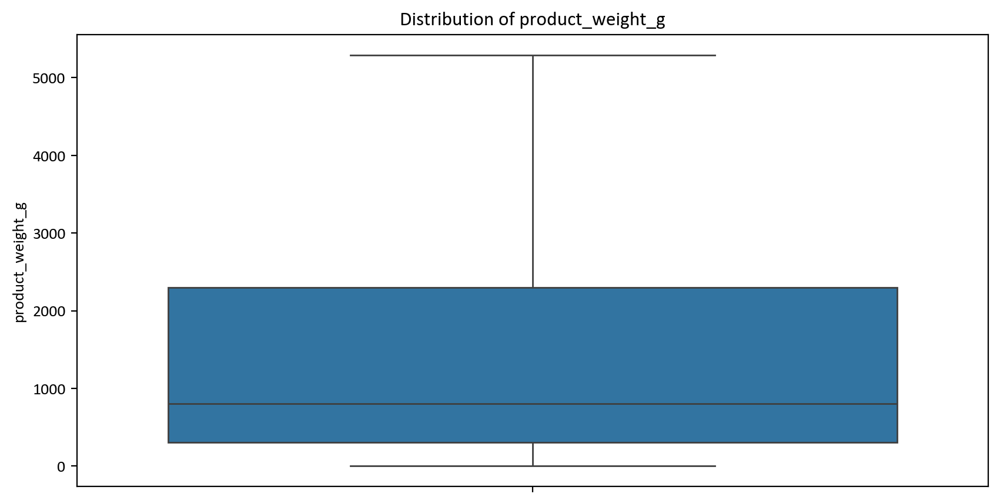

Skewness of product_length_cm: 1.1430465457339416
Standard deviation of product_length_cm: 19.238935199326814


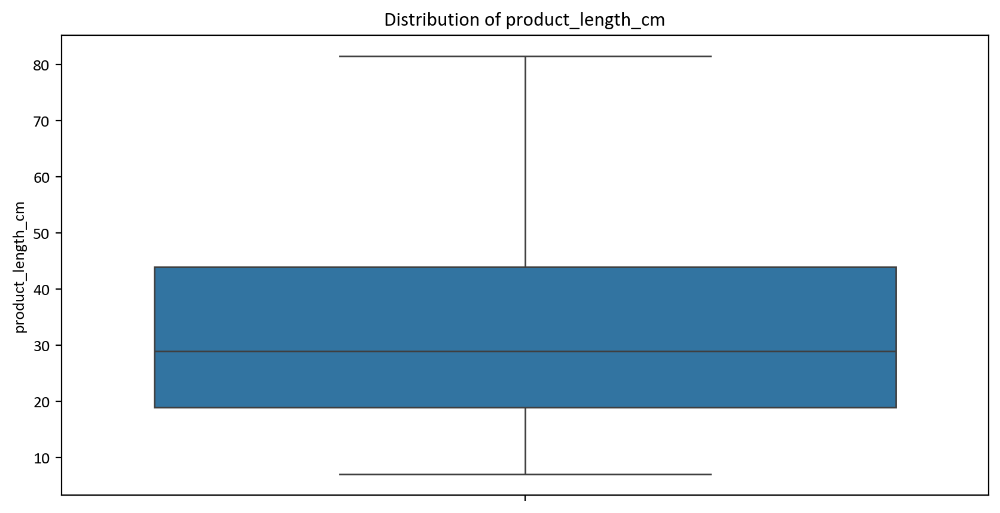

Skewness of product_height_cm: 0.97901647343929
Standard deviation of product_height_cm: 12.659453216679367


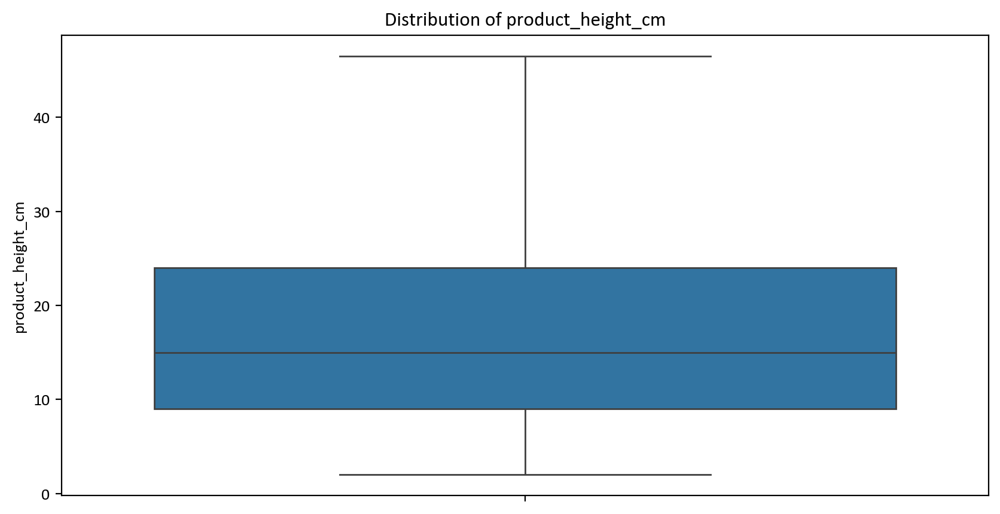

Skewness of product_width_cm: 1.122604493778157
Standard deviation of product_width_cm: 14.514932303921142


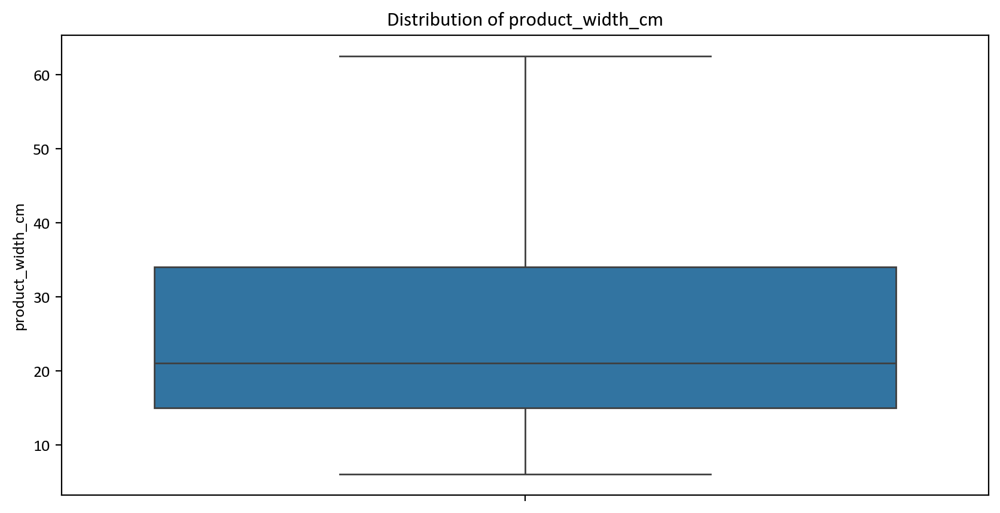

Skewness of geolocation_lat: 0.5304176530164698
Standard deviation of geolocation_lat: 3.67046321972773


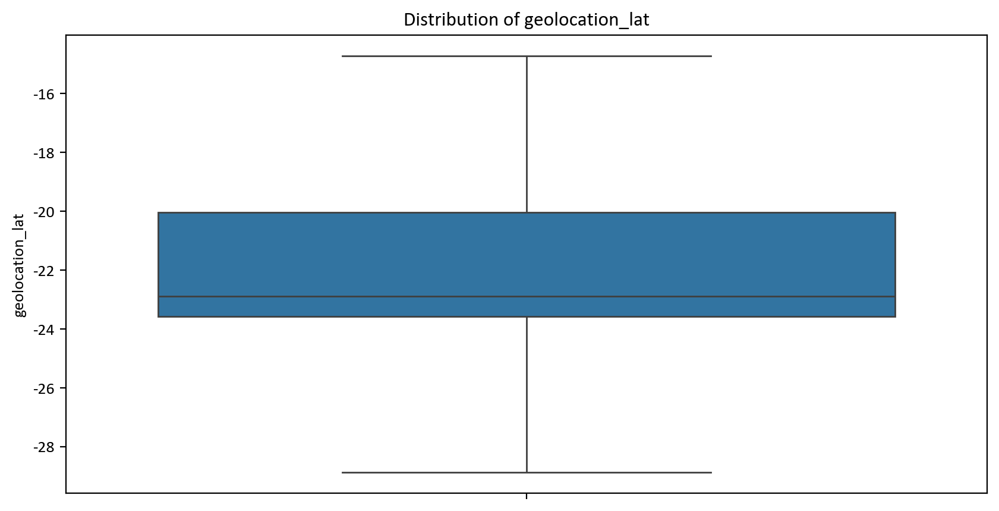

Skewness of geolocation_lng: 0.27977758204145975
Standard deviation of geolocation_lng: 3.801224553495541


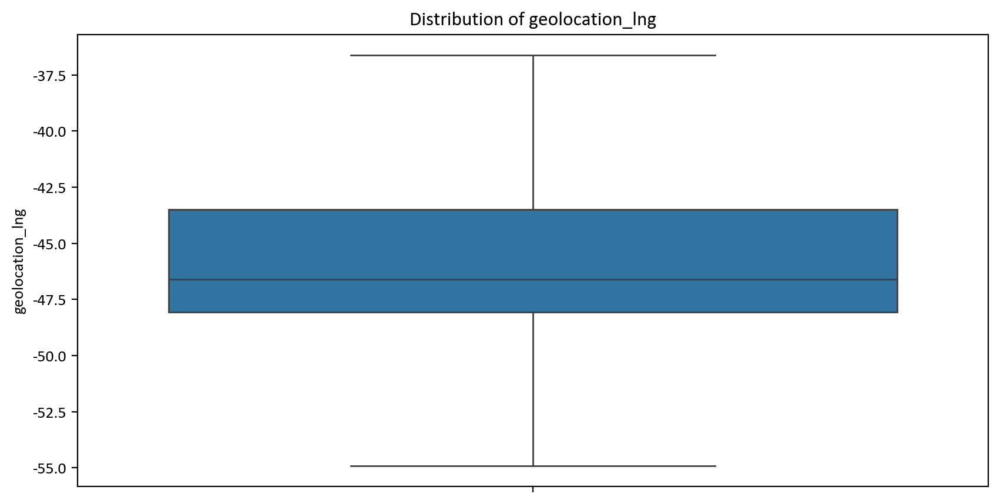

Skewness of payment_installments: 1.2118688690198518
Standard deviation of payment_installments: 2.4396707220778495


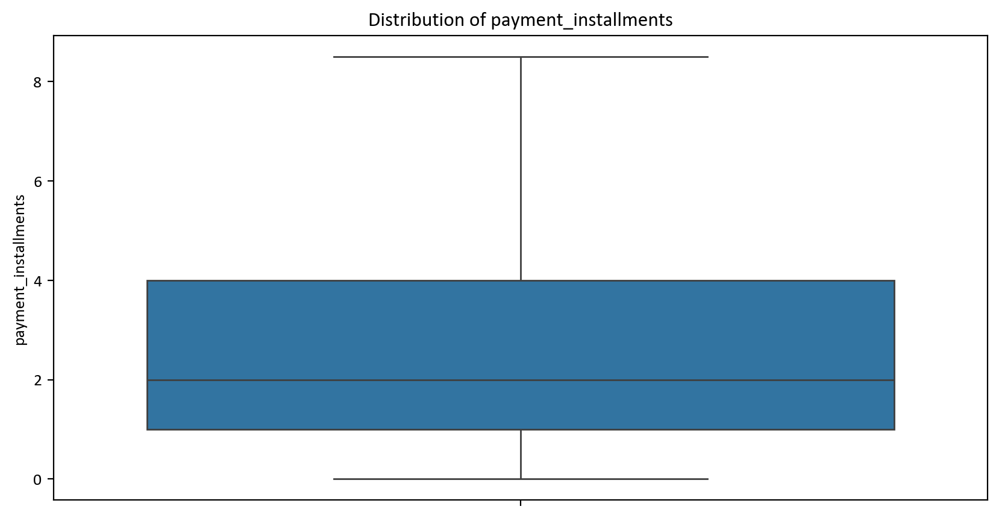

Skewness of payment_value: 1.0955798184308276
Standard deviation of payment_value: 117.7993255451284


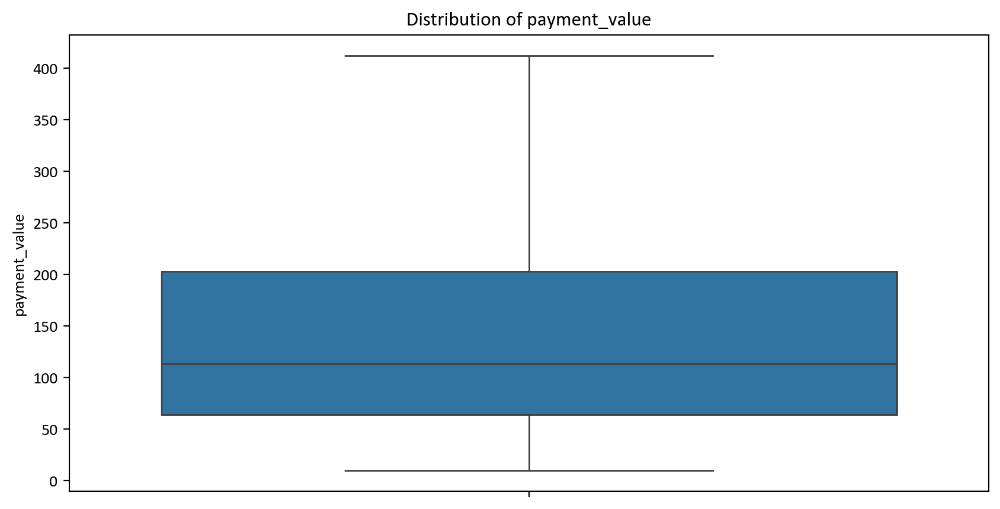

Skewness of review_score: -0.9578616204856851
Standard deviation of review_score: 0.928450874289621


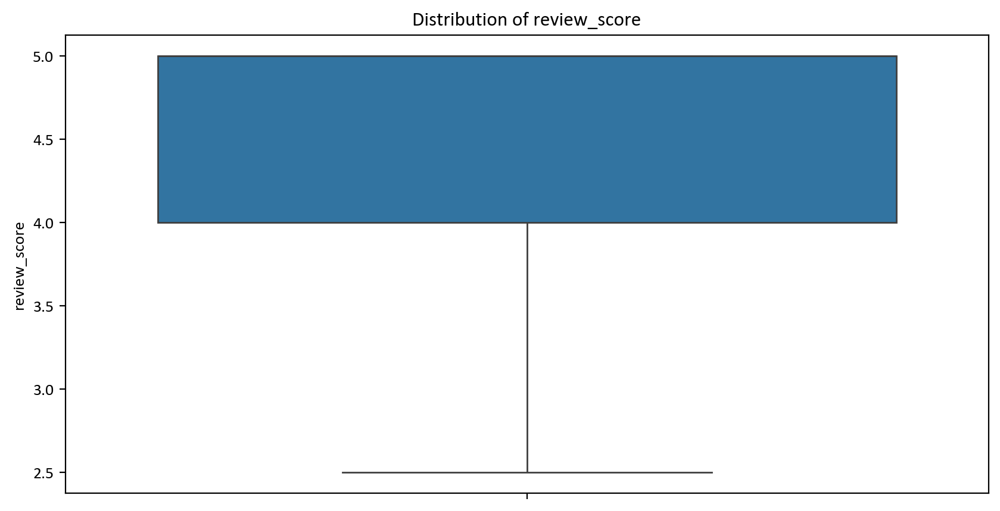

Skewness of Recency: 0.43585883202493925
Standard deviation of Recency: 152.38669351592222


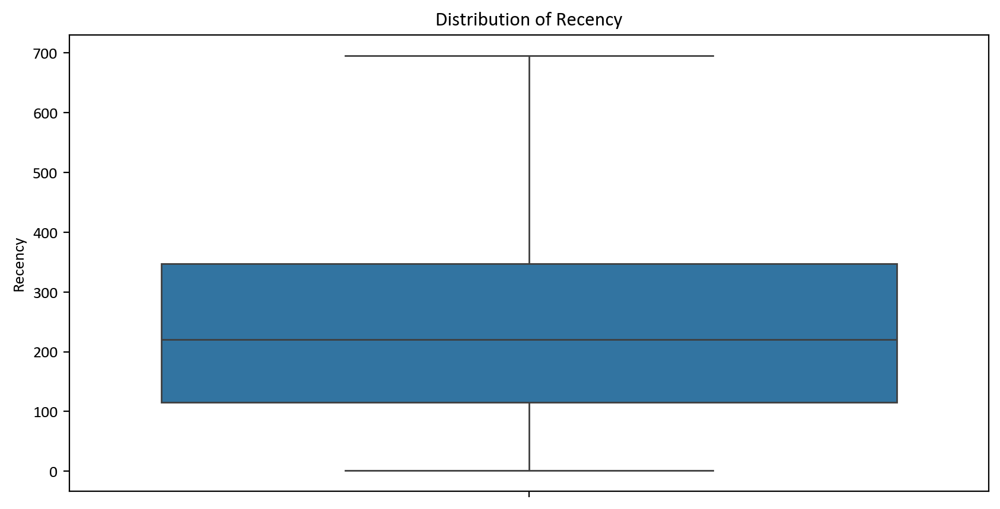

Skewness of Monetary: 1.0955798184308276
Standard deviation of Monetary: 117.7993255451284


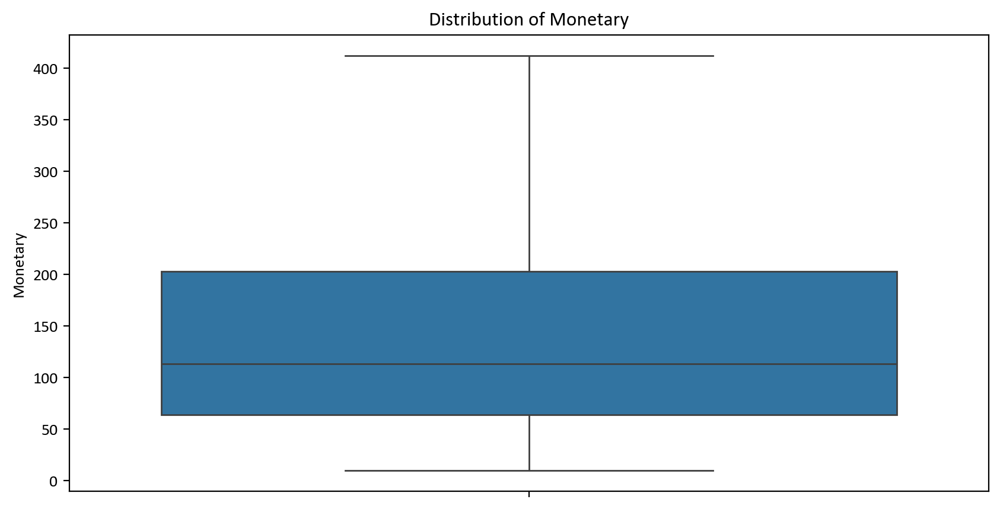

In [190]:
for col in final_outlierTreated.select_dtypes(include = np.number).columns:
    plt.figure(figsize = (10, 5))
    print(f'Skewness of {col}: {final_outlierTreated[col].skew()}')
    print(f'Standard deviation of {col}: {final_outlierTreated[col].std()}')
    sns.boxplot(final_outlierTreated[col])
    plt.title(f'Distribution of {col}')
    plt.show()

In [191]:
final_outlierTreated.shape

(90528, 21)

### Handling Missing Values

In [192]:
final_outlierTreated.isna().sum() / len(final) * 100

customer_unique_id      0.000000
customer_city           0.000000
customer_state          0.000000
purchased_approved      0.000000
delivered_estimated     0.000000
purchased_delivered     0.000000
price                   0.000000
freight_value           0.000000
product_weight_g        0.000000
product_length_cm       0.000000
product_height_cm       0.000000
product_width_cm        0.000000
geolocation_lat         0.000000
geolocation_lng         0.000000
payment_type            0.000000
payment_installments    0.000000
payment_value           0.000000
review_score            0.650627
Recency                 0.000000
Monetary                0.000000
Churn                   0.000000
dtype: float64

array([[<Axes: title={'center': 'review_score'}>]], dtype=object)

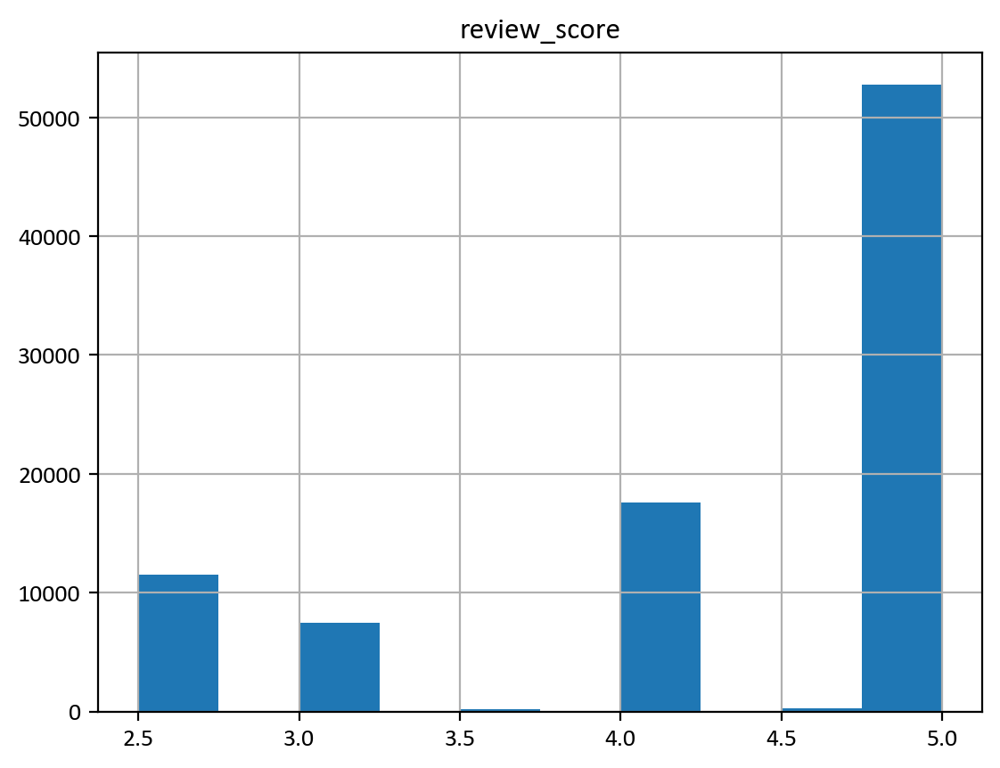

In [193]:
final_outlierTreated.hist(column='review_score')

array([[<Axes: title={'center': 'review_score'}>]], dtype=object)

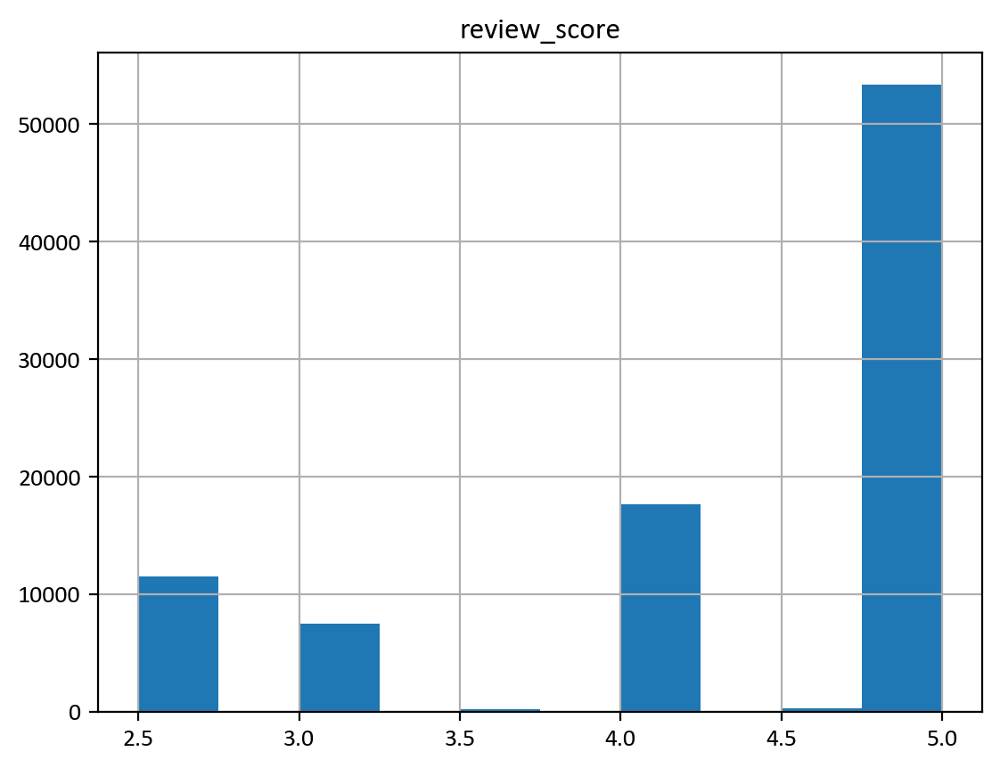

In [194]:
final_outlierTreated['review_score'].fillna(final_outlierTreated['review_score'].median(), inplace=True)
final_outlierTreated.hist(column='review_score')

In [195]:
final_outlierTreated.isna().sum() / len(final) * 100

customer_unique_id      0.0
customer_city           0.0
customer_state          0.0
purchased_approved      0.0
delivered_estimated     0.0
purchased_delivered     0.0
price                   0.0
freight_value           0.0
product_weight_g        0.0
product_length_cm       0.0
product_height_cm       0.0
product_width_cm        0.0
geolocation_lat         0.0
geolocation_lng         0.0
payment_type            0.0
payment_installments    0.0
payment_value           0.0
review_score            0.0
Recency                 0.0
Monetary                0.0
Churn                   0.0
dtype: float64

Missing value pada `review_score` diisi dengan median dari nilai review karena data yang skewed. Distribusi kolom tidak berubah setelah nilai kosong diisi dengan median.

## Correlation Analysis

In [196]:
final_outlierTreated.Churn.value_counts(normalize = True) * 100

Churn
0    54.591949
1    45.408051
Name: proportion, dtype: float64

In [197]:
final_outlierTreated2 = final_outlierTreated.select_dtypes(include = np.number)
final_outlierTreated2

,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_installments,payment_value,review_score,Recency,Monetary
0,891.000,4.0,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,8.0,141.90000,5.0,111.0,141.90000
1,26057.000,4.0,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,1.0,27.19000,4.0,114.0,27.19000
2,0.000,1.0,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-27.532246,-48.618667,8.0,86.22000,3.0,537.0,86.22000
3,1176.000,11.0,20.0,25.99,17.63,150.0,19.0,5.0,11.0,-14.737871,-48.476339,4.0,43.62000,4.0,321.0,43.62000
4,1270.000,7.0,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-23.496567,-47.462811,6.0,196.89000,5.0,288.0,196.89000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90523,880.000,26.0,27.0,326.40,45.40,5288.0,81.5,46.5,62.5,-14.737871,-36.625202,8.5,411.94375,5.0,447.0,411.94375
90524,504.000,2.0,28.5,64.89,19.69,1720.0,33.0,36.0,27.0,-14.737871,-38.952416,1.0,84.58000,4.0,262.0,84.58000
90525,808.000,29.0,14.0,89.90,22.56,600.0,17.0,15.0,13.0,-14.737871,-54.921403,1.0,112.46000,5.0,568.0,112.46000
90526,2466.000,13.0,11.0,115.00,18.69,444.0,20.0,14.0,16.0,-21.120385,-41.665221,5.0,133.69000,5.0,119.0,133.69000


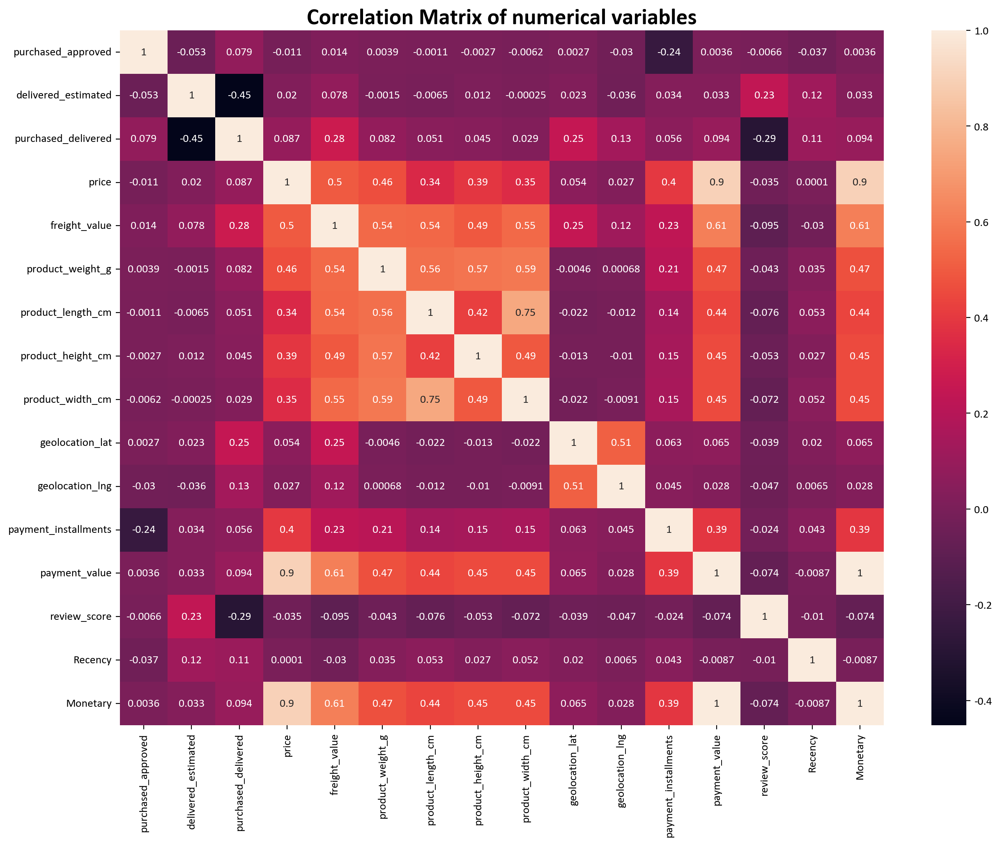

In [198]:
plt.figure(figsize=(15,11))
sns.heatmap(final_outlierTreated2.corr(), annot = True)
plt.title('Correlation Matrix of numerical variables',fontsize=20,fontweight='bold')
plt.show()

Terdapat korelasi cukup tinggi antara hargga dengan payment value dan Monetary. Ini masuk akal karena monetary value diperhtigungkan dari jummlah uang yang dikeluarkan oleh pengguna. Price dan payment value juga masuk akal jika berkorelasi tinggi karena jumlah yang dibayarkan akan senilai dengan harga barang yang dibeli.

In [199]:
def cat_cat(variable):
    dependent_variables = []
    independent_variables = []
    for var in variable:
        print(f'{var} and Churn')
        observed = pd.crosstab(final_outlierTreated[var], final_outlierTreated.Churn)
        chi_stats, pval, dof, expected = stats.chi2_contingency(observed)
        print('test statistics: ', chi_stats)
        print('p - value: ', pval)
        print('degrees of freedom: ', dof)
        if pval < 0.05:
            print(f'Reject Null Hypothesis. \nThe variables {var} and target variable, Churn are dependent.\n')
            dependent_variables.append(var)
        else:
            print(f'Failed to reject Null Hypothesis. \nThe variables {var} and target variable, Churn are independent.\n')
            independent_variables.append(var)
    print('Dependent variables: ', dependent_variables)
    print('Independent variables: ', independent_variables)
        
variable = ['customer_state', 'payment_type', 'payment_installments', 'customer_city']
cat_cat(variable)

customer_state and Churn
test statistics:  353.9562373606318
p - value:  2.9132771252108942e-59
degrees of freedom:  26
Reject Null Hypothesis. 
The variables customer_state and target variable, Churn are dependent.

payment_type and Churn
test statistics:  266.16944819672017
p - value:  2.0805608001059732e-57
degrees of freedom:  3
Reject Null Hypothesis. 
The variables payment_type and target variable, Churn are dependent.

payment_installments and Churn
test statistics:  489.01783336833216
p - value:  1.2904748666154383e-99
degrees of freedom:  9
Reject Null Hypothesis. 
The variables payment_installments and target variable, Churn are dependent.

customer_city and Churn
test statistics:  4523.939055252141
p - value:  1.825636599597893e-08
degrees of freedom:  4011
Reject Null Hypothesis. 
The variables customer_city and target variable, Churn are dependent.

Dependent variables:  ['customer_state', 'payment_type', 'payment_installments', 'customer_city']
Independent variables:  []


In [200]:
def num_cat(variable):
    correlated_variables = []
    noncorrelated_variables = []
    for var in variable:
        print(f'{var} Vs. target variable, Churn')
        churn = final[final.Churn == 1][var]
        not_churn = final[final.Churn == 0][var]
        test_stats, churn_pval = stats.shapiro(churn)
        test_stats, notchurn_pval = stats.shapiro(not_churn)
        if churn_pval < 0.05:
            print(f'churn of {var} is not normal')
        else: 
            print(f'churn of {var} is normal')
        if notchurn_pval < 0.05:
            print(f'not churn of {var} is not normal')
        else: 
            print(f'not churn of {var} is normal')
        levene_teststats, pval_levene = stats.levene(churn, not_churn)
        if pval_levene < 0.05:
            print(f'atleast one variance is not equal')
        else: 
            print(f'all variances are equal')
        anova_teststats, pval_anova = stats.f_oneway(churn, not_churn)
        if pval_anova < 0.05:
            print(f'Reject Null Hypothesis. \nThe variables {var} and target variable, Churn are correlated with each other.\n')
            correlated_variables.append(var)
        else:
            print(f'Failed to reject Null Hypothesis. \nThe variables {var} and target variable, Churn are not correlated with each other.\n')
            noncorrelated_variables.append(var)
            
    print('Correlated variables: ', correlated_variables)
    print('Non-correlated variables: ', noncorrelated_variables)

            
variable = ['purchased_approved', 'delivered_estimated', 'purchased_delivered', 'price', 'freight_value', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'geolocation_lat', 'geolocation_lng', 'Recency', 'Monetary']
num_cat(variable)

purchased_approved Vs. target variable, Churn
churn of purchased_approved is not normal
not churn of purchased_approved is not normal
atleast one variance is not equal
Reject Null Hypothesis. 
The variables purchased_approved and target variable, Churn are correlated with each other.

delivered_estimated Vs. target variable, Churn
churn of delivered_estimated is not normal
not churn of delivered_estimated is not normal
atleast one variance is not equal
Reject Null Hypothesis. 
The variables delivered_estimated and target variable, Churn are correlated with each other.

purchased_delivered Vs. target variable, Churn
churn of purchased_delivered is not normal
not churn of purchased_delivered is not normal
atleast one variance is not equal
Reject Null Hypothesis. 
The variables purchased_delivered and target variable, Churn are correlated with each other.

price Vs. target variable, Churn
churn of price is not normal
not churn of price is not normal
all variances are equal
Failed to rejec

In [201]:
def non_parametric_tests(variable):
    correlated_variables = []
    noncorrelated_variables = []
    for var in variable:
        test_stats, pval = stats.mannwhitneyu(final_outlierTreated[final_outlierTreated.Churn == 1][var], final_outlierTreated[final_outlierTreated.Churn == 0][var])
        if pval < 0.05:
            print(f'Reject Null Hypothesis. \nThe variables {var} and target variable, Churn are correlated with each other.\n')
            correlated_variables.append(var)
        else:
            print(f'Failed to reject Null Hypothesis. \nThe variables {var} and target variable, Churn are not correlated with each other.\n')
            noncorrelated_variables.append(var)
    print(f'Correlated variables: ', correlated_variables)
    print(f'Non correlated variables: ', noncorrelated_variables)
        
variable = ['purchased_approved', 'delivered_estimated', 'purchased_delivered', 'price', 'freight_value', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'geolocation_lat', 'geolocation_lng', 'Recency', 'Monetary']
non_parametric_tests(variable)

Reject Null Hypothesis. 
The variables purchased_approved and target variable, Churn are correlated with each other.

Reject Null Hypothesis. 
The variables delivered_estimated and target variable, Churn are correlated with each other.

Reject Null Hypothesis. 
The variables purchased_delivered and target variable, Churn are correlated with each other.

Failed to reject Null Hypothesis. 
The variables price and target variable, Churn are not correlated with each other.

Reject Null Hypothesis. 
The variables freight_value and target variable, Churn are correlated with each other.

Reject Null Hypothesis. 
The variables product_weight_g and target variable, Churn are correlated with each other.

Reject Null Hypothesis. 
The variables product_length_cm and target variable, Churn are correlated with each other.

Reject Null Hypothesis. 
The variables product_height_cm and target variable, Churn are correlated with each other.

Reject Null Hypothesis. 
The variables product_width_cm and ta

## Data Transformation

In [202]:
transformed_data = final_outlierTreated.copy()
transformed_data['Churn'] = transformed_data['Churn'].astype('object')

In [203]:
final_outlierTreated2 = final_outlierTreated.select_dtypes(include = np.number)
final_outlierTreated2
transformed_data = final_outlierTreated2

In [204]:
transformed_data.skew()

purchased_approved      1.216439
delivered_estimated    -0.098746
purchased_delivered     0.875624
price                   1.057544
freight_value           0.987681
product_weight_g        1.187939
product_length_cm       1.143047
product_height_cm       0.979016
product_width_cm        1.122604
geolocation_lat         0.530418
geolocation_lng         0.279778
payment_installments    1.211869
payment_value           1.095580
review_score           -0.967694
Recency                 0.435859
Monetary                1.095580
dtype: float64

In [205]:
transformed_data.describe()

,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_installments,payment_value,review_score,Recency,Monetary
count,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000
mean,10218.379244,10.918180,11.544891,118.326475,21.445156,1635.126580,34.429966,18.084836,26.467855,-21.859878,-46.111407,2.837614,153.228395,4.316832,238.733773,153.228395
std,15172.694356,8.274096,7.115413,92.374107,11.171536,1781.052554,19.238935,12.659453,14.514932,3.670463,3.801225,2.439671,117.799326,0.927075,152.386694,117.799326
min,0.000000,-9.000000,0.000000,0.850000,0.000000,0.000000,7.000000,2.000000,6.000000,-28.882827,-54.921403,0.000000,9.590000,2.500000,1.000000,9.590000
25%,756.000000,6.000000,6.000000,48.900000,14.100000,308.000000,19.000000,9.000000,15.000000,-23.578469,-48.060327,1.000000,63.837500,4.000000,115.000000,63.837500
50%,1164.000000,11.000000,10.000000,89.900000,17.690000,800.000000,29.000000,15.000000,21.000000,-22.898404,-46.614879,2.000000,112.990000,5.000000,220.000000,112.990000
75%,16142.250000,16.000000,15.000000,159.900000,26.620000,2300.000000,44.000000,24.000000,34.000000,-20.042230,-43.486277,4.000000,203.080000,5.000000,347.000000,203.080000
max,39221.625000,31.000000,28.500000,326.400000,45.400000,5288.000000,81.500000,46.500000,62.500000,-14.737871,-36.625202,8.500000,411.943750,5.000000,695.000000,411.943750


In [206]:
pt = PowerTransformer(method = 'yeo-johnson')
for var in transformed_data:
    if var in ['delivered_estimated','geolocation_lat','geolocation_lng']:
        transformed_data[var] = pt.fit_transform(transformed_data[[var]])

In [207]:
pt = PowerTransformer(method='box-cox')
for var in transformed_data.select_dtypes(include=np.number):
    if var not in ['delivered_estimated','geolocation_lat','geolocation_lng']:
        transformed_data[var] = pt.fit_transform(0.001 + transformed_data[[var]])

In [208]:
transformed_data.skew()

purchased_approved      0.136319
delivered_estimated     0.102573
purchased_delivered    -0.025029
price                  -0.030111
freight_value           0.178659
product_weight_g       -0.004058
product_length_cm       0.104632
product_height_cm      -0.034177
product_width_cm        0.070570
geolocation_lat         0.032696
geolocation_lng        -0.013325
payment_installments   -0.367193
payment_value          -0.000057
review_score           -0.593679
Recency                -0.161802
Monetary               -0.000057
dtype: float64

- Variabel yang memiliki nilai negatif ditransformasikan menggunakan metode yeo-johnson, karena log dari 0 atau nilai negatif akan mengembalikan nilai tak terbatas.
- 
Variabel yang hanya memiliki nilai positif ditransformasikan menggunakan metode box-cox.

In [209]:
transformed_data.head()

,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_installments,payment_value,review_score,Recency,Monetary
0,-0.579566,-0.866609,-0.725364,0.449538,-0.869246,0.458053,0.375867,-0.914419,0.708826,-0.339009,-0.147663,1.594216,0.275628,0.800507,-0.750358,0.275628
1,1.299468,-0.866609,-1.516351,-1.663443,-1.408656,-0.679216,-0.167493,-0.385022,-0.428987,-0.403676,-0.136448,-0.934791,-1.840645,-0.716220,-0.724705,-1.840645
2,-3.569348,-1.214404,1.609763,-0.310021,-0.260413,0.458053,-0.253461,1.745436,0.864077,-1.742476,-0.641800,1.594216,-0.362608,-1.459136,1.654413,-0.362608
3,-0.452625,-0.016225,1.167641,-1.353692,-0.217640,-1.409713,-0.906518,-1.272740,-1.628740,1.762773,-0.601932,0.923510,-1.235343,-0.716220,0.630258,-1.235343
4,-0.416683,-0.506891,0.401710,0.869242,-0.295288,1.526192,-1.365403,-1.764125,-1.628740,-0.388799,-0.321518,1.333123,0.695242,0.800507,0.449167,0.695242


In [210]:
def state_encoding(state):
    if state in ['RS', 'SC', 'PR']:
        return 'southern'
    elif state in ['SP', 'RJ', 'MG', 'ES']:
        return 'southeastern'
    elif state in ['MT', 'MS', 'GO', 'DF']:
        return 'centralwestern'
    elif state in ['MA', 'PI', 'CE', 'RN', 'PB', 'PE', 'AL', 'SE', 'BA']:
        return 'northeastern'
    else: 
        return 'northern'

In [211]:
transformed_data = final_outlierTreated.copy()

In [212]:
transformed_data['customer_state'] = transformed_data['customer_state'].apply(state_encoding)

Karena negara-negara bagian tersebar di seluruh Brasil, kami mengelompokkan negara-negara bagian berdasarkan wilayah tempat mereka berada, yaitu selatan, tenggara, tengah-barat, timur laut, dan utara.

In [213]:
features = transformed_data.copy()
features.head()

,customer_unique_id,customer_city,customer_state,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,review_score,Recency,Monetary,Churn
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar,southeastern,891.0,4.0,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,credit_card,8.0,141.90,5.0,111.0,141.90,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,southeastern,26057.0,4.0,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,credit_card,1.0,27.19,4.0,114.0,27.19,0
2,0000f46a3911fa3c0805444483337064,sao jose,southern,0.0,1.0,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-27.532246,-48.618667,credit_card,8.0,86.22,3.0,537.0,86.22,1
3,0000f6ccb0745a6a4b88665a16c9f078,belem,northern,1176.0,11.0,20.0,25.99,17.63,150.0,19.0,5.0,11.0,-14.737871,-48.476339,credit_card,4.0,43.62,4.0,321.0,43.62,1
4,0004aac84e0df4da2b147fca70cf8255,sorocaba,southeastern,1270.0,7.0,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-23.496567,-47.462811,credit_card,6.0,196.89,5.0,288.0,196.89,1


In [214]:
features.drop(columns = ['customer_unique_id', 'customer_city', 'payment_value'], axis = 1, inplace = True)

Fitur payment_value dihapus karena pada dasarnya itu sama dengan monetary

In [215]:
independent = features.drop(columns = ['Churn'], axis = 1)
df_numeric = independent.select_dtypes(include = np.number)
df_categorical = independent.select_dtypes(exclude = np.number)
df_target = features['Churn'].astype('int')

In [216]:
encoded_data = pd.get_dummies(df_categorical, drop_first = True)

In [217]:
X = pd.concat([df_numeric, encoded_data], axis = 1)
X.drop(columns = ['Recency'], axis = 1, inplace = True)
X

,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_installments,review_score,Monetary,customer_state_northeastern,customer_state_northern,customer_state_southeastern,customer_state_southern,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
0,891.000,4.0,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,8.0,5.0,141.90000,False,False,True,False,True,False,False
1,26057.000,4.0,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,1.0,4.0,27.19000,False,False,True,False,True,False,False
2,0.000,1.0,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-27.532246,-48.618667,8.0,3.0,86.22000,False,False,False,True,True,False,False
3,1176.000,11.0,20.0,25.99,17.63,150.0,19.0,5.0,11.0,-14.737871,-48.476339,4.0,4.0,43.62000,False,True,False,False,True,False,False
4,1270.000,7.0,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-23.496567,-47.462811,6.0,5.0,196.89000,False,False,True,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90523,880.000,26.0,27.0,326.40,45.40,5288.0,81.5,46.5,62.5,-14.737871,-36.625202,8.5,5.0,411.94375,True,False,False,False,True,False,False
90524,504.000,2.0,28.5,64.89,19.69,1720.0,33.0,36.0,27.0,-14.737871,-38.952416,1.0,4.0,84.58000,True,False,False,False,True,False,False
90525,808.000,29.0,14.0,89.90,22.56,600.0,17.0,15.0,13.0,-14.737871,-54.921403,1.0,5.0,112.46000,False,False,False,False,True,False,False
90526,2466.000,13.0,11.0,115.00,18.69,444.0,20.0,14.0,16.0,-21.120385,-41.665221,5.0,5.0,133.69000,False,False,True,False,True,False,False


Fitur Recency dihapus untuk pembangunan model, karena digunakan untuk membuat variabel target. Prediksi akan menjadi 100% akurat jika fitur Recency tidak dihapus, yang akan menjadi model yang overfitting.

# Modeling

Untuk modeling akan digunakan beberapa jenis model untuk menemukan model terbaik.

## Decision Tree

In [218]:
xtrain_dt, xtest_dt, ytrain_dt, ytest_dt = train_test_split(X, df_target, test_size = 0.2, random_state = 500)
print('xtrain: ', xtrain_dt.shape)
print('ytrain: ', ytrain_dt.shape)
print('xtest: ', xtest_dt.shape)
print('ytest: ', ytest_dt.shape)

xtrain:  (72422, 21)
ytrain:  (72422,)
xtest:  (18106, 21)
ytest:  (18106,)


In [219]:
xtrain_dt2 = xtrain_dt.astype(int)
xtrain_dt2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 72422 entries, 12972 to 64346
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   purchased_approved           72422 non-null  int32
 1   delivered_estimated          72422 non-null  int32
 2   purchased_delivered          72422 non-null  int32
 3   price                        72422 non-null  int32
 4   freight_value                72422 non-null  int32
 5   product_weight_g             72422 non-null  int32
 6   product_length_cm            72422 non-null  int32
 7   product_height_cm            72422 non-null  int32
 8   product_width_cm             72422 non-null  int32
 9   geolocation_lat              72422 non-null  int32
 10  geolocation_lng              72422 non-null  int32
 11  payment_installments         72422 non-null  int32
 12  review_score                 72422 non-null  int32
 13  Monetary                     72422 non-null  in

In [220]:
xtest_dt2 = xtest_dt.astype(int)
xtest_dt2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18106 entries, 68625 to 44522
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   purchased_approved           18106 non-null  int32
 1   delivered_estimated          18106 non-null  int32
 2   purchased_delivered          18106 non-null  int32
 3   price                        18106 non-null  int32
 4   freight_value                18106 non-null  int32
 5   product_weight_g             18106 non-null  int32
 6   product_length_cm            18106 non-null  int32
 7   product_height_cm            18106 non-null  int32
 8   product_width_cm             18106 non-null  int32
 9   geolocation_lat              18106 non-null  int32
 10  geolocation_lng              18106 non-null  int32
 11  payment_installments         18106 non-null  int32
 12  review_score                 18106 non-null  int32
 13  Monetary                     18106 non-null  in

In [221]:
ytrain_dt2 = ytrain_dt.astype(int)
ytrain_dt2.info()

<class 'pandas.core.series.Series'>
Index: 72422 entries, 12972 to 64346
Series name: Churn
Non-Null Count  Dtype
--------------  -----
72422 non-null  int32
dtypes: int32(1)
memory usage: 848.7 KB


In [222]:
ytest_dt2 = ytest_dt.astype(int)
ytest_dt2.info()

<class 'pandas.core.series.Series'>
Index: 18106 entries, 68625 to 44522
Series name: Churn
Non-Null Count  Dtype
--------------  -----
18106 non-null  int32
dtypes: int32(1)
memory usage: 212.2 KB


In [223]:
tstats,pvals = stats.ttest_ind(xtrain_dt2, xtest_dt2)
ref_df = pd.DataFrame(pvals,index=xtrain_dt2.columns,columns=['pvals'])
(ref_df < 0.05).any()

pvals    False
dtype: bool

In [224]:
decisionTree = DecisionTreeClassifier()
decisionTree = decisionTree.fit(xtrain_dt2, ytrain_dt2)

In [225]:
ypred_proba_dt = decisionTree.predict(xtest_dt2)

In [226]:
ypred_dt = [0 if i < 0.5 else 1 for i in ypred_proba_dt]
ypred_dt[:10]

[0, 0, 0, 1, 0, 0, 1, 0, 1, 1]

In [227]:
ypred_proba_dt_train = decisionTree.predict(xtrain_dt)
ypred_dt_train = [0 if i < 0.5 else 1 for i in ypred_proba_dt_train]

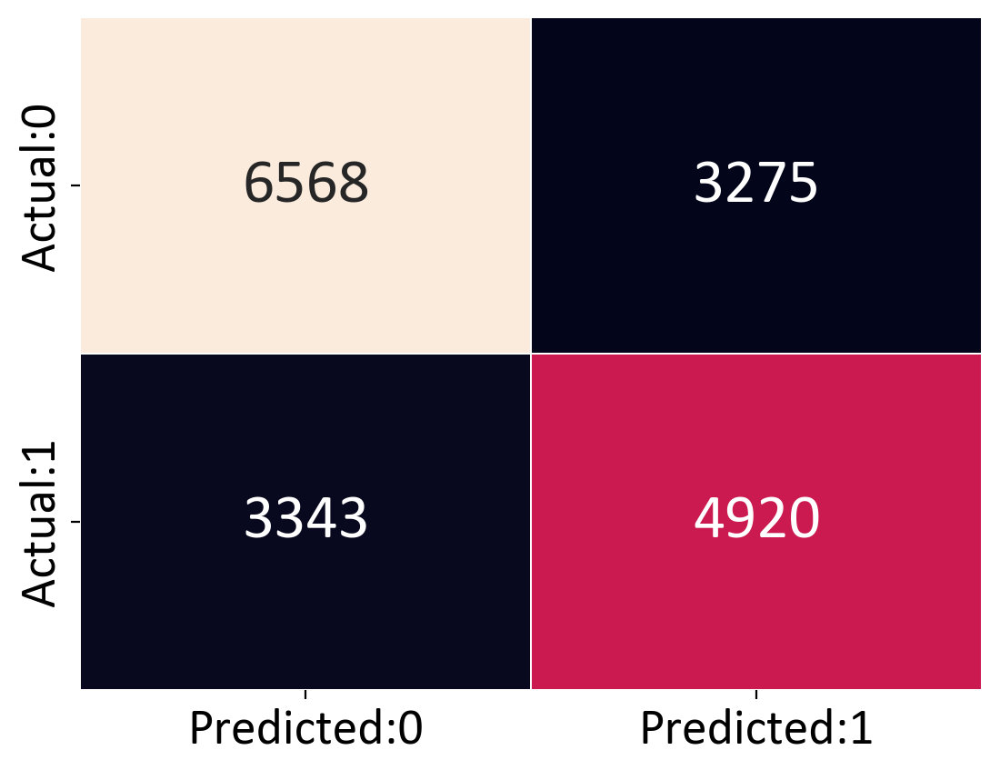

In [228]:
cm = confusion_matrix(ytest_dt, ypred_dt)
conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [229]:
print(classification_report(ytest_dt, ypred_dt))

              precision    recall  f1-score   support

           0       0.66      0.67      0.66      9843
           1       0.60      0.60      0.60      8263

    accuracy                           0.63     18106
   macro avg       0.63      0.63      0.63     18106
weighted avg       0.63      0.63      0.63     18106



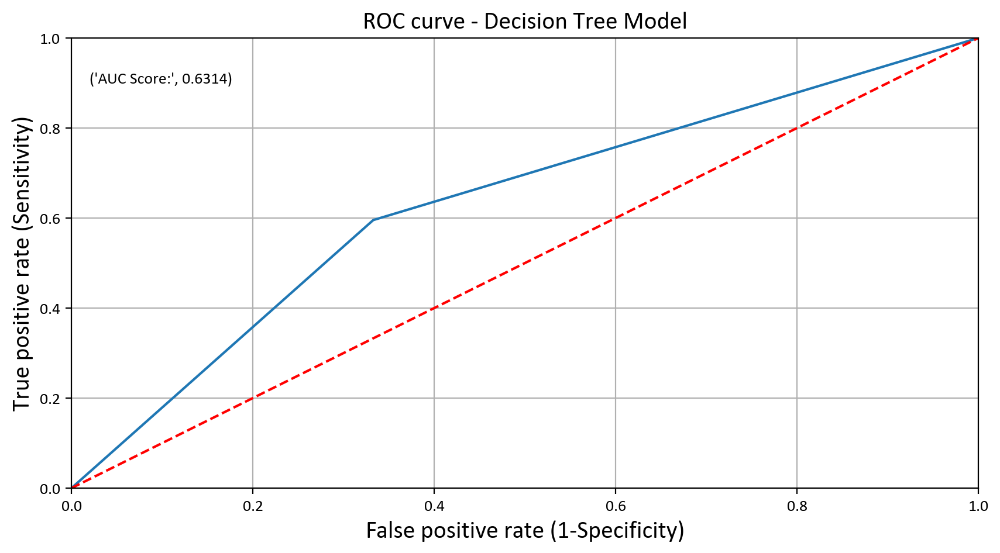

In [230]:
plt.figure(figsize = (10, 5))
fpr, tpr, thresholds = roc_curve(ytest_dt, ypred_proba_dt)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0, 1], [0, 1],'r--')
plt.title('ROC curve - Decision Tree Model', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(ytest_dt, ypred_proba_dt),4)))
plt.grid(True)

In [231]:
cols = ['test_accuracy', 'train_accuracy', 'test_precision', 'train_precision','test_recall','train_recall', 'test_kappa', 'train_kappa', 'f1_score','roc_auc_score']
model_evaluation = pd.DataFrame(columns=cols)
model_evaluation.loc['DecisionTree'] = [accuracy_score(ytest_dt, ypred_dt), accuracy_score(ytrain_dt, ypred_dt_train),
                                          precision_score(ytest_dt, ypred_dt), precision_score(ytrain_dt, ypred_dt_train),
                                          recall_score(ytest_dt, ypred_dt), recall_score(ytrain_dt, ypred_dt_train),
                                          cohen_kappa_score(ytest_dt, ypred_dt), cohen_kappa_score(ytrain_dt, ypred_dt_train),
                                          f1_score(ytest_dt, ypred_dt), roc_auc_score(ytest_dt, ypred_proba_dt)]
model_evaluation

,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_kappa,train_kappa,f1_score,roc_auc_score
DecisionTree,0.634486,0.898291,0.600366,0.905571,0.595425,0.866033,0.262875,0.794042,0.597886,0.631351


## XGBoost

In [232]:
xtrain_xg, xtest_xg, ytrain_xg, ytest_xg = train_test_split(X, df_target, test_size = 0.2, random_state = 500)
print('xtrain: ', xtrain_xg.shape)
print('ytrain: ', ytrain_xg.shape)
print('xtest: ', xtest_xg.shape)
print('ytest: ', ytest_xg.shape)

xtrain:  (72422, 21)
ytrain:  (72422,)
xtest:  (18106, 21)
ytest:  (18106,)


In [233]:
xtrain_xg2 = xtrain_xg.astype(int)
xtrain_xg2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 72422 entries, 12972 to 64346
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   purchased_approved           72422 non-null  int32
 1   delivered_estimated          72422 non-null  int32
 2   purchased_delivered          72422 non-null  int32
 3   price                        72422 non-null  int32
 4   freight_value                72422 non-null  int32
 5   product_weight_g             72422 non-null  int32
 6   product_length_cm            72422 non-null  int32
 7   product_height_cm            72422 non-null  int32
 8   product_width_cm             72422 non-null  int32
 9   geolocation_lat              72422 non-null  int32
 10  geolocation_lng              72422 non-null  int32
 11  payment_installments         72422 non-null  int32
 12  review_score                 72422 non-null  int32
 13  Monetary                     72422 non-null  in

In [234]:
xtest_xg2 = xtest_xg.astype(int)
xtest_xg2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18106 entries, 68625 to 44522
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   purchased_approved           18106 non-null  int32
 1   delivered_estimated          18106 non-null  int32
 2   purchased_delivered          18106 non-null  int32
 3   price                        18106 non-null  int32
 4   freight_value                18106 non-null  int32
 5   product_weight_g             18106 non-null  int32
 6   product_length_cm            18106 non-null  int32
 7   product_height_cm            18106 non-null  int32
 8   product_width_cm             18106 non-null  int32
 9   geolocation_lat              18106 non-null  int32
 10  geolocation_lng              18106 non-null  int32
 11  payment_installments         18106 non-null  int32
 12  review_score                 18106 non-null  int32
 13  Monetary                     18106 non-null  in

In [235]:
ytrain_xg2 = ytrain_xg.astype(int)
ytrain_xg2.info()

<class 'pandas.core.series.Series'>
Index: 72422 entries, 12972 to 64346
Series name: Churn
Non-Null Count  Dtype
--------------  -----
72422 non-null  int32
dtypes: int32(1)
memory usage: 848.7 KB


In [236]:
ytest_xg2 = ytest_xg.astype(int)
ytest_xg2.info()

<class 'pandas.core.series.Series'>
Index: 18106 entries, 68625 to 44522
Series name: Churn
Non-Null Count  Dtype
--------------  -----
18106 non-null  int32
dtypes: int32(1)
memory usage: 212.2 KB


In [237]:
tstats,pvals = stats.ttest_ind(xtrain_xg2, xtest_xg2)
ref_df = pd.DataFrame(pvals,index=xtrain_xg.columns,columns=['pvals'])
(ref_df < 0.05).any()

pvals    False
dtype: bool

In [238]:
xgBoost = XGBClassifier()
xbBoost = xgBoost.fit(xtrain_xg, ytrain_xg)

In [239]:
ypred_proba_xg = xgBoost.predict(xtest_xg)

In [240]:
ypred_xg = [0 if i < 0.5 else 1 for i in ypred_proba_xg]
ypred_xg[:10]

[0, 0, 0, 1, 1, 1, 1, 0, 1, 1]

In [241]:
ypred_proba_xg_train = xgBoost.predict(xtrain_xg)
ypred_xg_train = [0 if i < 0.5 else 1 for i in ypred_proba_xg_train]

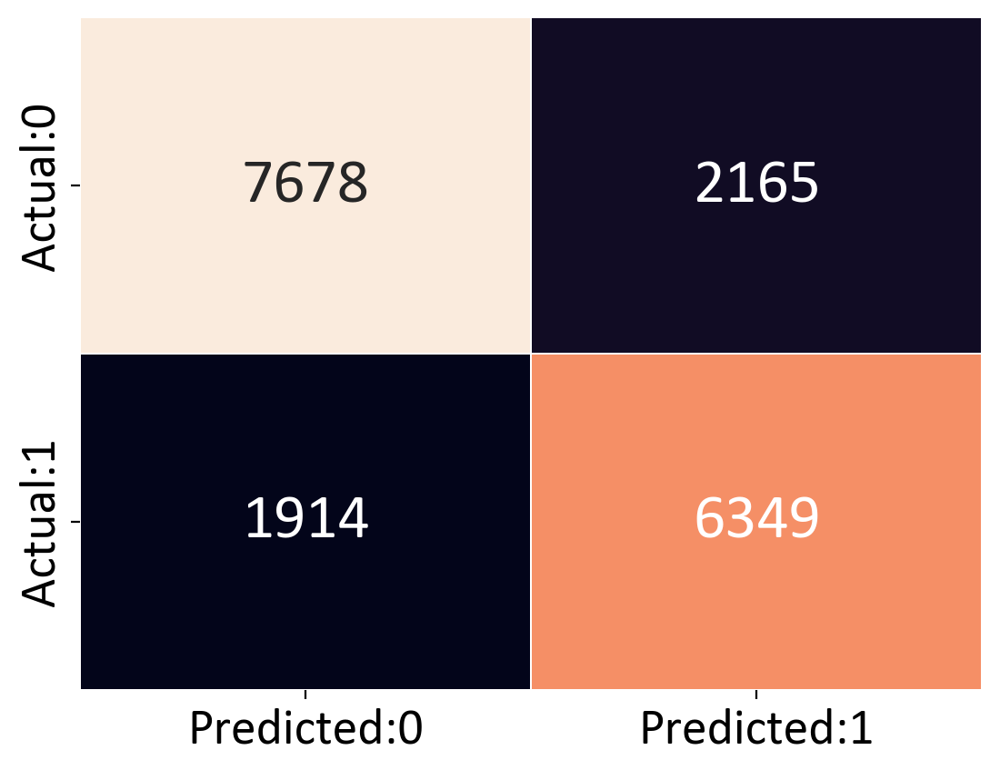

In [242]:
cm = confusion_matrix(ytest_xg, ypred_xg)
conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [243]:
print(classification_report(ytest_xg, ypred_xg))

              precision    recall  f1-score   support

           0       0.80      0.78      0.79      9843
           1       0.75      0.77      0.76      8263

    accuracy                           0.77     18106
   macro avg       0.77      0.77      0.77     18106
weighted avg       0.78      0.77      0.77     18106



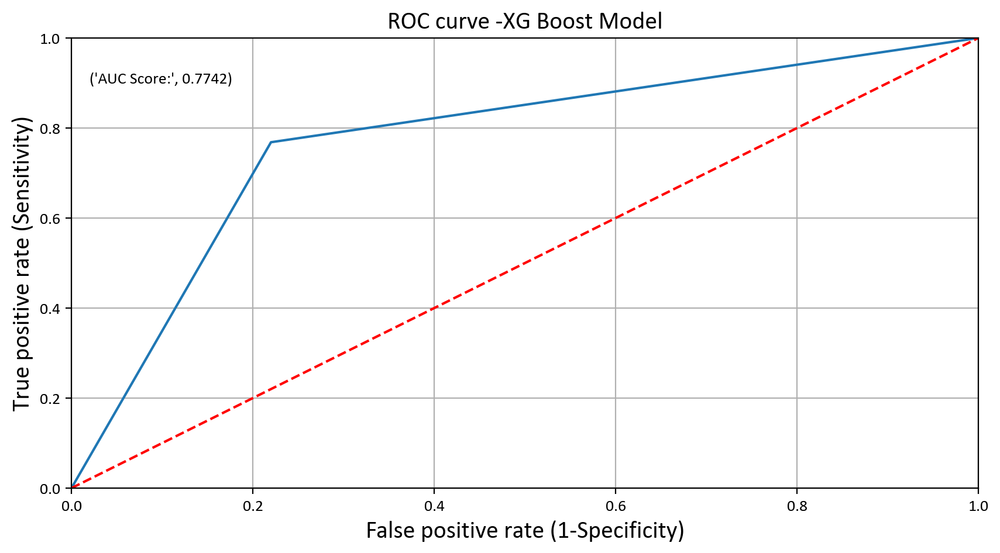

In [244]:
plt.figure(figsize = (10, 5))
fpr, tpr, thresholds = roc_curve(ytest_xg, ypred_proba_xg)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0, 1], [0, 1],'r--')
plt.title('ROC curve -XG Boost Model', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(ytest_xg, ypred_proba_xg),4)))
plt.grid(True)

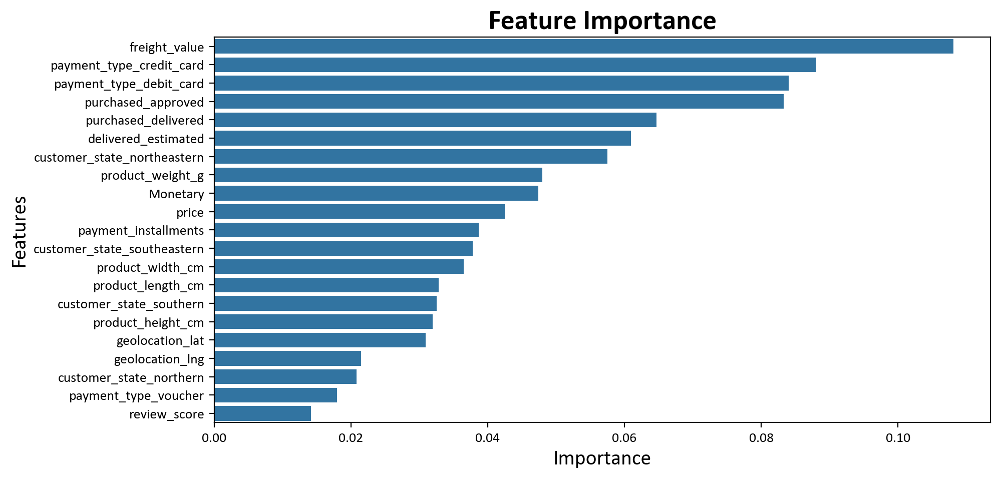

In [245]:
plt.figure(figsize=(10, 5))
important_features = pd.DataFrame({'Features': xtrain_xg.columns, 
                                   'Importance': xbBoost.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)
sns.barplot(x = 'Importance', y = 'Features', data = important_features)
plt.title('Feature Importance',color='black',fontsize=20,fontweight='bold')
plt.xlabel('Importance',color='black',fontsize=15)
plt.ylabel('Features',color='black',fontsize=15)
plt.show()

In [246]:
model_evaluation.loc['XGBoost'] = [accuracy_score(ytest_xg, ypred_xg), accuracy_score(ytrain_xg, ypred_xg_train),
                                          precision_score(ytest_xg, ypred_xg), precision_score(ytrain_xg, ypred_xg_train),
                                          recall_score(ytest_xg, ypred_xg), recall_score(ytrain_xg, ypred_xg_train),
                                          cohen_kappa_score(ytest_xg, ypred_xg), cohen_kappa_score(ytrain_xg, ypred_xg_train),
                                          f1_score(ytest_xg, ypred_xg), roc_auc_score(ytest_xg, ypred_proba_xg)]
model_evaluation

,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_kappa,train_kappa,f1_score,roc_auc_score
DecisionTree,0.634486,0.898291,0.600366,0.905571,0.595425,0.866033,0.262875,0.794042,0.597886,0.631351
XGBoost,0.774716,0.832772,0.745713,0.803229,0.768365,0.836074,0.547078,0.663796,0.756870,0.774206


## Random Forest

In [247]:
xtrain_random, xtest_random, ytrain_random, ytest_random = train_test_split(X, df_target, test_size = 0.2, random_state = 500)
print('xtrain: ', xtrain_random.shape)
print('ytrain: ', ytrain_random.shape)
print('xtest: ', xtest_random.shape)
print('ytest: ', ytest_random.shape)

xtrain:  (72422, 21)
ytrain:  (72422,)
xtest:  (18106, 21)
ytest:  (18106,)


In [248]:
xtrain_random2 = xtrain_random.astype(int)
xtrain_random2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 72422 entries, 12972 to 64346
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   purchased_approved           72422 non-null  int32
 1   delivered_estimated          72422 non-null  int32
 2   purchased_delivered          72422 non-null  int32
 3   price                        72422 non-null  int32
 4   freight_value                72422 non-null  int32
 5   product_weight_g             72422 non-null  int32
 6   product_length_cm            72422 non-null  int32
 7   product_height_cm            72422 non-null  int32
 8   product_width_cm             72422 non-null  int32
 9   geolocation_lat              72422 non-null  int32
 10  geolocation_lng              72422 non-null  int32
 11  payment_installments         72422 non-null  int32
 12  review_score                 72422 non-null  int32
 13  Monetary                     72422 non-null  in

In [249]:
ytrain_random2 = ytrain_random.astype(int)
ytrain_random2.info()

<class 'pandas.core.series.Series'>
Index: 72422 entries, 12972 to 64346
Series name: Churn
Non-Null Count  Dtype
--------------  -----
72422 non-null  int32
dtypes: int32(1)
memory usage: 848.7 KB


In [250]:
xtest_random2 = xtest_random.astype(int)
xtest_random2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18106 entries, 68625 to 44522
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   purchased_approved           18106 non-null  int32
 1   delivered_estimated          18106 non-null  int32
 2   purchased_delivered          18106 non-null  int32
 3   price                        18106 non-null  int32
 4   freight_value                18106 non-null  int32
 5   product_weight_g             18106 non-null  int32
 6   product_length_cm            18106 non-null  int32
 7   product_height_cm            18106 non-null  int32
 8   product_width_cm             18106 non-null  int32
 9   geolocation_lat              18106 non-null  int32
 10  geolocation_lng              18106 non-null  int32
 11  payment_installments         18106 non-null  int32
 12  review_score                 18106 non-null  int32
 13  Monetary                     18106 non-null  in

In [251]:
ytest_random2 = ytest_random.astype(int)
ytest_random2.info()

<class 'pandas.core.series.Series'>
Index: 18106 entries, 68625 to 44522
Series name: Churn
Non-Null Count  Dtype
--------------  -----
18106 non-null  int32
dtypes: int32(1)
memory usage: 212.2 KB


In [252]:
tstats,pvals = stats.ttest_ind(xtrain_random2, xtest_random2)
ref_df = pd.DataFrame(pvals,index=xtrain_random2.columns,columns=['pvals'])
(ref_df < 0.05).any()

pvals    False
dtype: bool

In [253]:
rand = RandomForestClassifier()
rand_model = rand.fit(xtrain_random,ytrain_random)

In [254]:
ypred_proba_random = rand_model.predict(xtest_random)

In [255]:
ypred_random = [0 if i < 0.5 else 1 for i in ypred_proba_random]
ypred_random[:10]

[0, 1, 0, 1, 1, 0, 1, 0, 1, 1]

In [256]:
ypred_proba_random_train = rand_model.predict(xtrain_random)
ypred_random_train = [0 if i < 0.5 else 1 for i in ypred_proba_random_train]

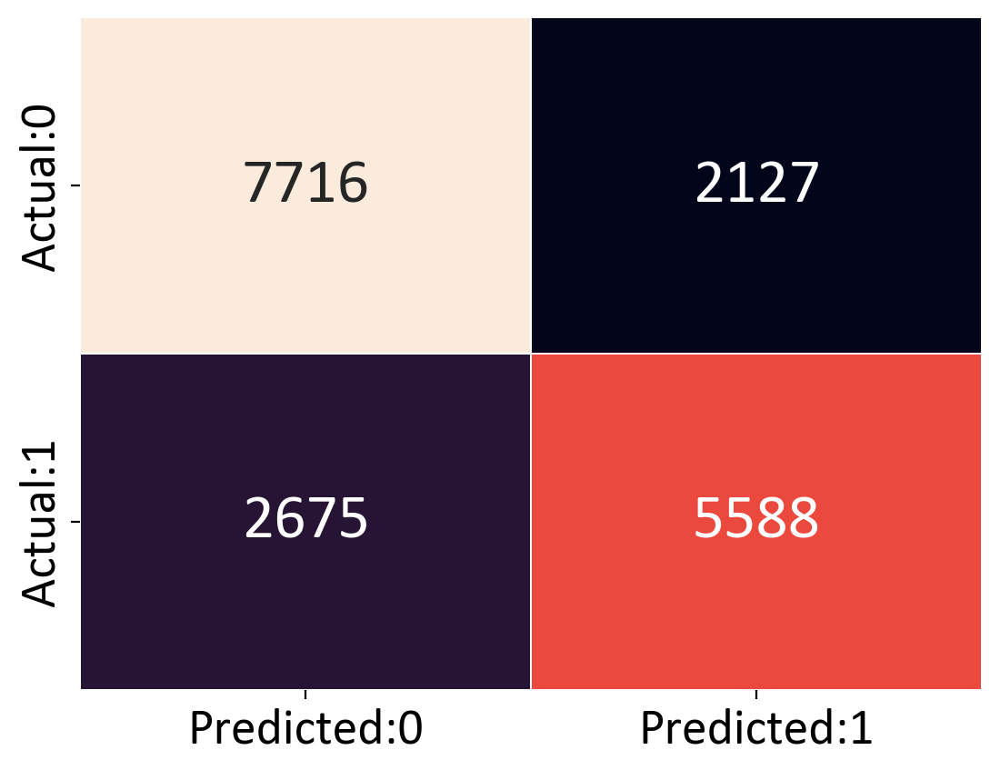

In [257]:
cm = confusion_matrix(ytest_random, ypred_random)
conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [258]:
print(classification_report(ytest_random, ypred_random))

              precision    recall  f1-score   support

           0       0.74      0.78      0.76      9843
           1       0.72      0.68      0.70      8263

    accuracy                           0.73     18106
   macro avg       0.73      0.73      0.73     18106
weighted avg       0.73      0.73      0.73     18106



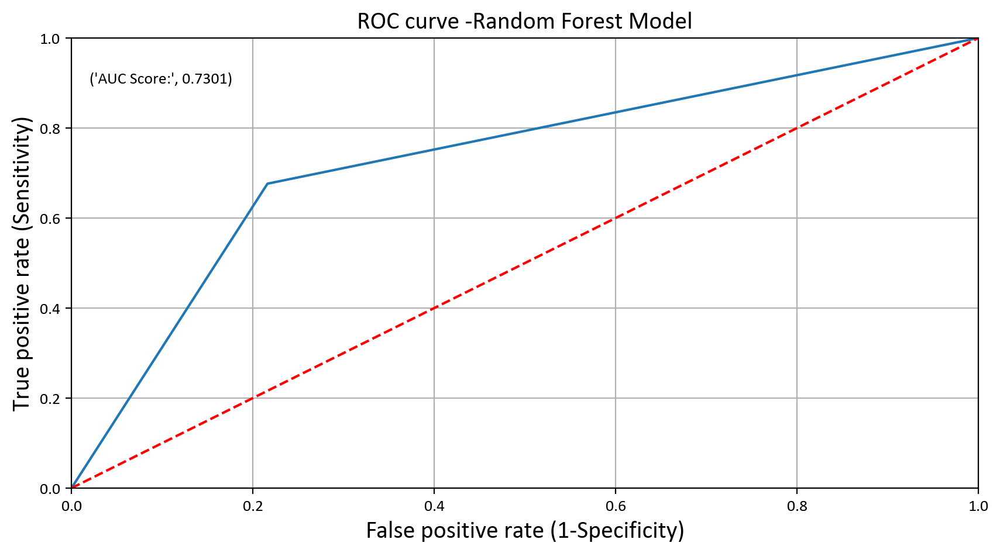

In [259]:
plt.figure(figsize = (10, 5))
fpr, tpr, thresholds = roc_curve(ytest_random, ypred_proba_random)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0, 1], [0, 1],'r--')
plt.title('ROC curve -Random Forest Model', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(ytest_random, ypred_proba_random),4)))
plt.grid(True)

In [260]:
model_evaluation.loc['RandomForest Classifier'] = [accuracy_score(ytest_random, ypred_random), accuracy_score(ytrain_random, ypred_random_train),
                                          precision_score(ytest_random, ypred_random), precision_score(ytrain_random, ypred_random_train),
                                          recall_score(ytest_random, ypred_random), recall_score(ytrain_random, ypred_random_train),
                                          cohen_kappa_score(ytest_random, ypred_random), cohen_kappa_score(ytrain_random, ypred_random_train),
                                          f1_score(ytest_random, ypred_random), roc_auc_score(ytest_random, ypred_proba_random)]
model_evaluation

,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_kappa,train_kappa,f1_score,roc_auc_score
DecisionTree,0.634486,0.898291,0.600366,0.905571,0.595425,0.866033,0.262875,0.794042,0.597886,0.631351
XGBoost,0.774716,0.832772,0.745713,0.803229,0.768365,0.836074,0.547078,0.663796,0.756870,0.774206
RandomForest Classifier,0.734784,1.000000,0.724303,1.000000,0.676268,1.000000,0.462638,1.000000,0.699462,0.730088


In [261]:
model_evaluation.sort_values(by='f1_score',ascending=False)

,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_kappa,train_kappa,f1_score,roc_auc_score
XGBoost,0.774716,0.832772,0.745713,0.803229,0.768365,0.836074,0.547078,0.663796,0.756870,0.774206
RandomForest Classifier,0.734784,1.000000,0.724303,1.000000,0.676268,1.000000,0.462638,1.000000,0.699462,0.730088
DecisionTree,0.634486,0.898291,0.600366,0.905571,0.595425,0.866033,0.262875,0.794042,0.597886,0.631351


Melihat skor recall pada data uji, kami menyimpulkan bahwa 2 model terbaik adalah XGBoost dan Random Forest Classifier

## RFE XGBoost

In [262]:
X_train_rfe = xtrain_xg.iloc[:,1:]
X_test_rfe = xtest_xg.iloc[:,1:]
xg =  XGBClassifier()
xgb_model = RFE(estimator = xg, n_features_to_select = 10)
rfe_model = xgb_model.fit(X_train_rfe, ytrain_xg)
feat_index = pd.Series(data = rfe_model.ranking_, index = X_train_rfe.columns)
signi_feat_rfe_xg = feat_index[feat_index==1].index
print(signi_feat_rfe_xg)

Index(['delivered_estimated', 'purchased_delivered', 'price', 'freight_value',
       'product_weight_g', 'product_width_cm', 'Monetary',
       'customer_state_northeastern', 'customer_state_southeastern',
       'payment_type_debit_card'],
      dtype='object')


In [263]:
xtrain_xg, xtest_xg, ytrain_xg, ytest_xg = train_test_split(X[signi_feat_rfe_xg], df_target, random_state = 500, test_size = 0.2)
print('xtrain: ', xtrain_xg.shape)
print('ytrain: ', ytrain_xg.shape)
print('xtest: ', xtest_xg.shape)
print('ytest: ', ytest_xg.shape)

xtrain:  (72422, 10)
ytrain:  (72422,)
xtest:  (18106, 10)
ytest:  (18106,)


In [264]:
xtrain_xg2 = xtrain_xg.astype(int)
ytrain_xg2 = ytrain_xg.astype(int)
xtest_xg2 = xtest_xg.astype(int)
ytest_xg2 = ytest_xg.astype(int)

In [265]:
tstats,pvals = stats.ttest_ind(xtrain_xg2, xtest_xg2)
ref_df = pd.DataFrame(pvals,index=xtrain_xg2.columns,columns=['pvals'])
(ref_df < 0.05).any()

pvals    False
dtype: bool

In [266]:
gBoost = XGBClassifier()
xbBoost = xgBoost.fit(xtrain_xg, ytrain_xg)

In [267]:
ypred_proba_xg = xgBoost.predict(xtest_xg)
ypred_xg = [0 if i < 0.5 else 1 for i in ypred_proba_xg]
ypred_xg[:10]

[0, 0, 0, 1, 1, 0, 1, 0, 1, 1]

In [268]:
ypred_proba_xg_train = xgBoost.predict(xtrain_xg)
ypred_xg_train = [0 if i < 0.5 else 1 for i in ypred_proba_xg_train]

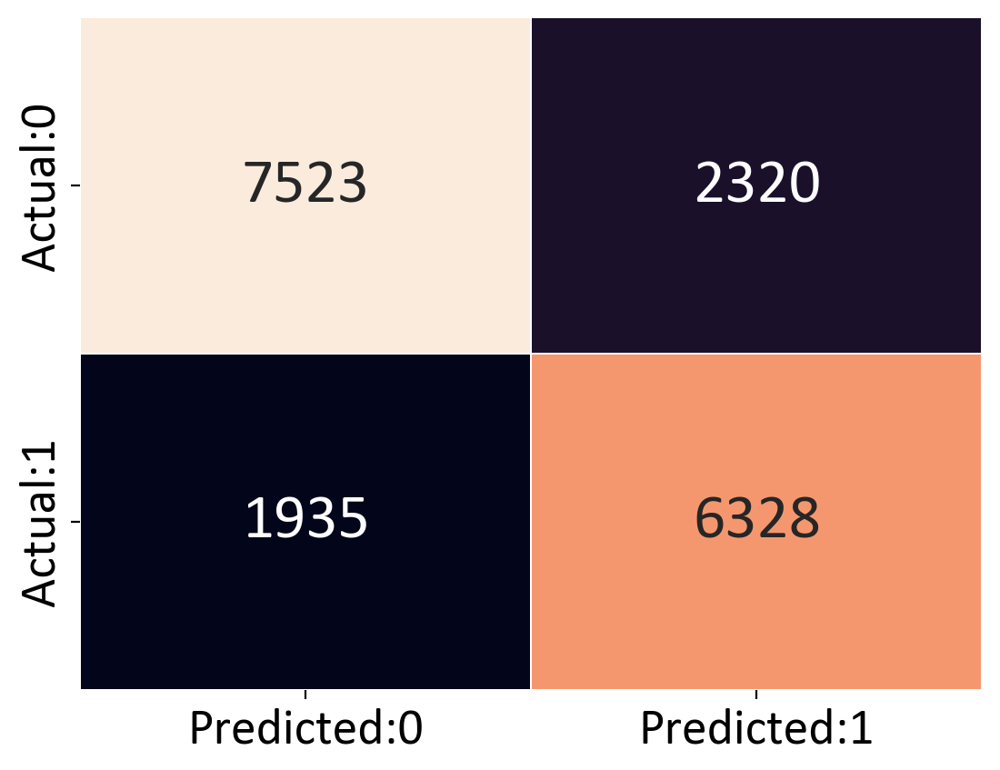

In [269]:
cm = confusion_matrix(ytest_xg, ypred_xg)
conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [270]:
print(classification_report(ytest_xg, ypred_xg))

              precision    recall  f1-score   support

           0       0.80      0.76      0.78      9843
           1       0.73      0.77      0.75      8263

    accuracy                           0.76     18106
   macro avg       0.76      0.77      0.76     18106
weighted avg       0.77      0.76      0.77     18106



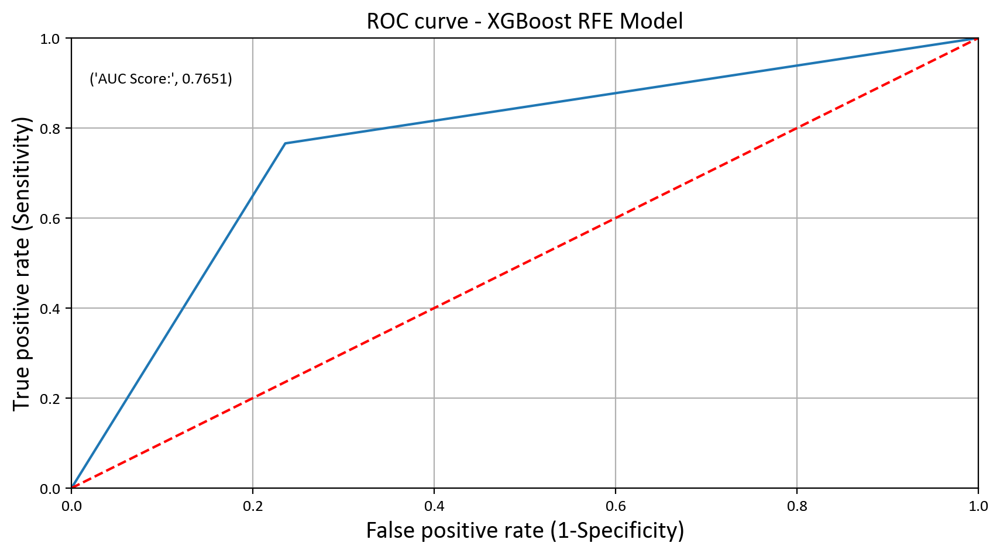

In [271]:
plt.figure(figsize = (10, 5))
fpr, tpr, thresholds = roc_curve(ytest_xg, ypred_proba_xg)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0, 1], [0, 1],'r--')
plt.title('ROC curve - XGBoost RFE Model', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(ytest_xg, ypred_proba_xg),4)))
plt.grid(True)

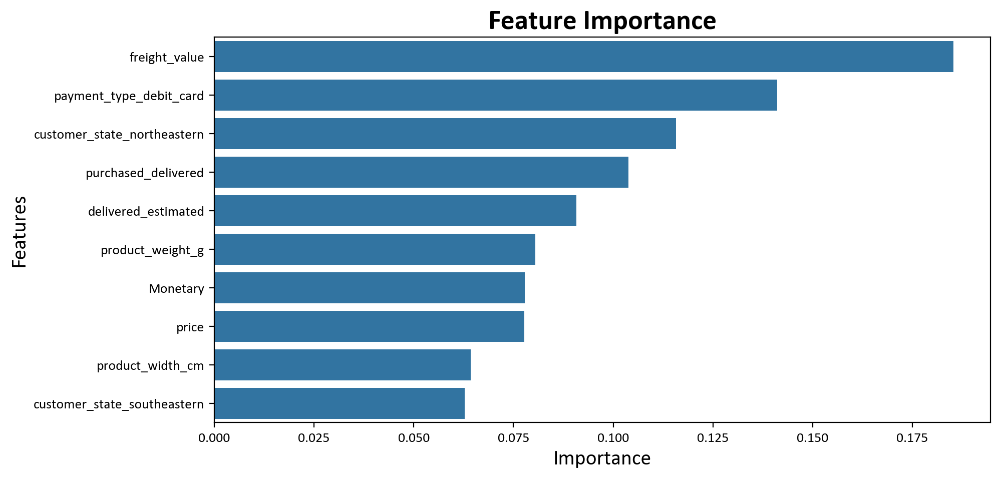

In [272]:
plt.figure(figsize=(10, 5))
important_features = pd.DataFrame({'Features': xtrain_xg.columns, 
                                   'Importance': xbBoost.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)
sns.barplot(x = 'Importance', y = 'Features', data = important_features)
plt.title('Feature Importance',color='black',fontsize=20,fontweight='bold')
plt.xlabel('Importance',color='black',fontsize=15)
plt.ylabel('Features',color='black',fontsize=15)
plt.show()

In [273]:
cols = ['test_accuracy', 'train_accuracy', 'test_precision', 'train_precision','test_recall','train_recall', 'test_kappa', 'train_kappa', 'f1_score','roc_auc_score']
RFE_model_evaluation = pd.DataFrame(columns=cols)
RFE_model_evaluation.loc['XGBoost RFE'] = [accuracy_score(ytest_xg, ypred_xg), accuracy_score(ytrain_xg, ypred_xg_train),
                                          precision_score(ytest_xg, ypred_xg), precision_score(ytrain_xg, ypred_xg_train),
                                          recall_score(ytest_xg, ypred_xg), recall_score(ytrain_xg, ypred_xg_train),
                                          cohen_kappa_score(ytest_xg, ypred_xg), cohen_kappa_score(ytrain_xg, ypred_xg_train),
                                          f1_score(ytest_xg, ypred_xg), roc_auc_score(ytest_xg, ypred_proba_xg)]
RFE_model_evaluation

,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_kappa,train_kappa,f1_score,roc_auc_score
XGBoost RFE,0.764995,0.8105,0.73173,0.773878,0.765824,0.822464,0.528148,0.619725,0.748389,0.765062


## RFE Random Forest

In [274]:
X_train_rfe = xtrain_random.iloc[:,1:]
X_test_rfe = xtest_random.iloc[:,1:]
rand =  RandomForestClassifier()
rand_model = RFE(estimator = rand, n_features_to_select = 10)
rfe_model = rand_model.fit(X_train_rfe, ytrain_random)
feat_index = pd.Series(data = rfe_model.ranking_, index = X_train_rfe.columns)
signi_feat_rfe_rf = feat_index[feat_index==1].index
print(signi_feat_rfe_rf)

Index(['delivered_estimated', 'purchased_delivered', 'price', 'freight_value',
       'product_weight_g', 'product_length_cm', 'product_height_cm',
       'geolocation_lat', 'geolocation_lng', 'Monetary'],
      dtype='object')


In [275]:
xtrain_random, xtest_random, ytrain_random, ytest_random = train_test_split(X[signi_feat_rfe_rf], df_target, random_state = 500, test_size = 0.2)
print('xtrain: ', xtrain_random.shape)
print('ytrain: ', ytrain_random.shape)
print('xtest: ', xtest_random.shape)
print('ytest: ', ytest_random.shape)

xtrain:  (72422, 10)
ytrain:  (72422,)
xtest:  (18106, 10)
ytest:  (18106,)


In [276]:
xtrain_random2 = xtrain_random.astype(int)
ytrain_random2 = ytrain_random.astype(int)
xtest_random2 = xtest_random.astype(int)
ytest_random2 = ytest_random.astype(int)

In [277]:
tstats,pvals = stats.ttest_ind(xtrain_random2, xtest_random2)
ref_df = pd.DataFrame(pvals,index=xtrain_random2.columns,columns=['pvals'])
(ref_df < 0.05).any()

pvals    False
dtype: bool

In [278]:
rand = RandomForestClassifier()
rand_model = rand.fit(xtrain_random,ytrain_random)

In [279]:
ypred_proba_random = rand_model.predict(xtest_random)
ypred_random = [0 if i < 0.5 else 1 for i in ypred_proba_random]
ypred_random[:10]

[0, 0, 0, 1, 1, 0, 0, 0, 1, 1]

In [280]:
ypred_proba_random_train = rand_model.predict(xtrain_random)
ypred_random_train = [0 if i < 0.5 else 1 for i in ypred_proba_random_train]

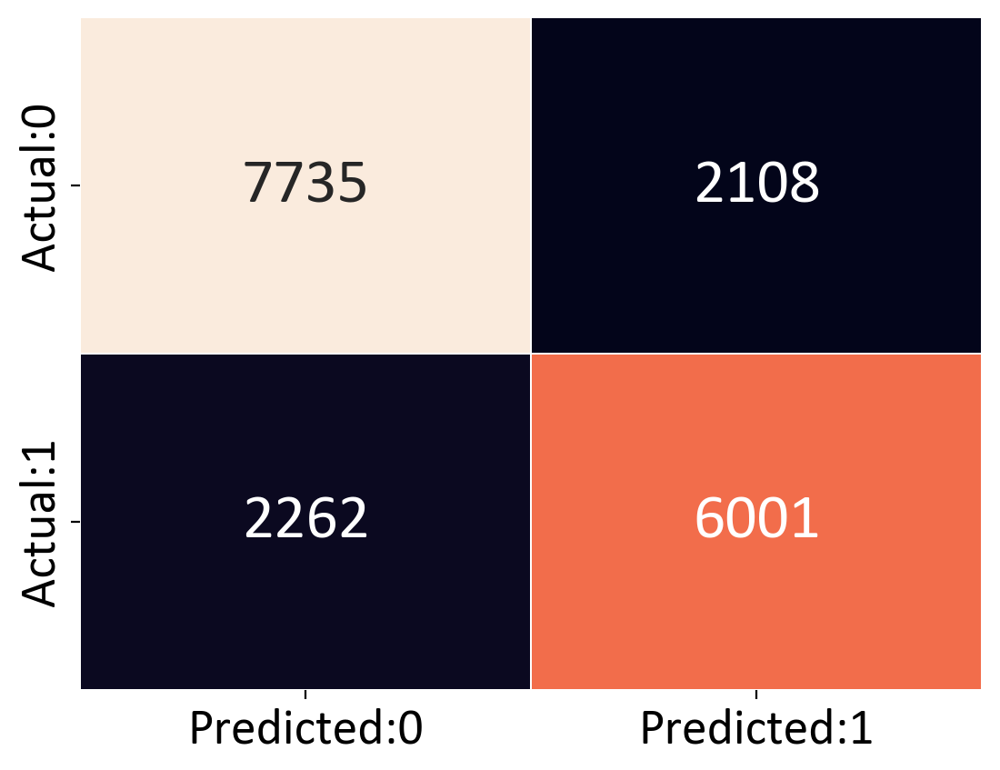

In [281]:
cm = confusion_matrix(ytest_random, ypred_random)
conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [282]:
print(classification_report(ytest_random, ypred_random))

              precision    recall  f1-score   support

           0       0.77      0.79      0.78      9843
           1       0.74      0.73      0.73      8263

    accuracy                           0.76     18106
   macro avg       0.76      0.76      0.76     18106
weighted avg       0.76      0.76      0.76     18106



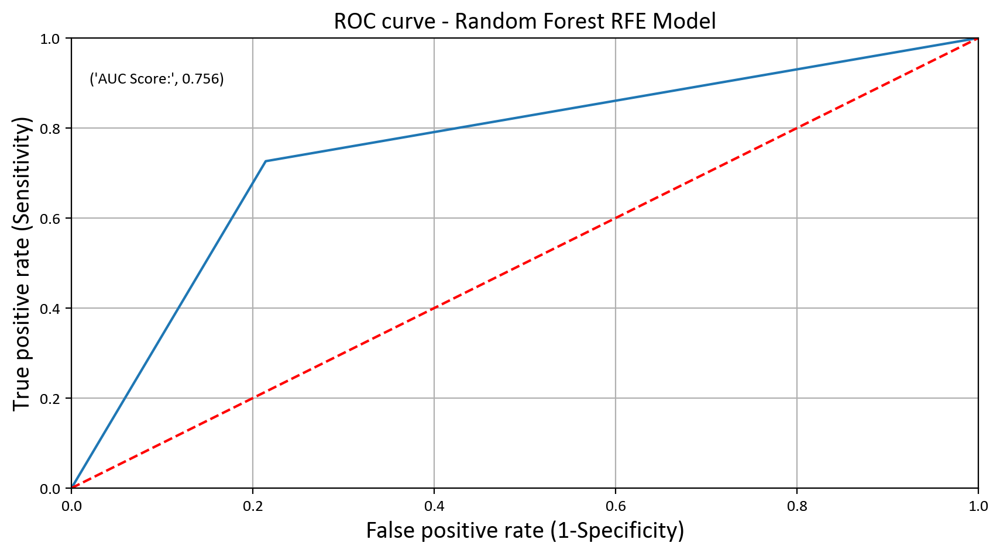

In [283]:
plt.figure(figsize = (10, 5))
fpr, tpr, thresholds = roc_curve(ytest_random, ypred_proba_random)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0, 1], [0, 1],'r--')
plt.title('ROC curve - Random Forest RFE Model', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(ytest_random, ypred_proba_random),4)))
plt.grid(True)

In [284]:
RFE_model_evaluation.loc['RandomForest Classifier'] = [accuracy_score(ytest_random, ypred_random), accuracy_score(ytrain_random, ypred_random_train),
                                          precision_score(ytest_random, ypred_random), precision_score(ytrain_random, ypred_random_train),
                                          recall_score(ytest_random, ypred_random), recall_score(ytrain_random, ypred_random_train),
                                          cohen_kappa_score(ytest_random, ypred_random), cohen_kappa_score(ytrain_random, ypred_random_train),
                                          f1_score(ytest_random, ypred_random), roc_auc_score(ytest_random, ypred_proba_random)]
RFE_model_evaluation

,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_kappa,train_kappa,f1_score,roc_auc_score
XGBoost RFE,0.764995,0.810500,0.731730,0.773878,0.765824,0.822464,0.528148,0.619725,0.748389,0.765062
RandomForest Classifier,0.758644,0.999986,0.740042,1.000000,0.726250,0.999970,0.512854,0.999972,0.733081,0.756044


Melihat f-1 score pada data uji, kami menyimpulkan bahwa XGBoost adalah model terbaik di sini. Maka kami melakukan hyperparameter tuning pada XGBoost.

## Hyperparameter Tuning

In [285]:
xtrain_xg, xtest_xg, ytrain_xg, ytest_xg = train_test_split(X[signi_feat_rfe_xg], df_target, test_size = 0.2, random_state = 500)
print('xtrain: ', xtrain_xg.shape)
print('ytrain: ', ytrain_xg.shape)
print('xtest: ', xtest_xg.shape)
print('ytest: ', ytest_xg.shape)

xtrain:  (72422, 10)
ytrain:  (72422,)
xtest:  (18106, 10)
ytest:  (18106,)


In [286]:
xgb = XGBClassifier(random_state = 10)
parameters = [{'n_estimators': [30, 40, 50, 70, 90],
               'max_depth': range(2, 7),
                'learning_rate': [0.1, 0.2, 0.4, 0.5]}]
gcv_xgb = GridSearchCV(estimator = xgb, param_grid = parameters, cv = 5)
gcv_xgb.fit(xtrain_xg, ytrain_xg)
gcv_xgb.best_params_

{'learning_rate': 0.4, 'max_depth': 6, 'n_estimators': 90}

In [287]:
xgBoost = XGBClassifier(learning_rate = 0.5,max_depth = 6,n_estimators = 90)
xgBoost.fit(xtrain_xg, ytrain_xg)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=90, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [288]:
ypred_proba_xg = xgBoost.predict(xtest_xg)
ypred_xg = [0 if i < 0.5 else 1 for i in ypred_proba_xg]
ypred_xg[:10]

[0, 0, 0, 1, 1, 1, 1, 0, 1, 1]

In [289]:
ypred_proba_xg_train = xgBoost.predict(xtrain_xg)
ypred_xg_train = [0 if i < 0.5 else 1 for i in ypred_proba_xg_train]

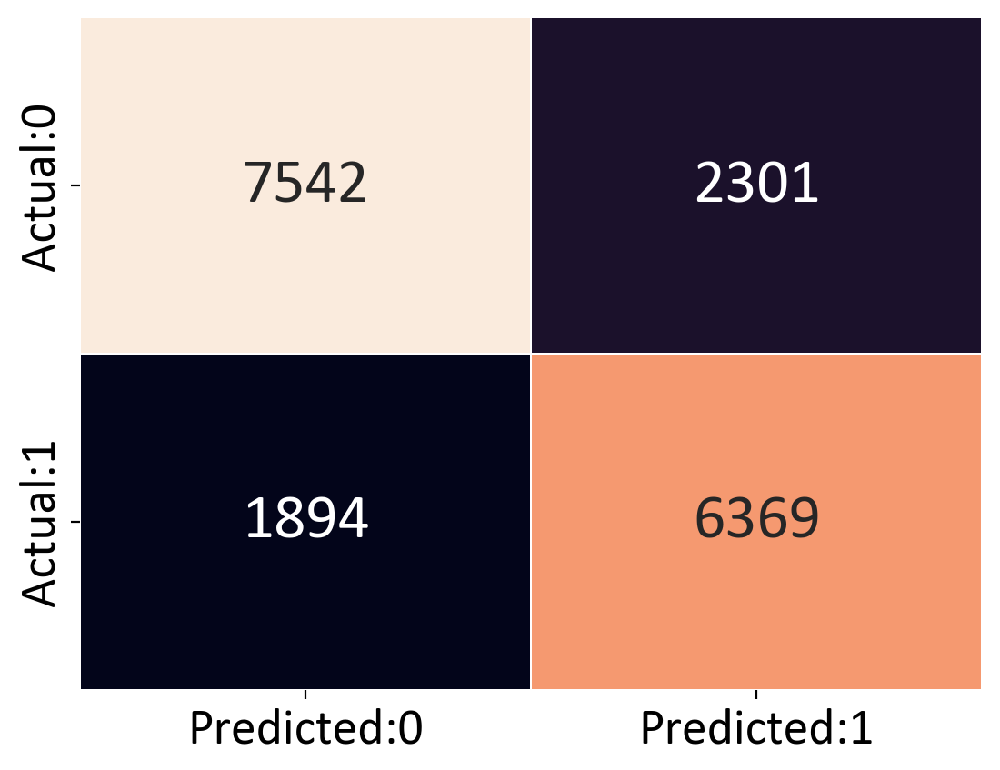

In [290]:
cm = confusion_matrix(ytest_xg, ypred_xg)
conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [291]:
print(classification_report(ytest_xg, ypred_xg))

              precision    recall  f1-score   support

           0       0.80      0.77      0.78      9843
           1       0.73      0.77      0.75      8263

    accuracy                           0.77     18106
   macro avg       0.77      0.77      0.77     18106
weighted avg       0.77      0.77      0.77     18106



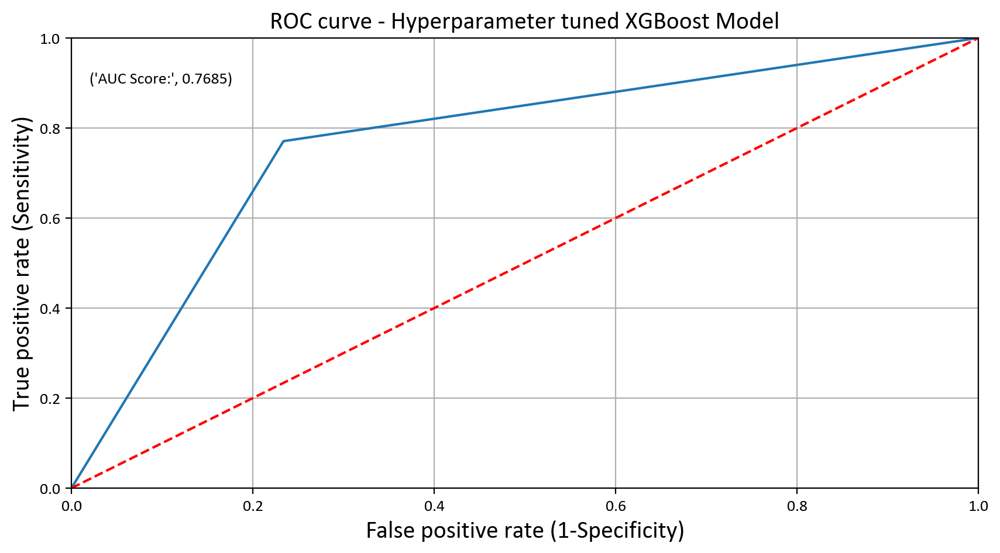

In [292]:
plt.figure(figsize = (10, 5))
fpr, tpr, thresholds = roc_curve(ytest_xg, ypred_proba_xg)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0, 1], [0, 1],'r--')
plt.title('ROC curve - Hyperparameter tuned XGBoost Model', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(ytest_xg, ypred_proba_xg),4)))
plt.grid(True)

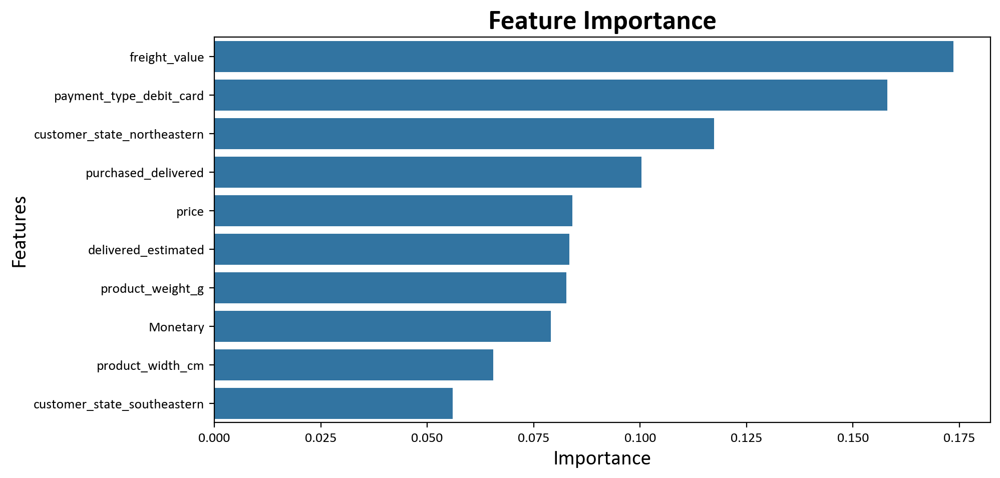

In [293]:
plt.figure(figsize=(10, 5))
important_features = pd.DataFrame({'Features': xtrain_xg.columns, 
                                   'Importance': xgBoost.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)
sns.barplot(x = 'Importance', y = 'Features', data = important_features)
plt.title('Feature Importance',color='black',fontsize=20,fontweight='bold')
plt.xlabel('Importance',color='black',fontsize=15)
plt.ylabel('Features',color='black',fontsize=15)
plt.show()

In [294]:
cols = ['test_accuracy', 'train_accuracy', 'test_precision', 'train_precision','test_recall','train_recall', 'test_kappa', 'train_kappa', 'f1_score','roc_auc_score']
model_evaluation_tuned = pd.DataFrame(columns=cols)
model_evaluation_tuned.loc['Tuned XGBoost Classifier'] = [accuracy_score(ytest_xg, ypred_xg), accuracy_score(ytrain_xg, ypred_xg_train),
                                          precision_score(ytest_xg, ypred_xg), precision_score(ytrain_xg, ypred_xg_train),
                                          recall_score(ytest_xg, ypred_xg), recall_score(ytrain_xg, ypred_xg_train),
                                          cohen_kappa_score(ytest_xg, ypred_xg), cohen_kappa_score(ytrain_xg, ypred_xg_train),
                                          f1_score(ytest_xg, ypred_xg), roc_auc_score(ytest_xg, ypred_proba_xg)]
model_evaluation_tuned

,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_kappa,train_kappa,f1_score,roc_auc_score
Tuned XGBoost Classifier,0.768309,0.83019,0.734602,0.797337,0.770785,0.838753,0.534901,0.658925,0.752259,0.768508


## Model Interpretation

Model ini diukur menggunakan metrik F1 Score karena ingin melihat keseimbangan antara recall dan precision. Model ini memiliki skor recall 0.75, dengan XGBoost sebagai model terbaik untuk memprediksi churn.

In [295]:
# Define classifiers
classifiers = {
    "descison tree": DecisionTreeClassifier(),
    "random forest": RandomForestClassifier(),
    "adaboost": AdaBoostClassifier(),
    "gradient boost": GradientBoostingClassifier(),
    'xgboost': XGBClassifier(),
    "svm": SVC()
}

# DataFrame to store model evaluation metrics
model_reports = []

# Loop through classifiers, train, and evaluate
for clf_name, clf in classifiers.items():
    clf.fit(xtrain_xg, ytrain_xg)
    y_pred = clf.predict(xtest_xg)
    print("Fitting the model...", clf_name)
    metrics = {
        "model": clf_name,
        "accuracy": accuracy_score(ytest_xg, y_pred),
        "precision": precision_score(ytest_xg, y_pred),
        "recall": recall_score(ytest_xg, y_pred),
        "f1 score": f1_score(ytest_xg, y_pred)
    }
    model_reports.append(metrics)

# Convert list of dictionaries to DataFrame
model_reports_df = pd.DataFrame(model_reports)

# Sort the models by recall
model_reports_df.sort_values(by='f1 score', ascending=False, inplace=True)
print(model_reports_df)

Fitting the model... descison tree
Fitting the model... random forest
Fitting the model... adaboost
Fitting the model... gradient boost
Fitting the model... xgboost
Fitting the model... svm
            model  accuracy  precision    recall  f1 score
4         xgboost  0.764995   0.731730  0.765824  0.748389
1   random forest  0.756821   0.735999  0.728428  0.732194
0   descison tree  0.696951   0.669807  0.662592  0.666180
3  gradient boost  0.679830   0.656790  0.625076  0.640541
2        adaboost  0.647796   0.622818  0.578724  0.599962
5             svm  0.543632   0.000000  0.000000  0.000000


# Save and Load Pickle

In [296]:
# Save model
import pickle

estimator = classifiers['xgboost']
estimator.fit(xtrain_xg, ytrain_xg)

pickle.dump(estimator, open('Model_Olist_Brazil_Ecommerce_XGB_Delta.pkl', 'wb'))

In [297]:
# Load model
filename = 'Model_Olist_Brazil_Ecommerce_XGB_Delta.pkl'
loaded_model = pickle.load(open(filename, 'rb'))

In [298]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

print('Score : {}'.format(np.sqrt(mean_squared_error(ytest_xg, loaded_model.predict(xtest_xg)))))

Score : 0.4847731126289241


# Conclusions

1. Kepuasan Pelanggan Tinggi: Sebagian besar pelanggan memberikan skor ulasan tinggi, menunjukkan kepuasan mereka terhadap produk dan layanan perusahaan.Pelanggan yang memberikan skor 5 pada review (pelanggan yang puas) memberikan komentar mengenai:
    - Pengiriman cepat, sebelum tenggat waktu (chegou antes prazo, produto chegou antes, dll.)
    - Produk yang berkualitas (produto otima qualidade,produto boa qualidade)
2. Pengiriman Berpengaruh: Pengiriman tepat waktu cenderung meningkatkan kepuasan pelanggan, sedangkan pengiriman terlambat memiliki dampak negatif pada ulasan pelanggan. Pesanan pertama dibuat pada tanggal 15/09/2016 dan pesanan terakhir dibuat pada tanggal 29/08/2018.Pesanan diantar dalam 0-28 hari sejak pelanggan mulai memesan produk, dengan rata-rata sekitar 11 hari.
3. Black Friday Sale Berpengaruh: Penjualan pada Black Friday mencapai puncak tertinggi, menunjukkan potensi untuk meningkatkan pendapatan dengan mengoptimalkan promosi pada event serupa.
4. Jam dan Hari Puncak: Penjualan lebih tinggi pada hari kerja, khususnya Senin dan Selasa, antara jam 11 pagi hingga jam 4 sore.
5. Kategori Produk Tertentu Mempengaruhi Penjualan: Produk dalam kategori bed_bath_table memiliki penjualan tertinggi, sedangkan kategori health_beauty memiliki revenue tertinggi.
6. Pelanggan yang Tidak Puas Lebih Aktif Berpendapat: Pelanggan yang tidak puas cenderung lebih aktif dalam memberikan ulasan negatif.
7. Pelanggan yang memberikan skor 1 pada review (pelanggan yang tidak puas) memberikan komentar mengenai:Produk tidak diterima (nao recebi produto, agora nao recebi, dll) dan Kualitas produk yang buruk (produto pessima qualidade).
8. Pengiriman dan Kualitas Produk Penting: Pengiriman tepat waktu dan kualitas produk merupakan faktor utama yang mempengaruhi ulasan pelanggan.
9. Sebanyak 2997 pelanggan melakukan pembelian berulang. Sekitar 6% dari pelanggan berulang menyumbang total penjualan, yang merupakan angka rendah mengingat Olist memiliki total basis pelanggan sebesar 99441.
10. Jenis pembayaran yang paling sering digunakan oleh pelanggan Olist adalah kartu kredit yang menyumbang 74,3% dari total pembayaran, diikuti oleh boleto sebesar 19,16%.

# Recommendations

1. Promosi Khusus untuk Pelanggan Berpotensi Churn: Identifikasi pelanggan yang berpotensi churn berdasarkan pola pembelian dan ulasan mereka. Berikan promosi khusus atau diskon untuk mempertahankan mereka.
2. Meningkatkan Kualitas Layanan Pengiriman: Evaluasi proses logistik untuk memastikan pengiriman tepat waktu dan kualitas produk yang baik. Pelajari pesanan dengan pengiriman terlambat untuk menemukan penyebabnya dan perbaiki prosesnya.
3. Memanfaatkan Event Black Friday dan Hari Puncak Lainnya: Rencanakan promosi khusus dan penawaran diskon selama event seperti Black Friday untuk meningkatkan penjualan dan pendapatan.
4. Meningkatkan Komunikasi dengan Pelanggan: Berikan informasi yang jelas mengenai perkiraan pengiriman dan pemberitahuan status pesanan kepada pelanggan untuk mengurangi kekecewaan terkait pengiriman.
5. Program Loyalitas dan Reward: Berikan reward atau poin loyalitas bagi pelanggan setia sebagai insentif tambahan untuk mempertahankan mereka.
6. Segmentasi Pelanggan: Gunakan analisis data untuk memahami preferensi pelanggan dan segmentasi mereka. Berikan penawaran yang sesuai dengan kebutuhan dan preferensi masing-masing segmen.
7. Investasi dalam Layanan Pelanggan: Tingkatkan layanan pelanggan untuk menangani keluhan atau masalah dengan cepat dan efektif. Hal ini dapat meningkatkan kepuasan pelanggan dan memperkuat hubungan dengan mereka.
8. Optimalkan Promosi Produk Terlaris: Fokuskan upaya promosi pada produk dalam kategori yang paling diminati oleh pelanggan untuk meningkatkan penjualan.
9. Bekerja sama dengan pihak kartu kredit untuk dapat mengencarkan promo-promo yang dapat menarik customer untuk berbelanja melalui Olist Brazillian E-commerce